In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import tsfresh

# 获取上一级目录
path = os.path.dirname(os.getcwd())
path

'/home/adt/project/molding'

In [2]:
x_train_file = '/wang/X_data_train_1022_20201005.csv'
y_train_file = '/wang/Y_data_train_20201002.csv'
x_sub_file = '/wang/X_data_test_1022_20201005.csv'


df_x_train = pd.read_csv(path + x_train_file, index_col = 0)
df_y_train = pd.read_csv(path + y_train_file, index_col = 0)
df_x_sub = pd.read_csv(path + x_sub_file, index_col = 0)

df_x_train

,EL_CYC_TIME,EL_PLST_TIME,EL_LAST_COOL_TIME,EL_MC_TIME,EL_MO_TIME,EL_EF_TIME,EL_EB_TIME,EL_IDLE_TIME,EL_CORE_IN_TIME_0,EL_CORE_OUT_TIME_0,...,0_Sensor8__length,0_Sensor8__maximum,0_Sensor8__mean,0_Sensor8__minimum,0_Sensor8__standard_deviation,0_Sensor8__number_cwt_peaks__n_10,0_Sensor8__number_peaks__n_10,0_Sensor8__mean_abs_change,0_Sensor8__skewness,0_Sensor8__kurtosis
0,37.376,6.252,5.748,3.101,1.969,1.057,1.915,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,37.362,6.762,5.238,3.093,1.965,1.054,1.913,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,37.376,6.254,5.746,3.106,1.968,1.053,1.910,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,37.372,6.605,5.395,3.098,1.968,1.052,1.911,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,37.360,6.207,5.793,3.090,1.965,1.055,1.912,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16595,41.179,6.867,9.133,3.161,2.076,2.036,2.653,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16596,41.179,7.476,8.524,3.170,2.085,2.082,2.592,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16597,41.189,7.180,8.820,3.163,2.060,2.070,2.646,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16598,41.199,7.531,8.469,3.160,2.086,2.068,2.640,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
df_x_sub

,EL_CYC_TIME,EL_PLST_TIME,EL_LAST_COOL_TIME,EL_MC_TIME,EL_MO_TIME,EL_EF_TIME,EL_EB_TIME,EL_IDLE_TIME,EL_CORE_IN_TIME_0,EL_CORE_OUT_TIME_0,...,0_Sensor8__kurtosis,0_Sensor8__length,0_Sensor8__maximum,0_Sensor8__mean,0_Sensor8__mean_abs_change,0_Sensor8__minimum,0_Sensor8__number_cwt_peaks__n_10,0_Sensor8__number_peaks__n_10,0_Sensor8__skewness,0_Sensor8__standard_deviation
0,37.627,7.107,4.893,3.102,1.970,1.052,1.909,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,37.612,7.064,4.936,3.089,1.967,1.053,1.909,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,37.614,6.963,5.037,3.096,1.964,1.049,1.907,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,37.622,7.028,4.972,3.097,1.962,1.057,1.911,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,37.620,7.108,4.892,3.096,1.963,1.053,1.909,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3948,39.296,7.933,7.067,2.971,2.072,2.061,2.690,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3949,39.240,7.932,7.068,2.976,2.068,2.069,2.625,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3950,39.314,7.884,7.116,2.974,2.075,2.043,2.723,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3951,39.279,7.654,7.346,2.957,2.066,2.058,2.696,0.0,1.1,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
df_y_train

,size1,size2,size3
0,299.998,199.995,199.967
1,299.999,199.938,199.956
2,299.958,199.916,199.947
3,299.974,199.930,199.961
4,299.959,199.915,199.949
...,...,...,...
16595,300.141,200.191,200.091
16596,300.150,200.166,200.091
16597,300.137,200.171,200.083
16598,300.148,200.186,200.103


In [5]:
from sklearn.linear_model import ElasticNetCV, LassoCV, RidgeCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import StackingRegressor
import xgboost as xgb
import lightgbm as lgb

n_folds = 5

kfolds = KFold(n_splits=n_folds, shuffle=True, random_state=42)
alph = [0.01, 0.001, 0.0001, 0.0002, 0.0004, 0.0008, 0.002, 0.004, 0.008, 1, 2, 4, 6, 8, 10, 12]
alph2 = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]

lasso = make_pipeline(RobustScaler(), LassoCV(alphas=alph, cv=kfolds, random_state=1))
ENet = make_pipeline(RobustScaler(), ElasticNetCV(alphas=alph, l1_ratio=.9, cv=kfolds, random_state=3))
ridge = make_pipeline(RobustScaler(), RidgeCV(alphas=alph2, cv=kfolds))

KRR = KernelRidge(alpha=0.6, kernel='polynomial', degree=2, coef0=2.5)

model_gb = GradientBoostingRegressor(max_depth= 2,
                                      learning_rate= 0.03,
                                      n_estimators= 28,
                                      max_features='sqrt',
                                      min_samples_leaf= 30,
                                      min_samples_split= 27,
                                      loss='huber',
                                      random_state=5)

model_xgb = xgb.XGBRegressor(max_depth=1,
                          learning_rate=0.1,
                          n_estimators=1000,
                          subsample=0.85,
                          colsample_bytree= 0.8,
                          min_child_weight= 15,
                          reg_lambda= 2.2,
                          seed =1000,
                          objective='reg:squarederror',
                          booster='gbtree')

model_lgb = lgb.LGBMRegressor(max_depth= 2,
                      learning_rate= 0.03,
                      num_leaves= 65,
                      min_data_in_leaf= 27,
                      objective='regression',
                      boosting='gbdt',
                      feature_fraction= 0.95,
                      bagging_freq=1,
                      bagging_fraction= 0.73,
                      bagging_seed=11,
                      metric='rmse',
                      lambda_l1= 1,
                      verbosity=-1)


In [6]:
x_train = np.array(df_x_train)
x_train.shape

(16600, 1022)

In [7]:
y_train = np.array(df_y_train)
y_train.shape

(16600, 3)

In [8]:
model_xgb.fit(df_x_train, df_y_train['size1'])
model_lgb.fit(df_x_train, df_y_train['size1'])
model_gb.fit(df_x_train, df_y_train['size1'])


[LightGBM] [Warning] bagging_fraction is set=0.73, subsample=1.0 will be ignored. Current value: bagging_fraction=0.73
[LightGBM] [Warning] feature_fraction is set=0.95, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.95
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=27, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=27
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1


GradientBoostingRegressor(learning_rate=0.03, loss='huber', max_depth=2,
                          max_features='sqrt', min_samples_leaf=30,
                          min_samples_split=27, n_estimators=28,
                          random_state=5)

In [9]:
xgb_importance1 = pd.DataFrame({'importance': model_xgb.feature_importances_,
                               'var': df_x_train.columns})
xgb_importance1 = xgb_importance1.sort_values(by='importance', ascending=False)
print('XGB的前30重要特征是：')
print(xgb_importance1.head(30))

lgb_importance1 = pd.DataFrame({'importance': model_lgb.booster_.feature_importance(importance_type='split'),
                               'var': df_x_train.columns})
lgb_importance1 = lgb_importance1.sort_values(by='importance', ascending=False)
print('LGB的前30重要特征是：')
print(lgb_importance1.head(30))

gb_importance1 = pd.DataFrame({'importance': model_gb.feature_importances_,
                               'var': df_x_train.columns})
gb_importance1 = gb_importance1.sort_values(by='importance', ascending=False)
print('GBDT的前30重要特征是：')
print(gb_importance1.head(30))



XGB的前30重要特征是：
     importance                             var
694    0.132004             11_Sensor6__minimum
245    0.091792              4_Sensor3__maximum
605    0.071648  10_Sensor1__standard_deviation
573    0.064773             10_Sensor5__maximum
464    0.054214                 7_Sensor8__mean
385    0.041906                 6_Sensor8__mean
775    0.039310  12_Sensor6__standard_deviation
366    0.038678              6_Sensor1__minimum
164    0.037958             3_Sensor2__kurtosis
469    0.029854      7_Sensor8__mean_abs_change
265    0.024821                   4_IJ__maximum
337    0.023647              6_Sensor5__minimum
266    0.023557                      4_IJ__mean
375    0.019969                 6_Sensor6__mean
246    0.018554                 4_Sensor3__mean
443    0.018146              7_Sensor1__maximum
574    0.016668                10_Sensor5__mean
69     0.015841                     MouldTemp10
72     0.011916                     MouldTemp13
0      0.011006           

In [10]:
n_features_thres = 30

xgb_fim = xgb_importance1.head(n_features_thres)['var'].to_list()
lgb_fim = lgb_importance1.head(n_features_thres)['var'].to_list()
gb_fim = gb_importance1.head(n_features_thres)['var'].to_list()
fim = list(set(xgb_fim).union(lgb_fim).union(gb_fim))
print(fim)
len(fim)

['8_Sensor2__mean_abs_change', '10_Sensor1__maximum', '3_Sensor2__kurtosis', '4_Sensor3__mean', '10_Sensor5__maximum', '4_IJ__mean', 'EL_CYC_TIME', '6_Sensor5__minimum', '10_Sensor1__kurtosis', 'MouldTemp10', '7_Sensor3__minimum', '7_Sensor1__maximum', '3_Sensor6__standard_deviation', '7_Sensor1__mean', '6_Sensor8__minimum', '11_Sensor6__minimum', '6_Sensor1__minimum', 'MouldTemp1', '10_Sensor6__mean', '4_Sensor2__mean_abs_change', '4_Sensor6__kurtosis', '4_Sensor3__maximum', '4_Sensor3__standard_deviation', 'MouldTemp13', '4_Sensor6__mean', '10_Sensor5__mean', '3_Sensor1__skewness', '6_Sensor6__length', '7_Sensor8__mean_abs_change', '8_Sensor2__kurtosis', '1_Sensor5__standard_deviation', '6_IJ__length', '7_Sensor8__maximum', '6_Sensor3__length', 'MouldTemp5', '4_IJ__maximum', 'EL_CLAMP_PRESS', '8_Sensor6__minimum', '6_Sensor6__standard_deviation', 'EL_IV_STG_TIME_0', '12_Sensor6__maximum', '3_SP__mean_abs_change', '6_Sensor8__mean', 'MouldTemp9', '10_Sensor1__standard_deviation', '3_S

57

In [11]:
df_xim_train = df_x_train[fim]
df_xim_sub = df_x_sub[fim]
print(df_xim_sub.shape)
df_xim_train

(3953, 57)


,8_Sensor2__mean_abs_change,10_Sensor1__maximum,3_Sensor2__kurtosis,4_Sensor3__mean,10_Sensor5__maximum,4_IJ__mean,EL_CYC_TIME,6_Sensor5__minimum,10_Sensor1__kurtosis,MouldTemp10,...,10_Sensor2__maximum,18_Sensor1__standard_deviation,6_Sensor6__mean,12_Sensor6__standard_deviation,MouldTemp3,10_Sensor2__standard_deviation,6_Sensor8__mean_abs_change,MouldTemp12,7_Sensor8__mean,MouldTemp2
0,0.238451,7.632,-0.735344,36.586443,100.177,50.635006,37.376,107.816,-0.231570,93.181042,...,23.724,0.247121,115.190022,3.773006,30.683803,8.204425,0.284565,93.088439,9.253293,54.700000
1,0.285050,6.900,-0.746388,38.420182,99.551,51.936539,37.362,106.509,-0.780281,92.033444,...,25.085,0.302426,114.483294,3.660644,30.354609,8.753790,0.305511,92.953063,10.195847,55.800000
2,0.282815,5.561,-0.824491,37.115753,99.639,50.489883,37.376,106.530,1.063884,91.998083,...,24.488,0.065520,114.236489,3.775602,31.078375,8.450678,0.319107,92.938837,10.882000,55.587908
3,0.295854,6.246,-0.717718,35.737883,99.536,50.847439,37.372,106.440,-0.203606,91.985981,...,24.160,0.144954,114.368860,3.586336,30.393214,8.390346,0.339072,92.911501,10.527423,55.590525
4,0.381764,5.962,-0.787529,31.880221,99.565,50.440727,37.360,106.742,3.161296,91.985582,...,23.210,0.082490,114.176153,3.675124,29.561268,8.042345,0.330685,92.952203,10.860605,55.593598
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16595,0.002651,9.520,35.030988,31.562340,99.631,56.688867,41.179,109.692,-1.171489,89.527278,...,5.473,0.337339,95.013685,0.266242,64.546974,0.010212,0.000000,15.000000,5.000000,38.000000
16596,0.161633,9.872,-0.456976,31.168244,99.528,56.834765,41.179,109.081,-1.175341,89.537684,...,6.265,0.454891,95.270569,0.248636,66.062249,0.164967,0.000000,15.000000,5.000000,37.849650
16597,0.141500,9.562,1.124378,31.355320,99.248,56.304389,41.189,109.077,-1.122205,89.689067,...,5.995,0.309266,94.817220,0.275607,63.847269,0.128085,0.000000,15.000000,5.000000,38.000000
16598,0.191557,9.563,0.031515,30.938389,99.133,56.277209,41.199,109.097,-1.205606,89.481027,...,6.265,0.305180,95.233699,0.273617,64.527661,0.202717,0.000000,15.000000,5.000000,38.000000


In [12]:
def my_loss(st, sp):
    num_example = sp.shape[0]
    num_size = sp.shape[1]
    w = np.ones(sp.shape)
    b = np.zeros(sp.shape)
    e = np.exp(abs(st - sp)/0.012) - 1
    for j in range(num_size):
        if j == 0:
            LL = 299.85
            UL = 300.15
        else:
            LL = 199.925
            UL = 200.075
        for i in range(num_example):
            if st[i][j] >= LL and st[i][j] <= UL:
                if sp[i][j] < LL or sp[i][j] > UL:
                    w[i][j] = 10
            if st[i][j] <LL:
                b[i][j] = abs(st[i][j] - LL)
                if sp[i][j] >= LL:
                    w[i][j] = 10
            else:
                b[i][j] = abs(st[i][j] - UL)
                if sp[i][j] <= UL:
                    w[i][j] = 10
    a=100*b+1
    score = np.sum(w*e*a,axis=0) / float(num_example)
    return score

In [14]:
df_xim_sub

,8_Sensor2__mean_abs_change,10_Sensor1__maximum,3_Sensor2__kurtosis,4_Sensor3__mean,10_Sensor5__maximum,4_IJ__mean,EL_CYC_TIME,6_Sensor5__minimum,10_Sensor1__kurtosis,MouldTemp10,...,10_Sensor2__maximum,18_Sensor1__standard_deviation,6_Sensor6__mean,12_Sensor6__standard_deviation,MouldTemp3,10_Sensor2__standard_deviation,6_Sensor8__mean_abs_change,MouldTemp12,7_Sensor8__mean,MouldTemp2
0,12.824865,19.848,3.763693,43.874055,101.447,53.421087,37.627,108.177,-1.437027,96.387445,...,43.642,0.488808,114.957162,3.621487,29.819901,10.384701,0.787850,97.238251,12.881925,54.983672
1,0.301104,16.345,-0.124297,41.267359,100.851,55.792059,37.612,107.262,-1.526071,95.321475,...,35.893,0.369019,115.428088,4.170786,30.680076,13.599459,0.533154,94.157939,9.025265,55.014530
2,0.315070,12.599,-0.007721,40.266994,100.680,53.881228,37.614,107.008,-1.413052,95.679906,...,33.384,0.343003,115.538288,4.226146,31.125952,12.690409,0.520201,94.506445,9.432250,55.033058
3,0.269831,12.130,0.141772,40.561600,100.469,54.592121,37.622,106.674,-1.417696,95.596979,...,33.862,0.542124,115.770605,4.143690,30.431104,12.829293,0.530305,94.356794,9.097818,55.012744
4,0.321698,18.746,-0.963542,41.542312,99.564,53.124059,37.620,105.201,-1.180071,87.133464,...,28.795,0.401186,122.012994,5.849713,31.074937,9.505447,0.568154,92.878510,10.897396,58.542830
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3948,0.192607,8.836,1.548287,29.000336,98.036,52.017175,39.296,108.509,-1.094316,90.765313,...,6.278,0.367192,95.564158,0.191031,59.450428,0.168313,0.000000,15.000000,5.000000,32.300000
3949,0.128429,5.873,4.962990,28.250013,99.603,52.378809,39.240,108.481,5.241776,88.236499,...,6.105,0.038633,95.753804,0.177463,60.891051,0.147396,0.000000,15.000000,5.000000,34.400000
3950,0.239703,6.285,-0.195965,29.029745,99.141,53.146253,39.314,107.805,0.925876,89.521178,...,6.889,0.260182,95.403642,0.211523,59.869431,0.256562,0.000000,15.000000,5.000000,32.812829
3951,0.017290,11.929,2.179171,29.364522,99.123,53.263924,39.279,108.081,-0.618742,88.083533,...,5.546,0.238022,95.139416,0.216563,59.943475,0.025717,0.000000,15.000000,5.000000,31.600000


In [15]:
from bayes_opt import BayesianOptimization

n_folds = 5

# 把学习率手动设置
def xgb_cv(max_depth,
           learning_rate,
           n_estimators,
           min_child_weight,
           subsample,
           colsample_bytree, 
           reg_alpha,
           gamma):
    val = cross_val_score(estimator=xgb.XGBRegressor(max_depth=int(max_depth),
                                                 learning_rate= learning_rate,
                                                 n_estimators=int(n_estimators),
                                                 min_child_weight=min_child_weight,
                                                 subsample=max(min(subsample, 1), 0),
                                                 colsample_bytree=max(min(colsample_bytree, 1), 0),
                                                 reg_alpha=max(reg_alpha, 0), gamma=gamma, objective='reg:squarederror',
                                                 booster='gbtree',
                                                 seed=888), 
                          X=df_xim_train, y=df_y_train['size1'], scoring='neg_mean_squared_error', cv=n_folds).mean()
    return val

xgb_bo1 = BayesianOptimization(xgb_cv, pbounds={'max_depth': (1, 10),
                                               'learning_rate': (0.008, 0.1),
                                               'n_estimators': (1, 1000),
                                               'min_child_weight': (0, 20),
                                               'subsample': (0.001, 1),
                                               'colsample_bytree': (0.01, 1),
                                               'reg_alpha': (0.001, 20),
                                               'gamma': (0.001, 10)})
xgb_bo1.maximize(n_iter=100, init_points=10)

params = xgb_bo1.max['params']
print(params)
# xgb1 = xgb.XGBRegressor(gamma=params['gamma'], colsample_bytree=params['colsample_bytree'],
#                     learning_rate= params['learning_rate'],
#                     max_depth=int(params['max_depth']), min_child_weight=params['min_child_weight'],
#                     n_estimators=int(params['n_estimators']),
#                     reg_alpha=params['reg_alpha'], subsample=params['subsample'],
#                     objective='reg:squarederror',
#                     booster='gbtree')




|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | min_ch... | n_esti... | reg_alpha | subsample |
-------------------------------------------------------------------------------------------------------------------------
|  1        | -0.001768 |  0.8159   |  1.169    |  0.07911  |  2.493    |  17.9     |  573.9    |  19.7     |  0.5909   |
|  2        | -36.26    |  0.5569   |  5.195    |  0.01685  |  7.147    |  13.41    |  230.5    |  7.727    |  0.3354   |
|  3        | -0.003835 |  0.2958   |  7.101    |  0.02001  |  5.593    |  0.9788   |  438.3    |  8.828    |  0.5562   |
|  4        | -0.001896 |  0.789    |  7.456    |  0.05297  |  1.196    |  2.853    |  990.7    |  1.647    |  0.2131   |
|  5        | -0.001897 |  0.5428   |  9.625    |  0.05103  |  3.674    |  10.8     |  953.4    |  13.87    |  0.7507   |
|  6        | -0.001988 |  0.6047   |  1.746    |  0.08119  |  9.011    |  11.37    |  439.4    |  5.286    |  0.8637   |
|  7        | -0.00191  

KeyboardInterrupt: 

In [16]:
xgb1 = xgb.XGBRegressor(gamma=1, 
                        colsample_bytree=0.7,
                        learning_rate= 0.03,
                        max_depth=4, 
                        min_child_weight=1.5,
#                         n_estimators=int(params['n_estimators']),
#                         reg_alpha=params['reg_alpha'], 
                        subsample=0.7,
                        objective='reg:squarederror',
                        seed=2020,
                        booster='gbtree')

In [17]:
lgb1 = lgb.LGBMRegressor(
                      learning_rate=0.05,
                      num_leaves=2**5,
#                       min_data_in_leaf=int(paramsl['min_data_in_leaf']),
                      objective='regression',
                      boosting='gbdt',
#                       feature_fraction=paramsl['feature_fraction'],
#                       bagging_freq=1,
#                       bagging_fraction=paramsl['bagging_fraction'],
#                       bagging_seed=11,
                      metric='rmse',
                      subsample=0.9,
                      seed=2020,
#                       lambda_l1=paramsl['lambda_l1'],
                      verbosity=-1)

In [14]:
# 经过贝叶斯优化后的lgbm

def lgb_cv(max_depth,  
#            learning_rate,
           num_leaves, 
           min_data_in_leaf, 
           feature_fraction, 
           bagging_fraction, 
           lambda_l1):
    val = cross_val_score(estimator=lgb.LGBMRegressor(max_depth=int(max_depth),
                                                      learning_rate= 0.05,
                                                      num_leaves=int(num_leaves),
                                                      min_data_in_leaf=int(min_data_in_leaf),
                                                      objective='regression',
                                                      boosting='gbdt',
                                                      feature_fraction=feature_fraction,
                                                      bagging_freq=1,
                                                      bagging_fraction=bagging_fraction,
                                                      bagging_seed=11,
                                                      metric='rmse',
                                                      lambda_l1=lambda_l1,
                                                      verbosity=-1), 
                          X=df_xim_train, y=df_y_train['size1'], scoring='neg_mean_squared_error', cv=n_folds).mean()
    return val

lgb_bo1 = BayesianOptimization(lgb_cv, pbounds={'max_depth': (1, 10),
#                                                'learning_rate': (0.008, 0.1),
                                               'num_leaves': (5, 130),
                                               'min_data_in_leaf': (10, 150),
                                               'feature_fraction': (0.7, 1),
                                               'bagging_fraction': (0.7, 1),
                                               'lambda_l1': (0, 6)})
lgb_bo1.maximize(n_iter=100, init_points=10)

paramsl = lgb_bo1.max['params']
print(paramsl)
lgb1 = lgb.LGBMRegressor(max_depth=int(paramsl['max_depth']),
                      learning_rate= paramsl['learning_rate'],
                      num_leaves=int(paramsl['num_leaves']),
                      min_data_in_leaf=int(paramsl['min_data_in_leaf']),
                      objective='regression',
                      boosting='gbdt',
                      feature_fraction=paramsl['feature_fraction'],
                      bagging_freq=1,
                      bagging_fraction=paramsl['bagging_fraction'],
                      bagging_seed=11,
                      metric='rmse',
                      lambda_l1=paramsl['lambda_l1'],
                      verbosity=-1)


|   iter    |  target   | baggin... | featur... | lambda_l1 | learni... | max_depth | min_da... | num_le... |
-------------------------------------------------------------------------------------------------------------
[LightGBM] [Warning] bagging_fraction is set=0.7593723686184127, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7593723686184127
[LightGBM] [Warning] feature_fraction is set=0.8614022728209801, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8614022728209801
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=102, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=102
[LightGBM] [Warning] lambda_l1 is set=1.2537042950481863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2537042950481863
[Light

[LightGBM] [Warning] bagging_fraction is set=0.8610805854942154, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8610805854942154
[LightGBM] [Warning] feature_fraction is set=0.9891373745233711, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9891373745233711
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=48, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=48
[LightGBM] [Warning] lambda_l1 is set=1.2056570264693238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2056570264693238
[LightGBM] [Warning] bagging_fraction is set=0.8610805854942154, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8610805854942154
[LightGBM] [Warning] feature_fraction is set=0.9891373745233711, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.7486420295357001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7486420295357001
[LightGBM] [Warning] feature_fraction is set=0.8000705066809335, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8000705066809335
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=131, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=131
[LightGBM] [Warning] lambda_l1 is set=2.46360316881886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.46360316881886
[LightGBM] [Warning] bagging_fraction is set=0.7486420295357001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7486420295357001
[LightGBM] [Warning] feature_fraction is set=0.8000705066809335, colsample_bytree=1

[LightGBM] [Warning] bagging_fraction is set=0.8831735375116976, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8831735375116976
[LightGBM] [Warning] feature_fraction is set=0.8607455473687372, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8607455473687372
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=79, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=79
[LightGBM] [Warning] lambda_l1 is set=4.446620392101804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.446620392101804
[LightGBM] [Warning] bagging_fraction is set=0.8831735375116976, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8831735375116976
[LightGBM] [Warning] feature_fraction is set=0.8607455473687372, colsample_bytree=1

[LightGBM] [Warning] bagging_fraction is set=0.8271815450126881, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8271815450126881
[LightGBM] [Warning] feature_fraction is set=0.7071955831529537, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7071955831529537
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=143, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=143
[LightGBM] [Warning] lambda_l1 is set=5.172773000696314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.172773000696314
|  9        | -0.001582 |  0.8272   |  0.7072   |  5.173    |  0.05693  |  7.929    |  143.9    |  50.36    |
[LightGBM] [Warning] bagging_fraction is set=0.7375557548921049, subsample=1.0 will be ignored. Current value: bagging

|  11       | -0.001673 |  0.9973   |  0.7869   |  0.9026   |  0.09449  |  4.509    |  89.39    |  46.8     |
[LightGBM] [Warning] bagging_fraction is set=0.8480886571702353, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8480886571702353
[LightGBM] [Warning] feature_fraction is set=0.8663519818790465, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8663519818790465
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=70, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=70
[LightGBM] [Warning] lambda_l1 is set=2.6567571988536813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6567571988536813
[LightGBM] [Warning] bagging_fraction is set=0.8480886571702353, subsample=1.0 will be ignored. Current value: bagging

[LightGBM] [Warning] bagging_fraction is set=0.7949613273004238, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7949613273004238
[LightGBM] [Warning] feature_fraction is set=0.7435083990421675, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7435083990421675
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=68, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=68
[LightGBM] [Warning] lambda_l1 is set=3.042665712217218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.042665712217218
[LightGBM] [Warning] bagging_fraction is set=0.7949613273004238, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7949613273004238
[LightGBM] [Warning] feature_fraction is set=0.7435083990421675, colsample_bytree=1

[LightGBM] [Warning] bagging_fraction is set=0.9251223425188668, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9251223425188668
[LightGBM] [Warning] feature_fraction is set=0.9823455710590525, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9823455710590525
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=69, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=69
[LightGBM] [Warning] lambda_l1 is set=0.4684862121000013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4684862121000013
[LightGBM] [Warning] bagging_fraction is set=0.9251223425188668, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9251223425188668
[LightGBM] [Warning] feature_fraction is set=0.9823455710590525, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.7063490034244588, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7063490034244588
[LightGBM] [Warning] feature_fraction is set=0.7221727794468485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7221727794468485
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=66, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=66
[LightGBM] [Warning] lambda_l1 is set=1.542427693349337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.542427693349337
[LightGBM] [Warning] bagging_fraction is set=0.7063490034244588, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7063490034244588
[LightGBM] [Warning] feature_fraction is set=0.7221727794468485, colsample_bytree=1

[LightGBM] [Warning] bagging_fraction is set=0.9359509482048812, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9359509482048812
[LightGBM] [Warning] feature_fraction is set=0.7407866404719038, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7407866404719038
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=69, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=69
[LightGBM] [Warning] lambda_l1 is set=0.5597944114289763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5597944114289763
[LightGBM] [Warning] bagging_fraction is set=0.9359509482048812, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9359509482048812
[LightGBM] [Warning] feature_fraction is set=0.7407866404719038, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.7874502159828852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7874502159828852
[LightGBM] [Warning] feature_fraction is set=0.9583228112804729, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9583228112804729
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=71, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=71
[LightGBM] [Warning] lambda_l1 is set=1.1656502636275916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1656502636275916
|  22       | -0.001478 |  0.7875   |  0.9583   |  1.166    |  0.03583  |  3.218    |  71.7     |  90.43    |
[LightGBM] [Warning] bagging_fraction is set=0.720136692154005, subsample=1.0 will be ignored. Current value: bagging_

|  24       | -0.001704 |  0.9184   |  0.8198   |  1.837    |  0.03234  |  6.631    |  112.1    |  121.7    |
[LightGBM] [Warning] bagging_fraction is set=0.8920604603359396, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8920604603359396
[LightGBM] [Warning] feature_fraction is set=0.8708254113216349, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8708254113216349
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=83, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=83
[LightGBM] [Warning] lambda_l1 is set=3.143542976049293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.143542976049293
[LightGBM] [Warning] bagging_fraction is set=0.8920604603359396, subsample=1.0 will be ignored. Current value: bagging_f

[LightGBM] [Warning] bagging_fraction is set=0.7918134303367147, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7918134303367147
[LightGBM] [Warning] feature_fraction is set=0.945576213090036, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.945576213090036
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=23, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=23
[LightGBM] [Warning] lambda_l1 is set=5.9645941649505545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9645941649505545
[LightGBM] [Warning] bagging_fraction is set=0.7918134303367147, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7918134303367147
[LightGBM] [Warning] feature_fraction is set=0.945576213090036, colsample_bytree=1.

[LightGBM] [Warning] bagging_fraction is set=0.850612699965991, subsample=1.0 will be ignored. Current value: bagging_fraction=0.850612699965991
[LightGBM] [Warning] feature_fraction is set=0.8923050206590282, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8923050206590282
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Warning] lambda_l1 is set=4.998986594146545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.998986594146545
[LightGBM] [Warning] bagging_fraction is set=0.850612699965991, subsample=1.0 will be ignored. Current value: bagging_fraction=0.850612699965991
[LightGBM] [Warning] feature_fraction is set=0.8923050206590282, colsample_bytree=1.0 w

[LightGBM] [Warning] bagging_fraction is set=0.7969986382917863, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7969986382917863
[LightGBM] [Warning] feature_fraction is set=0.9169156193303838, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9169156193303838
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=107, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=107
[LightGBM] [Warning] lambda_l1 is set=2.3985459248281393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3985459248281393
[LightGBM] [Warning] bagging_fraction is set=0.7969986382917863, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7969986382917863
[LightGBM] [Warning] feature_fraction is set=0.9169156193303838, colsample_bytr

[LightGBM] [Warning] bagging_fraction is set=0.9243019122287184, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9243019122287184
[LightGBM] [Warning] feature_fraction is set=0.7979488915824062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7979488915824062
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=43, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=43
[LightGBM] [Warning] lambda_l1 is set=3.468585248861843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.468585248861843
[LightGBM] [Warning] bagging_fraction is set=0.9243019122287184, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9243019122287184
[LightGBM] [Warning] feature_fraction is set=0.7979488915824062, colsample_bytree=1

[LightGBM] [Warning] bagging_fraction is set=0.8344353315363235, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8344353315363235
[LightGBM] [Warning] feature_fraction is set=0.7475132491858887, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7475132491858887
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=139, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=139
[LightGBM] [Warning] lambda_l1 is set=0.2073998055531805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2073998055531805
|  35       | -0.001613 |  0.8344   |  0.7475   |  0.2074   |  0.09115  |  3.726    |  139.2    |  13.41    |
[LightGBM] [Warning] bagging_fraction is set=0.8956432143483694, subsample=1.0 will be ignored. Current value: baggi

|  37       | -0.001488 |  0.753    |  0.8908   |  5.619    |  0.09675  |  3.725    |  14.23    |  53.71    |
[LightGBM] [Warning] bagging_fraction is set=0.9333891034147122, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9333891034147122
[LightGBM] [Warning] feature_fraction is set=0.9144778651649685, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9144778651649685
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=70, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=70
[LightGBM] [Warning] lambda_l1 is set=5.694356949472894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.694356949472894
[LightGBM] [Warning] bagging_fraction is set=0.9333891034147122, subsample=1.0 will be ignored. Current value: bagging_f

[LightGBM] [Warning] bagging_fraction is set=0.7211381942368672, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7211381942368672
[LightGBM] [Warning] feature_fraction is set=0.8809703243637395, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8809703243637395
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=117, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=117
[LightGBM] [Warning] lambda_l1 is set=0.6552699917141496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6552699917141496
[LightGBM] [Warning] bagging_fraction is set=0.7211381942368672, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7211381942368672
[LightGBM] [Warning] feature_fraction is set=0.8809703243637395, colsample_bytr

[LightGBM] [Warning] bagging_fraction is set=0.9176018802266102, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9176018802266102
[LightGBM] [Warning] feature_fraction is set=0.7283507525302311, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7283507525302311
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=49, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=49
[LightGBM] [Warning] lambda_l1 is set=1.5019689249794403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5019689249794403
[LightGBM] [Warning] bagging_fraction is set=0.9176018802266102, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9176018802266102
[LightGBM] [Warning] feature_fraction is set=0.7283507525302311, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.8658993602111648, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8658993602111648
[LightGBM] [Warning] feature_fraction is set=0.735008266381637, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.735008266381637
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] lambda_l1 is set=1.8688411962561124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8688411962561124
[LightGBM] [Warning] bagging_fraction is set=0.8658993602111648, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8658993602111648
[LightGBM] [Warning] feature_fraction is set=0.735008266381637, colsample_bytree=1.

[LightGBM] [Warning] bagging_fraction is set=0.8947508126057931, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8947508126057931
[LightGBM] [Warning] feature_fraction is set=0.7232640108849492, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7232640108849492
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=142, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=142
[LightGBM] [Warning] lambda_l1 is set=3.4226180315918224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4226180315918224
[LightGBM] [Warning] bagging_fraction is set=0.8947508126057931, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8947508126057931
[LightGBM] [Warning] feature_fraction is set=0.7232640108849492, colsample_bytr

[LightGBM] [Warning] bagging_fraction is set=0.831720556072777, subsample=1.0 will be ignored. Current value: bagging_fraction=0.831720556072777
[LightGBM] [Warning] feature_fraction is set=0.7055198462280897, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7055198462280897
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=149, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=149
[LightGBM] [Warning] lambda_l1 is set=0.5932474664504088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5932474664504088
|  48       | -0.001943 |  0.8317   |  0.7055   |  0.5932   |  0.01907  |  5.049    |  150.0    |  76.87    |
[LightGBM] [Warning] bagging_fraction is set=0.9229036547430816, subsample=1.0 will be ignored. Current value: bagging

|  50       | -0.001603 |  0.9448   |  0.997    |  5.212    |  0.04311  |  8.107    |  140.9    |  47.73    |
[LightGBM] [Warning] bagging_fraction is set=0.7701200900690622, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7701200900690622
[LightGBM] [Warning] feature_fraction is set=0.9619821755598196, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9619821755598196
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=103, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=103
[LightGBM] [Warning] lambda_l1 is set=0.9487118000905901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9487118000905901
[LightGBM] [Warning] bagging_fraction is set=0.7701200900690622, subsample=1.0 will be ignored. Current value: baggi

[LightGBM] [Warning] bagging_fraction is set=0.9215902415355854, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9215902415355854
[LightGBM] [Warning] feature_fraction is set=0.8833184354130945, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8833184354130945
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=99, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=99
[LightGBM] [Warning] lambda_l1 is set=4.367317326755463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.367317326755463
[LightGBM] [Warning] bagging_fraction is set=0.9215902415355854, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9215902415355854
[LightGBM] [Warning] feature_fraction is set=0.8833184354130945, colsample_bytree=1

[LightGBM] [Warning] bagging_fraction is set=0.7926525680639056, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7926525680639056
[LightGBM] [Warning] feature_fraction is set=0.9421997026910067, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9421997026910067
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=130, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=130
[LightGBM] [Warning] lambda_l1 is set=3.970852363916112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.970852363916112
[LightGBM] [Warning] bagging_fraction is set=0.7926525680639056, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7926525680639056
[LightGBM] [Warning] feature_fraction is set=0.9421997026910067, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.9074072009802584, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9074072009802584
[LightGBM] [Warning] feature_fraction is set=0.9722665583596612, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9722665583596612
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=58, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=58
[LightGBM] [Warning] lambda_l1 is set=5.0799027318981125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0799027318981125
[LightGBM] [Warning] bagging_fraction is set=0.9074072009802584, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9074072009802584
[LightGBM] [Warning] feature_fraction is set=0.9722665583596612, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.9227817701164023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9227817701164023
[LightGBM] [Warning] feature_fraction is set=0.8506245486082504, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8506245486082504
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=121, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=121
[LightGBM] [Warning] lambda_l1 is set=4.129545160321024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.129545160321024
|  59       | -0.001708 |  0.9228   |  0.8506   |  4.13     |  0.02816  |  7.425    |  121.7    |  100.0    |
[LightGBM] [Warning] bagging_fraction is set=0.7529991561699417, subsample=1.0 will be ignored. Current value: bagging

|  61       | -0.001758 |  0.9785   |  0.9465   |  0.3707   |  0.06633  |  4.211    |  17.53    |  29.06    |
[LightGBM] [Warning] bagging_fraction is set=0.7698798989047763, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7698798989047763
[LightGBM] [Warning] feature_fraction is set=0.8562623281558088, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8562623281558088
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=92, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=92
[LightGBM] [Warning] lambda_l1 is set=1.9344413733551087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9344413733551087
[LightGBM] [Warning] bagging_fraction is set=0.7698798989047763, subsample=1.0 will be ignored. Current value: bagging

[LightGBM] [Warning] bagging_fraction is set=0.877667126557394, subsample=1.0 will be ignored. Current value: bagging_fraction=0.877667126557394
[LightGBM] [Warning] feature_fraction is set=0.7197593411431891, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7197593411431891
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] lambda_l1 is set=4.370619500014001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.370619500014001
[LightGBM] [Warning] bagging_fraction is set=0.877667126557394, subsample=1.0 will be ignored. Current value: bagging_fraction=0.877667126557394
[LightGBM] [Warning] feature_fraction is set=0.7197593411431891, colsample_bytree=1.0 w

[LightGBM] [Warning] bagging_fraction is set=0.9159516522396426, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9159516522396426
[LightGBM] [Warning] feature_fraction is set=0.8209862233466888, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8209862233466888
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=60, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=60
[LightGBM] [Warning] lambda_l1 is set=0.3881379585240352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3881379585240352
[LightGBM] [Warning] bagging_fraction is set=0.9159516522396426, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9159516522396426
[LightGBM] [Warning] feature_fraction is set=0.8209862233466888, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.7398180898597507, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7398180898597507
[LightGBM] [Warning] feature_fraction is set=0.9384525069904702, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9384525069904702
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=137, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=137
[LightGBM] [Warning] lambda_l1 is set=1.5439778392734933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5439778392734933
[LightGBM] [Warning] bagging_fraction is set=0.7398180898597507, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7398180898597507
[LightGBM] [Warning] feature_fraction is set=0.9384525069904702, colsample_bytr

[LightGBM] [Warning] bagging_fraction is set=0.888778908183648, subsample=1.0 will be ignored. Current value: bagging_fraction=0.888778908183648
[LightGBM] [Warning] feature_fraction is set=0.8658504577268904, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8658504577268904
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=39, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=39
[LightGBM] [Warning] lambda_l1 is set=3.4042760396553007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4042760396553007
|  70       | -0.001313 |  0.8888   |  0.8659   |  3.404    |  0.03865  |  2.841    |  39.38    |  38.98    |
[LightGBM] [Warning] bagging_fraction is set=0.7899118685951576, subsample=1.0 will be ignored. Current value: bagging_f

|  72       | -0.001633 |  0.8672   |  0.7586   |  3.003    |  0.04116  |  4.429    |  77.6     |  43.76    |
[LightGBM] [Warning] bagging_fraction is set=0.804159951208843, subsample=1.0 will be ignored. Current value: bagging_fraction=0.804159951208843
[LightGBM] [Warning] feature_fraction is set=0.9620969603465777, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9620969603465777
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=60, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=60
[LightGBM] [Warning] lambda_l1 is set=3.171559344977024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.171559344977024
[LightGBM] [Warning] bagging_fraction is set=0.804159951208843, subsample=1.0 will be ignored. Current value: bagging_frac

[LightGBM] [Warning] bagging_fraction is set=0.7635080751092497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7635080751092497
[LightGBM] [Warning] feature_fraction is set=0.829334805817605, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.829334805817605
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=103, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=103
[LightGBM] [Warning] lambda_l1 is set=3.6552960409555926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6552960409555926
[LightGBM] [Warning] bagging_fraction is set=0.7635080751092497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7635080751092497
[LightGBM] [Warning] feature_fraction is set=0.829334805817605, colsample_bytree=

[LightGBM] [Warning] bagging_fraction is set=0.9125391678842756, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9125391678842756
[LightGBM] [Warning] feature_fraction is set=0.8786523071824637, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8786523071824637
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=149, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=149
[LightGBM] [Warning] lambda_l1 is set=3.606000318189465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.606000318189465
[LightGBM] [Warning] bagging_fraction is set=0.9125391678842756, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9125391678842756
[LightGBM] [Warning] feature_fraction is set=0.8786523071824637, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.9552249101560022, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9552249101560022
[LightGBM] [Warning] feature_fraction is set=0.8838337228837077, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8838337228837077
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=105, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=105
[LightGBM] [Warning] lambda_l1 is set=0.659876314822482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659876314822482
[LightGBM] [Warning] bagging_fraction is set=0.9552249101560022, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9552249101560022
[LightGBM] [Warning] feature_fraction is set=0.8838337228837077, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.8471549468475644, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8471549468475644
[LightGBM] [Warning] feature_fraction is set=0.9788544412968662, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9788544412968662
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=116, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=116
[LightGBM] [Warning] lambda_l1 is set=3.188282737660363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.188282737660363
|  81       | -0.001769 |  0.8472   |  0.9789   |  3.188    |  0.0199   |  4.267    |  116.3    |  82.2     |
[LightGBM] [Warning] bagging_fraction is set=0.7996828261921317, subsample=1.0 will be ignored. Current value: bagging

|  83       | -0.001537 |  0.7589   |  0.801    |  3.32     |  0.07416  |  8.011    |  80.37    |  51.6     |
[LightGBM] [Warning] bagging_fraction is set=0.8598732181268733, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8598732181268733
[LightGBM] [Warning] feature_fraction is set=0.9557693478825974, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9557693478825974
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=29, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=29
[LightGBM] [Warning] lambda_l1 is set=3.6687743744480343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6687743744480343
[LightGBM] [Warning] bagging_fraction is set=0.8598732181268733, subsample=1.0 will be ignored. Current value: bagging

[LightGBM] [Warning] bagging_fraction is set=0.9367723073667211, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9367723073667211
[LightGBM] [Warning] feature_fraction is set=0.9145874872541442, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9145874872541442
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=115, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=115
[LightGBM] [Warning] lambda_l1 is set=3.372942048124454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.372942048124454
[LightGBM] [Warning] bagging_fraction is set=0.9367723073667211, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9367723073667211
[LightGBM] [Warning] feature_fraction is set=0.9145874872541442, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.8321498703281343, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8321498703281343
[LightGBM] [Warning] feature_fraction is set=0.7843632472699109, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7843632472699109
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=48, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=48
[LightGBM] [Warning] lambda_l1 is set=4.71872717982847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.71872717982847
[LightGBM] [Warning] bagging_fraction is set=0.8321498703281343, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8321498703281343
[LightGBM] [Warning] feature_fraction is set=0.7843632472699109, colsample_bytree=1.0

[LightGBM] [Warning] bagging_fraction is set=0.7748627650176402, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7748627650176402
[LightGBM] [Warning] feature_fraction is set=0.9775919503292623, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9775919503292623
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=27, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=27
[LightGBM] [Warning] lambda_l1 is set=1.5237360862025242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5237360862025242
[LightGBM] [Warning] bagging_fraction is set=0.7748627650176402, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7748627650176402
[LightGBM] [Warning] feature_fraction is set=0.9775919503292623, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.7260548650342031, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7260548650342031
[LightGBM] [Warning] feature_fraction is set=0.9668165381873522, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9668165381873522
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=132, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=132
[LightGBM] [Warning] lambda_l1 is set=4.58527836205765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.58527836205765
|  92       | -0.001627 |  0.7261   |  0.9668   |  4.585    |  0.05516  |  4.745    |  132.4    |  97.47    |
[LightGBM] [Warning] bagging_fraction is set=0.9929259897074569, subsample=1.0 will be ignored. Current value: bagging_f

|  94       | -0.001607 |  0.7782   |  0.7265   |  4.426    |  0.08721  |  3.889    |  119.7    |  92.86    |
[LightGBM] [Warning] bagging_fraction is set=0.7014475248088066, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7014475248088066
[LightGBM] [Warning] feature_fraction is set=0.7836442449897183, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7836442449897183
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=39, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=39
[LightGBM] [Warning] lambda_l1 is set=2.7422114958745154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7422114958745154
[LightGBM] [Warning] bagging_fraction is set=0.7014475248088066, subsample=1.0 will be ignored. Current value: bagging

[LightGBM] [Warning] bagging_fraction is set=0.9188218088612206, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9188218088612206
[LightGBM] [Warning] feature_fraction is set=0.8252002832656722, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8252002832656722
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=79, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=79
[LightGBM] [Warning] lambda_l1 is set=1.9619569891257036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9619569891257036
[LightGBM] [Warning] bagging_fraction is set=0.9188218088612206, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9188218088612206
[LightGBM] [Warning] feature_fraction is set=0.8252002832656722, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.9954202894752389, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9954202894752389
[LightGBM] [Warning] feature_fraction is set=0.8504509633624782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8504509633624782
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=141, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=141
[LightGBM] [Warning] lambda_l1 is set=3.450374954249329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.450374954249329
[LightGBM] [Warning] bagging_fraction is set=0.9954202894752389, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9954202894752389
[LightGBM] [Warning] feature_fraction is set=0.8504509633624782, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.8357025318957858, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8357025318957858
[LightGBM] [Warning] feature_fraction is set=0.7004558900067395, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7004558900067395
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=146, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=146
[LightGBM] [Warning] lambda_l1 is set=0.9072094475698185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9072094475698185
[LightGBM] [Warning] bagging_fraction is set=0.8357025318957858, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8357025318957858
[LightGBM] [Warning] feature_fraction is set=0.7004558900067395, colsample_bytr

[LightGBM] [Warning] bagging_fraction is set=0.9884675337815614, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9884675337815614
[LightGBM] [Warning] feature_fraction is set=0.7296027122262606, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7296027122262606
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=112, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=112
[LightGBM] [Warning] lambda_l1 is set=2.3397480647037456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3397480647037456
|  103      | -0.001444 |  0.9885   |  0.7296   |  2.34     |  0.0505   |  1.929    |  112.5    |  12.68    |
[LightGBM] [Warning] bagging_fraction is set=0.9990352607775577, subsample=1.0 will be ignored. Current value: baggi

|  105      | -0.001553 |  0.7413   |  0.8486   |  1.179    |  0.08579  |  3.038    |  148.7    |  33.85    |
[LightGBM] [Warning] bagging_fraction is set=0.9864003604388447, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9864003604388447
[LightGBM] [Warning] feature_fraction is set=0.7455402037013706, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7455402037013706
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] lambda_l1 is set=1.2828966497998093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2828966497998093
[LightGBM] [Warning] bagging_fraction is set=0.9864003604388447, subsample=1.0 will be ignored. Current value: bagging

[LightGBM] [Warning] bagging_fraction is set=0.7528680272746003, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7528680272746003
[LightGBM] [Warning] feature_fraction is set=0.9976170508628404, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9976170508628404
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=78, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=78
[LightGBM] [Warning] lambda_l1 is set=1.1687752178259736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1687752178259736
[LightGBM] [Warning] bagging_fraction is set=0.7528680272746003, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7528680272746003
[LightGBM] [Warning] feature_fraction is set=0.9976170508628404, colsample_bytree

[LightGBM] [Warning] bagging_fraction is set=0.852589686075012, subsample=1.0 will be ignored. Current value: bagging_fraction=0.852589686075012
[LightGBM] [Warning] feature_fraction is set=0.724435044637485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.724435044637485
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] lambda_l1 is set=0.2599312072432709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2599312072432709
[LightGBM] [Warning] bagging_fraction is set=0.852589686075012, subsample=1.0 will be ignored. Current value: bagging_fraction=0.852589686075012
[LightGBM] [Warning] feature_fraction is set=0.724435044637485, colsample_bytree=1.0 wi

In [15]:
# 经过贝叶斯优化后的gbdt

def gb_cv(n_estimators, 
           learning_rate, 
           max_depth, 
           min_samples_leaf, 
           min_samples_split):
    val = cross_val_score(estimator=GradientBoostingRegressor(max_depth=int(max_depth),
                                                              learning_rate= learning_rate,
                                                              n_estimators=int(n_estimators),
                                                              max_features='sqrt',
                                                              min_samples_leaf=int(min_samples_leaf),
                                                              min_samples_split=int(min_samples_split),
                                                              loss='huber', random_state=5), 
                          X=x_train, y=df_y_train['size1'], scoring='neg_mean_squared_error', cv=n_folds).mean()
    return val

gb_bo1 = BayesianOptimization(gb_cv, pbounds={'max_depth': (1, 10),
                                               'learning_rate': (0.008, 0.1),
                                               'n_estimators': (1, 1000),
                                               'min_samples_leaf': (2, 30),
                                               'min_samples_split': (2, 30)})
gb_bo1.maximize(n_iter=30, init_points=10)

paramsgb = gb_bo1.max['params']
print(paramsgb)
gb1 = GradientBoostingRegressor(max_depth=int(paramsgb['max_depth']),
                                      learning_rate= paramsgb['learning_rate'],
                                      n_estimators=int(paramsgb['n_estimators']),
                                      max_features='sqrt',
                                      min_samples_leaf=int(paramsgb['min_samples_leaf']),
                                      min_samples_split=int(paramsgb['min_samples_split']),
                                      loss='huber', random_state=5)



|   iter    |  target   | learni... | max_depth | min_sa... | min_sa... | n_esti... |
-------------------------------------------------------------------------------------
|  1        | -0.001591 |  0.03563  |  7.004    |  5.0      |  23.54    |  37.09    |
|  2        | -0.001763 |  0.08671  |  9.016    |  27.83    |  26.23    |  159.1    |
|  3        | -0.001297 |  0.01771  |  2.079    |  26.8     |  9.693    |  270.0    |
|  4        | -0.001541 |  0.06484  |  8.824    |  29.66    |  12.06    |  866.7    |
|  5        | -0.00137  |  0.02075  |  1.777    |  15.4     |  19.13    |  309.9    |
|  6        | -0.001803 |  0.0473   |  9.438    |  17.24    |  12.99    |  489.2    |
|  7        | -0.001614 |  0.05639  |  6.11     |  16.46    |  24.29    |  274.2    |
|  8        | -0.001861 |  0.03646  |  5.749    |  13.27    |  17.3     |  815.8    |
|  9        | -0.00181  |  0.02641  |  9.592    |  26.15    |  29.07    |  516.1    |
|  10       | -0.001893 |  0.07651  |  2.444    |  16.

In [20]:

def plt_error(y_pred, y_test, column):
        plt.figure(figsize=(16,9))
        plt.errorbar(np.arange(len(y_pred)), y_pred, yerr = 0.01)
        plt.errorbar(np.arange(len(y_test)), y_test, yerr = 0.01)
        plt.xlabel('Serial No.')
        plt.ylabel(column)
        plt.show()
        plt.figure(figsize=(16,9))
        plt.scatter(np.arange(len(y_test)), (y_pred-np.array(y_test)))
        plt.xlabel('Serial No.')
        plt.ylabel(column+' error')
        plt.show()

现在训练的尺寸是:  size1
(14940, 57)
(1660, 57)
现在进行的训练轮次为: 0
train index : [    3     4     5 ... 14937 14938 14939]
test index : [    0     1     2 ... 14927 14935 14936]
xgb
           size1  size2  size3
0     285.815033    0.0    0.0
1     285.815033    0.0    0.0
2     285.815033    0.0    0.0
3     285.815033    0.0    0.0
4     285.815033    0.0    0.0
...          ...    ...    ...
1655  285.815033    0.0    0.0
1656  285.815033    0.0    0.0
1657  285.815033    0.0    0.0
1658  285.815033    0.0    0.0
1659  285.815033    0.0    0.0

[1660 rows x 3 columns]


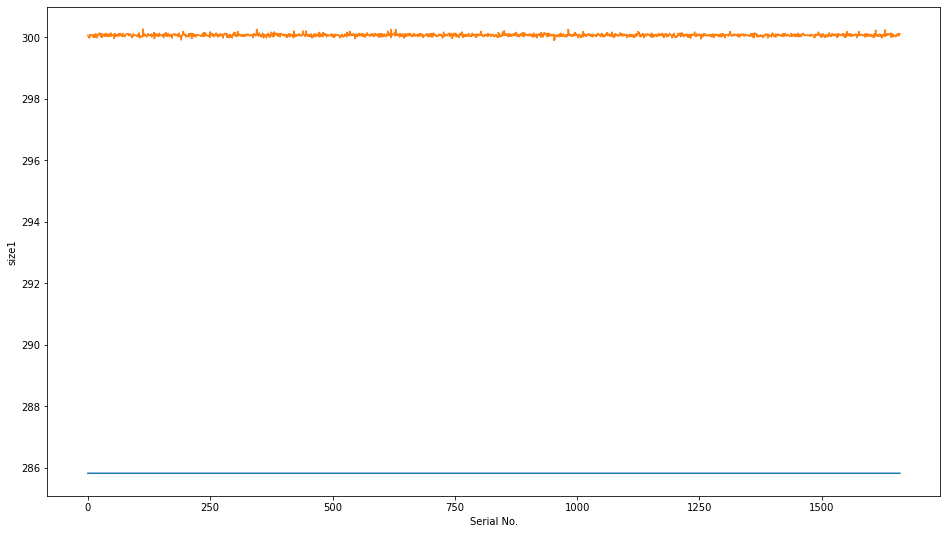

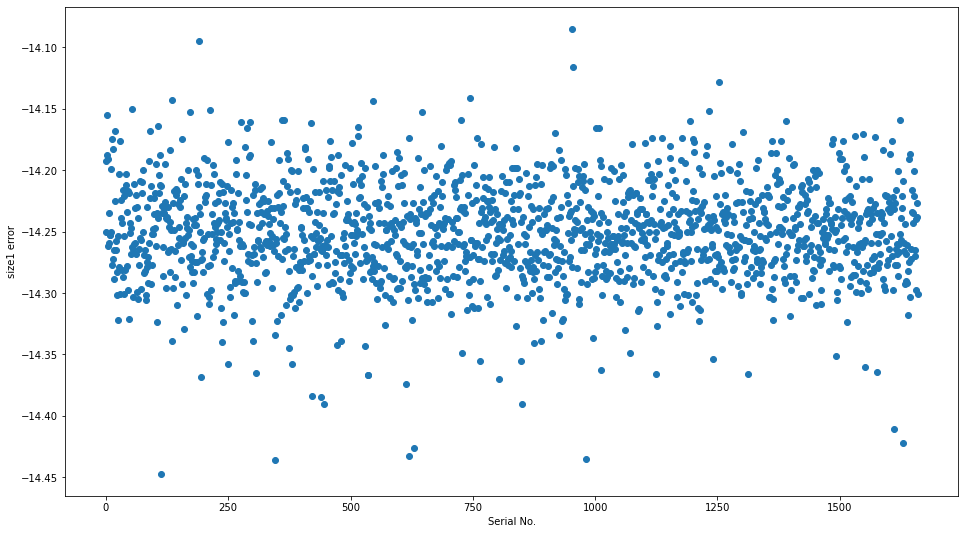

XGB1均方差得分为： 203.09418435189087
现在进行的训练轮次为: 1
train index : [    0     1     2 ... 14937 14938 14939]
test index : [   13    19    30 ... 14921 14922 14933]
xgb
          size1  size2  size3
0     571.63031    0.0    0.0
1     571.63031    0.0    0.0
2     571.63031    0.0    0.0
3     571.63031    0.0    0.0
4     571.63031    0.0    0.0
...         ...    ...    ...
1655  571.63031    0.0    0.0
1656  571.63031    0.0    0.0
1657  571.63031    0.0    0.0
1658  571.63031    0.0    0.0
1659  571.63031    0.0    0.0

[1660 rows x 3 columns]


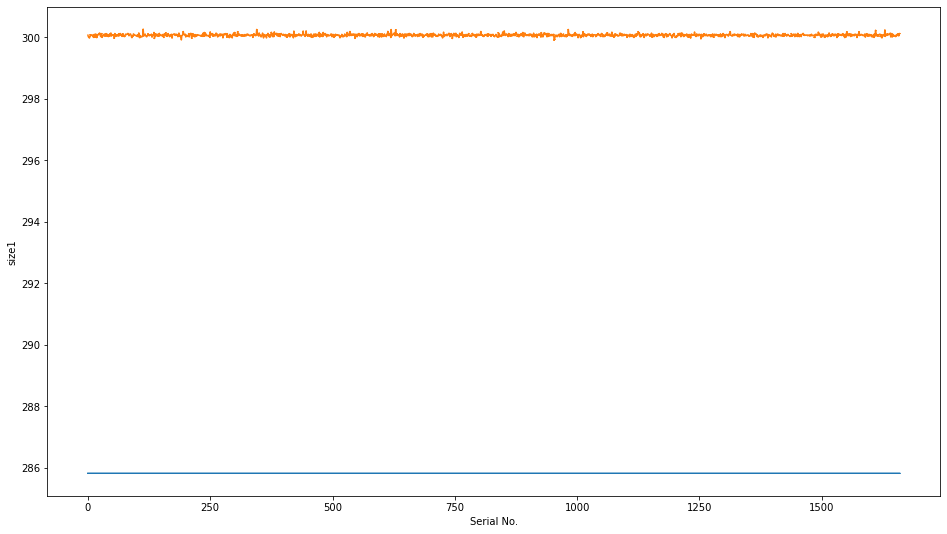

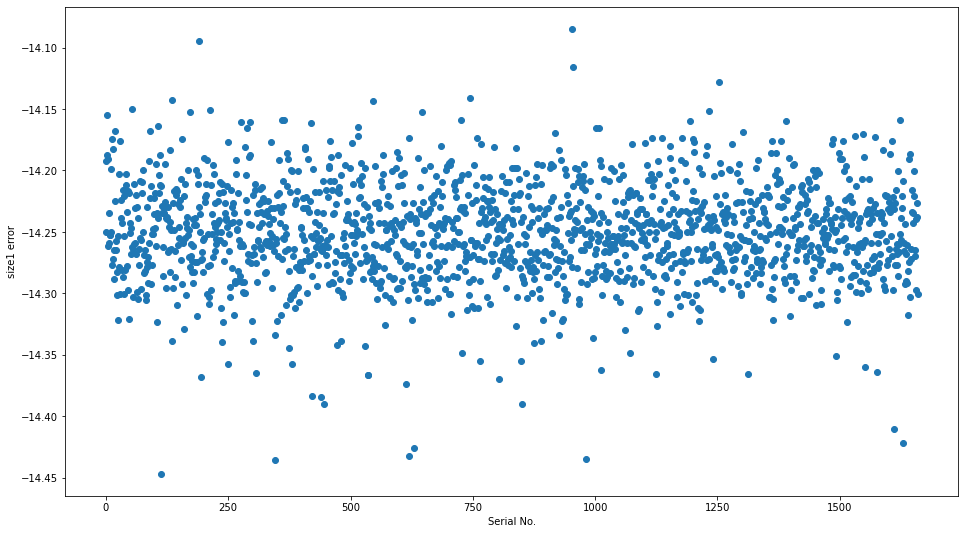

XGB1均方差得分为： 203.08722588825566
现在进行的训练轮次为: 2
train index : [    0     1     2 ... 14937 14938 14939]
test index : [    4    12    23 ... 14918 14925 14926]
xgb
           size1  size2  size3
0     857.445587    0.0    0.0
1     857.445587    0.0    0.0
2     857.445587    0.0    0.0
3     857.445587    0.0    0.0
4     857.445587    0.0    0.0
...          ...    ...    ...
1655  857.445587    0.0    0.0
1656  857.445587    0.0    0.0
1657  857.445587    0.0    0.0
1658  857.445587    0.0    0.0
1659  857.445587    0.0    0.0

[1660 rows x 3 columns]


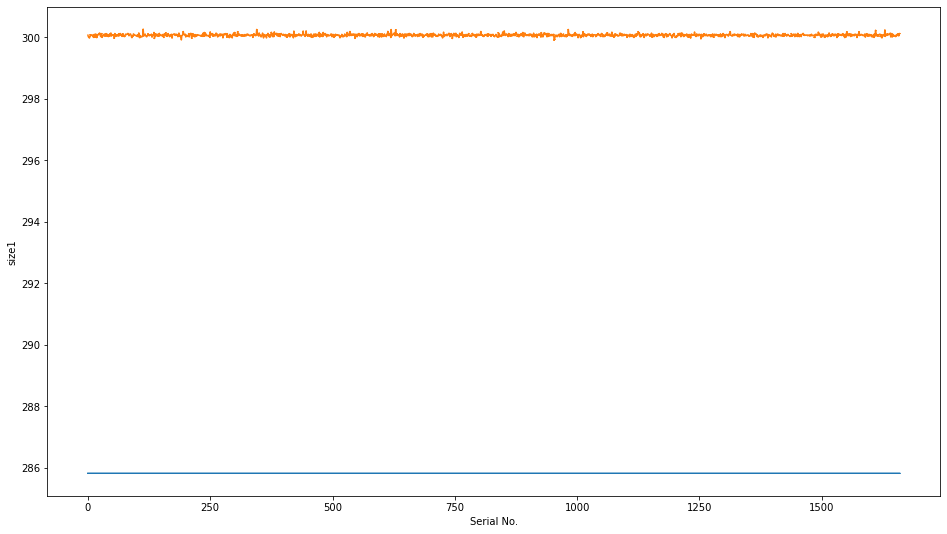

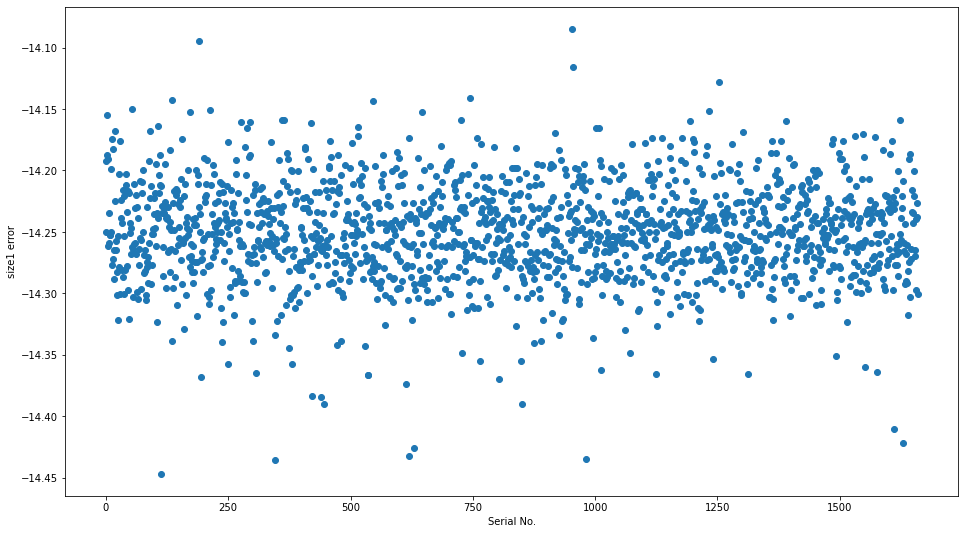

XGB1均方差得分为： 203.08722588825566
现在进行的训练轮次为: 3
train index : [    0     1     2 ... 14937 14938 14939]
test index : [    3     5     6 ... 14931 14932 14934]
xgb
            size1  size2  size3
0     1143.260712    0.0    0.0
1     1143.260712    0.0    0.0
2     1143.260712    0.0    0.0
3     1143.260712    0.0    0.0
4     1143.260712    0.0    0.0
...           ...    ...    ...
1655  1143.260712    0.0    0.0
1656  1143.260712    0.0    0.0
1657  1143.260712    0.0    0.0
1658  1143.260712    0.0    0.0
1659  1143.260712    0.0    0.0

[1660 rows x 3 columns]


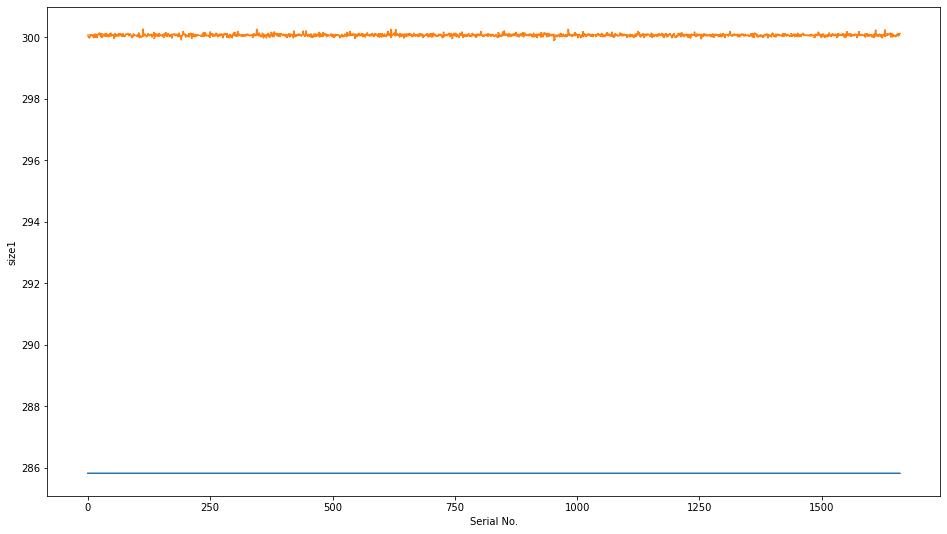

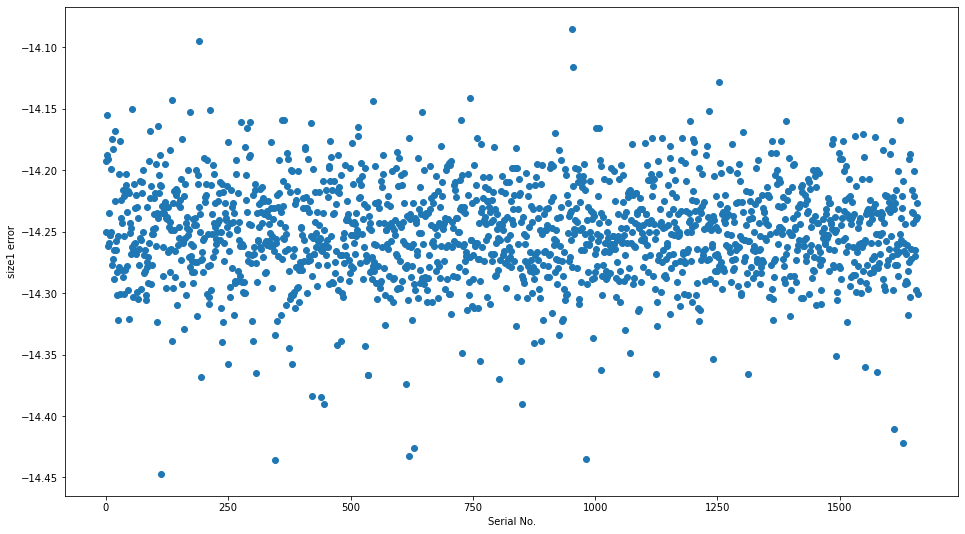

XGB1均方差得分为： 203.09157491405782
现在进行的训练轮次为: 4
train index : [    0     1     2 ... 14934 14935 14936]
test index : [    7     8     9 ... 14937 14938 14939]
xgb
            size1  size2  size3
0     1429.075745    0.0    0.0
1     1429.075745    0.0    0.0
2     1429.075745    0.0    0.0
3     1429.075745    0.0    0.0
4     1429.075745    0.0    0.0
...           ...    ...    ...
1655  1429.075745    0.0    0.0
1656  1429.075745    0.0    0.0
1657  1429.075745    0.0    0.0
1658  1429.075745    0.0    0.0
1659  1429.075745    0.0    0.0

[1660 rows x 3 columns]


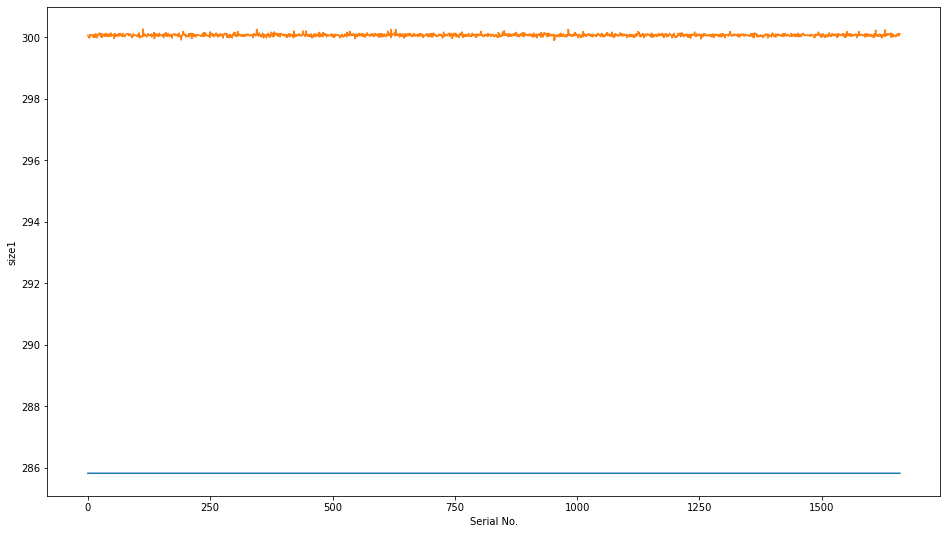

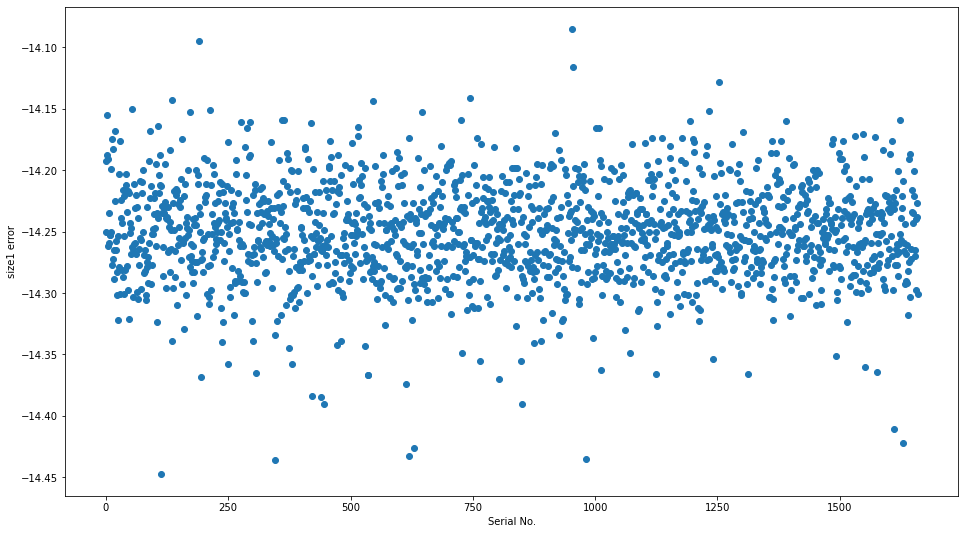

XGB1均方差得分为： 203.09418435189087
++++++++++++++++++++++++++++++++++++++++++++
           size1  size2  size3
0     285.815149    0.0    0.0
1     285.815149    0.0    0.0
2     285.815149    0.0    0.0
3     285.815149    0.0    0.0
4     285.815149    0.0    0.0
...          ...    ...    ...
1655  285.815149    0.0    0.0
1656  285.815149    0.0    0.0
1657  285.815149    0.0    0.0
1658  285.815149    0.0    0.0
1659  285.815149    0.0    0.0

[1660 rows x 3 columns]
            size1  size2  size3
0      285.815149    0.0    0.0
1      285.815149    0.0    0.0
2      285.815149    0.0    0.0
3      285.815149    0.0    0.0
4      285.815149    0.0    0.0
...           ...    ...    ...
16595  285.815149    0.0    0.0
16596  285.815149    0.0    0.0
16597  285.815149    0.0    0.0
16598  285.815149    0.0    0.0
16599  285.815149    0.0    0.0

[16600 rows x 3 columns]
           size1  size2  size3
0     285.815149    0.0    0.0
1     285.815149    0.0    0.0
2     285.815149    0.0 

In [21]:
from sklearn.model_selection import train_test_split

n_folds = 5
kf = KFold(n_splits = n_folds, shuffle = True)

n_test = np.zeros(((int(len(df_x_train)/10)), 3))
df_xgb_test_pred = pd.DataFrame(n_test, columns=['size1', 'size2', 'size3'])

n_train = np.zeros((len(df_y_train), 3))
df_xgb_train_pred = pd.DataFrame(n_train, columns=['size1', 'size2', 'size3'])

n_sub = np.zeros((len(df_x_sub), 3))
df_xgb_sub_pred = pd.DataFrame(n_sub, columns=['size1', 'size2', 'size3'])

for size in ['size1']:
    
    print('现在训练的尺寸是: ', size)
    
    x_pre_train, x_test, y_pre_train, y_test = train_test_split(
                                               df_xim_train, df_y_train[size], random_state=1,
                                               train_size = 0.9, test_size=0.1)

    count_xgb = 0
    print(x_pre_train.shape)
    print(x_test.shape)
    
    for train_index, test_index in kf.split(x_pre_train):
        print('现在进行的训练轮次为:', count_xgb)
        print('train index :', train_index)
        print('test index :', test_index)
        x_t, x_v = x_pre_train.values[train_index], x_pre_train.values[test_index]
        y_t, y_v = y_pre_train.values[train_index], y_pre_train.values[test_index]

        xgb1.fit(x_t, y_t)
        xgb1_pred = xgb1.predict(np.array(x_test))
        xgb1_score = mean_squared_error(y_test, xgb1_pred)

        # 将test train和sub的预测值每轮相加，最后求平均
        df_xgb_test_pred[size] += xgb1_pred
        print('xgb')
        print(df_xgb_test_pred)
        df_xgb_train_pred[size] += xgb1.predict(np.array(df_xim_train))
        df_xgb_sub_pred[size] += xgb1.predict(np.array(df_xim_sub))

        plt_error(xgb1_pred, y_test, size)
        print('XGB1均方差得分为：', xgb1_score)
        print('======================================================================')

        count_xgb += 1
        
    print('++++++++++++++++++++++++++++++++++++++++++++')
    df_xgb_test_pred[size] = df_xgb_test_pred[size] / n_folds
    print(df_xgb_test_pred)
    df_xgb_train_pred[size] = df_xgb_train_pred[size] / n_folds
    print(df_xgb_train_pred)
    df_xgb_sub_pred[size] = df_xgb_sub_pred[size] / n_folds
    print(df_xgb_sub_pred)
    
 


In [18]:
xgb_train_score = my_loss(np.array(df_xgb_train_pred), np.array(df_y_train))
xgb_train_score

array([5.49276364e+17, 1.88974851e+04, 1.26623372e+04])

In [19]:
x_2score_train, x_2score_test, y_2score_train, y_2score_test = train_test_split(
                                           df_x_train, df_y_train, random_state=1,
                                           train_size = 0.9, test_size=0.1)

xgb_test_score = my_loss(np.array(df_xgb_test_pred), np.array(y_2score_test))
xgb_test_score

array([ 2763.33637015, 96558.29219766, 49698.26111167])

现在训练的尺寸是:  size1
(14940, 57)
现在进行的训练轮次为: 0
train index : [    0     2     3 ... 14936 14938 14939]
test index : [    1    21    22 ... 14934 14935 14937]
lgb
           size1  size2  size3
0     300.086163    0.0    0.0
1     300.011212    0.0    0.0
2     300.008601    0.0    0.0
3     299.927366    0.0    0.0
4     299.993385    0.0    0.0
...          ...    ...    ...
1655  300.070365    0.0    0.0
1656  300.088933    0.0    0.0
1657  300.083479    0.0    0.0
1658  300.062213    0.0    0.0
1659  300.113221    0.0    0.0

[1660 rows x 3 columns]


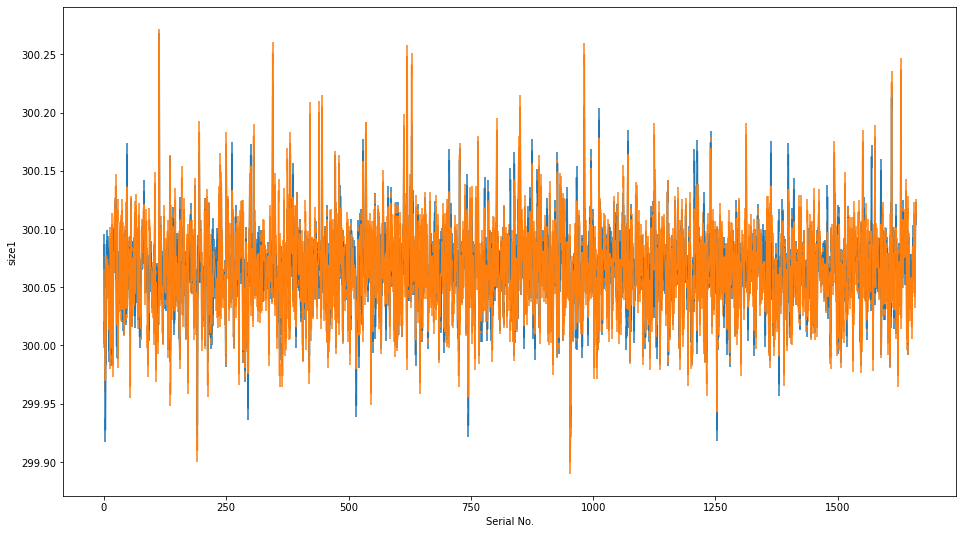

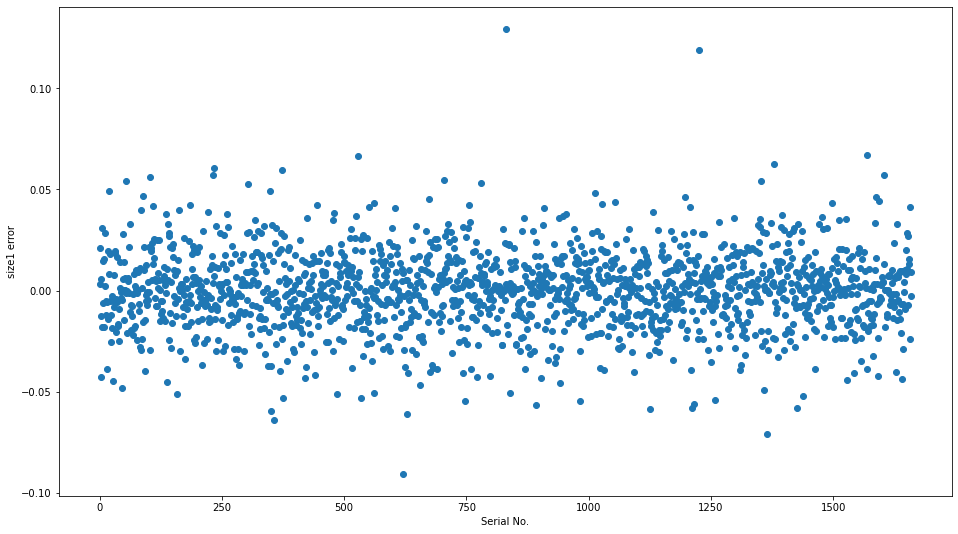

LGB1均方差得分为： 0.0003753978323736488
现在进行的训练轮次为: 1
train index : [    0     1     2 ... 14936 14937 14938]
test index : [    8    14    16 ... 14923 14928 14939]
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
lgb
           size1  size2  size3
0     600.166376    0.0    0.0
1     600.024009    0.0    0.0
2     600.017209    0.0    0.0
3     599.857380    0.0    0.0
4     599.987607    0.0    0.0
...          ...    ...    ...
1655  600.141993    0.0    0.0
1656  600.181230    0.0    0.0
1657  600.169613    0.0    0.0
1658  600.125962    0.0    0.0
1659  600.227294    0.0    0.0

[1660 rows x 3 columns]


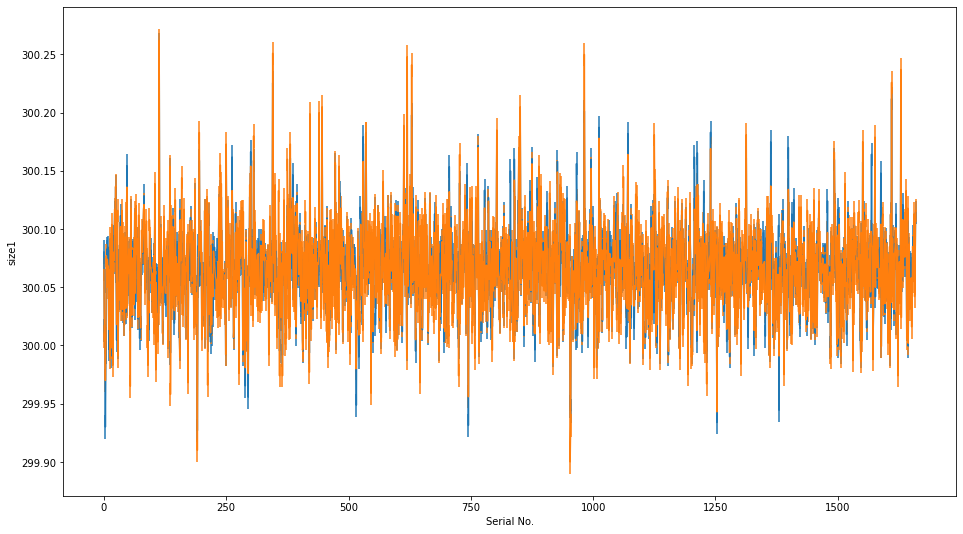

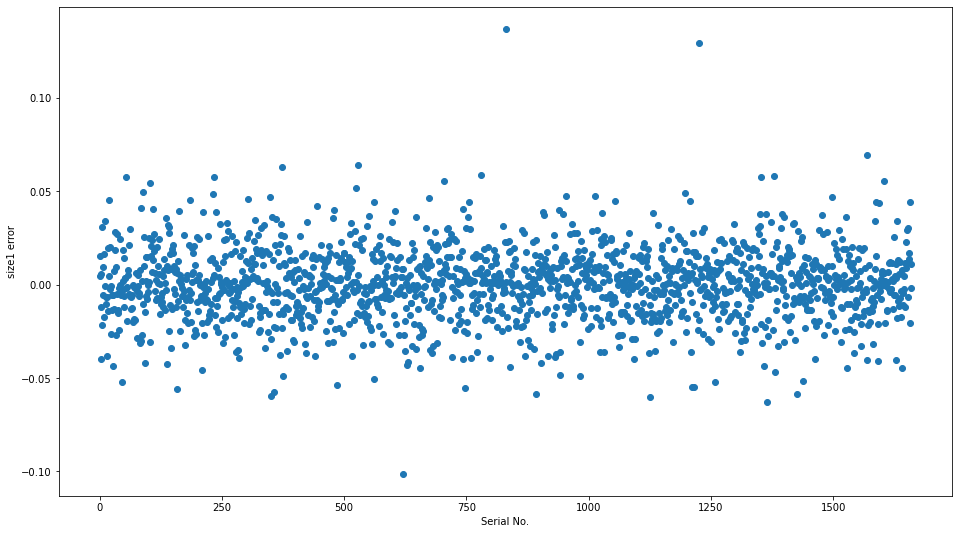

LGB1均方差得分为： 0.00037751296214106434
现在进行的训练轮次为: 2
train index : [    1     2     3 ... 14937 14938 14939]
test index : [    0     6    13 ... 14929 14931 14936]
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
lgb
           size1  size2  size3
0     900.245154    0.0    0.0
1     900.037661    0.0    0.0
2     900.025524    0.0    0.0
3     899.781775    0.0    0.0
4     899.983098    0.0    0.0
...          ...    ...    ...
1655  900.213929    0.0    0.0
1656  900.263808    0.0    0.0
1657  900.253398    0.0    0.0
1658  900.190181    0.0    0.0
1659  900.340084    0.0    0.0

[1660 rows x 3 columns]


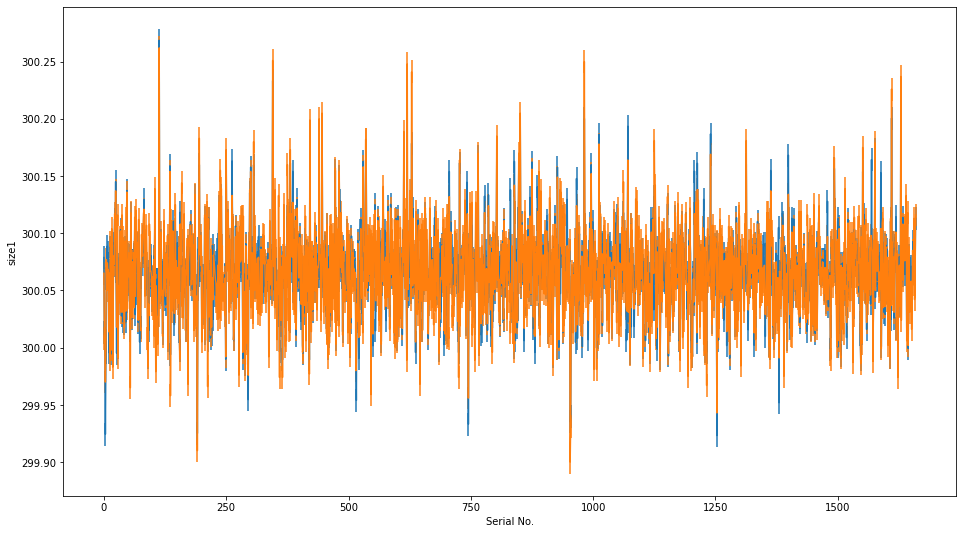

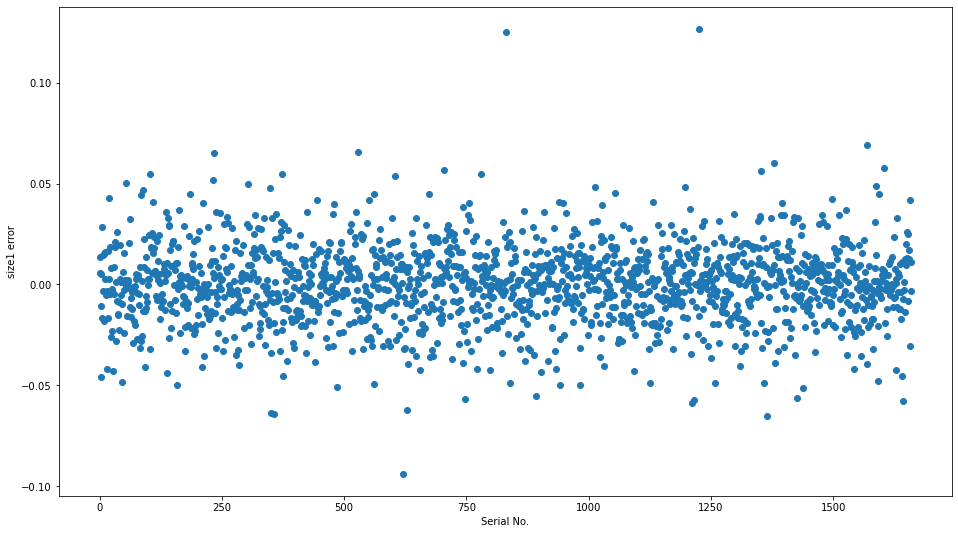

LGB1均方差得分为： 0.0003740892024297964
现在进行的训练轮次为: 3
train index : [    0     1     3 ... 14936 14937 14939]
test index : [    2     4     9 ... 14927 14933 14938]
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
lgb
            size1  size2  size3
0     1200.326646    0.0    0.0
1     1200.052638    0.0    0.0
2     1200.032452    0.0    0.0
3     1199.705848    0.0    0.0
4     1199.979118    0.0    0.0
...           ...    ...    ...
1655  1200.281781    0.0    0.0
1656  1200.353182    0.0    0.0
1657  1200.337692    0.0    0.0
1658  1200.255007    0.0    0.0
1659  1200.450881    0.0    0.0

[1660 rows x 3 columns]


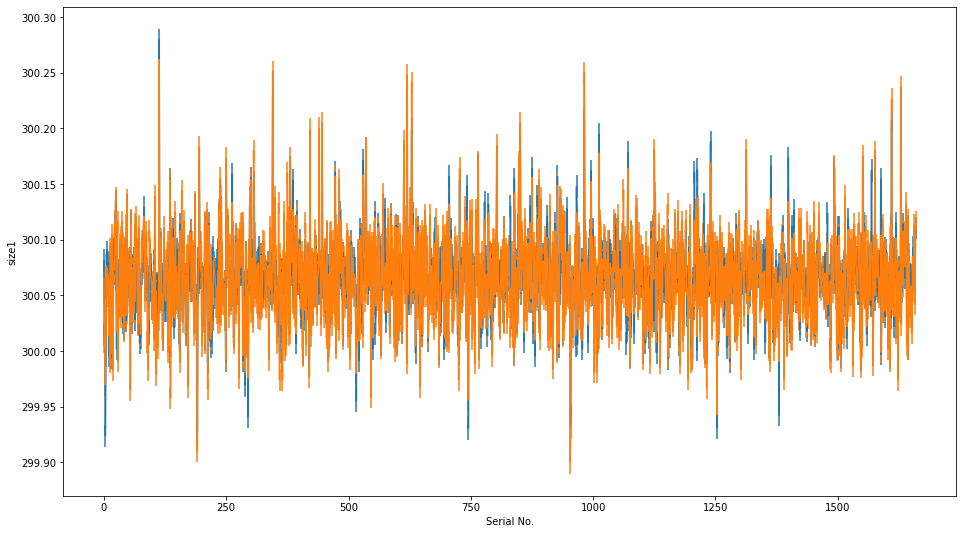

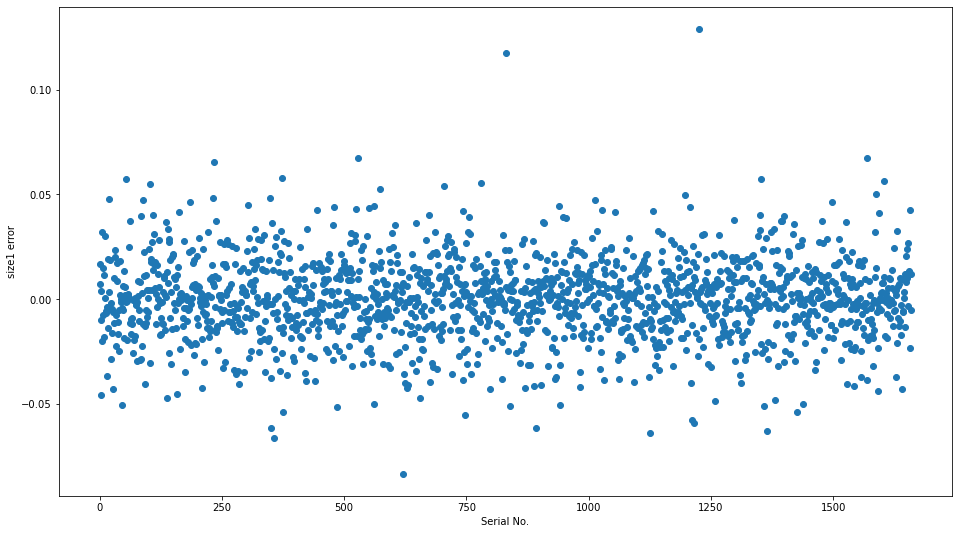

LGB1均方差得分为： 0.0003749501935508249
现在进行的训练轮次为: 4
train index : [    0     1     2 ... 14937 14938 14939]
test index : [    3     5     7 ... 14924 14926 14930]
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
lgb
            size1  size2  size3
0     1500.411604    0.0    0.0
1     1500.062396    0.0    0.0
2     1500.038745    0.0    0.0
3     1499.634350    0.0    0.0
4     1499.973534    0.0    0.0
...           ...    ...    ...
1655  1500.351040    0.0    0.0
1656  1500.444237    0.0    0.0
1657  1500.422822    0.0    0.0
1658  1500.317807    0.0    0.0
1659  1500.562543    0.0    0.0

[1660 rows x 3 columns]


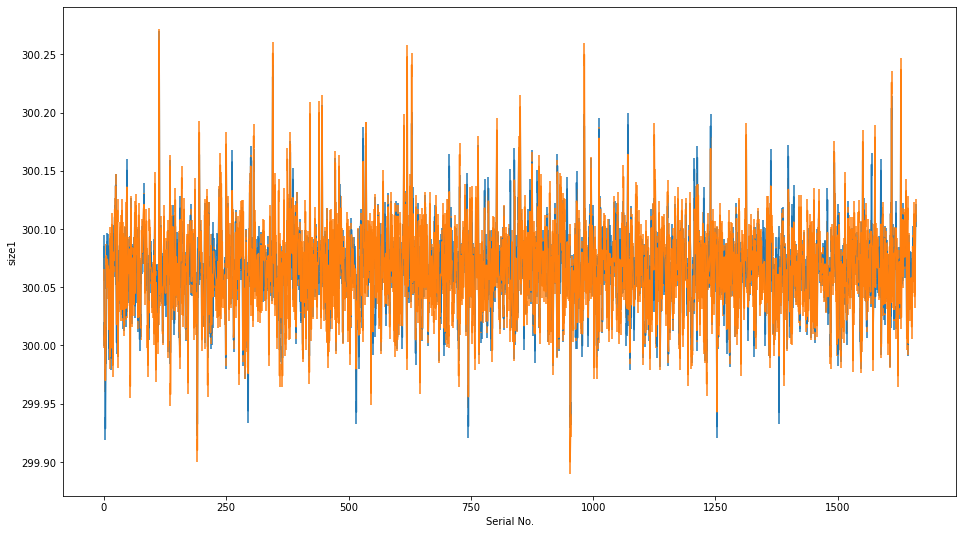

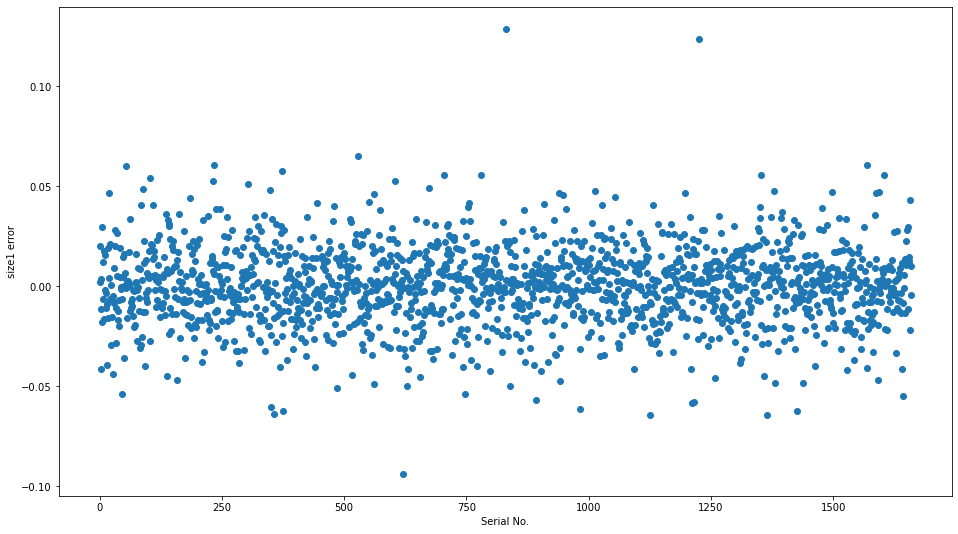

LGB1均方差得分为： 0.0003811772937253787
++++++++++++++++++++++++++++++++++++++++++++
           size1  size2  size3
0     300.082321    0.0    0.0
1     300.012479    0.0    0.0
2     300.007749    0.0    0.0
3     299.926870    0.0    0.0
4     299.994707    0.0    0.0
...          ...    ...    ...
1655  300.070208    0.0    0.0
1656  300.088847    0.0    0.0
1657  300.084564    0.0    0.0
1658  300.063561    0.0    0.0
1659  300.112509    0.0    0.0

[1660 rows x 3 columns]
            size1  size2  size3
0      300.029261    0.0    0.0
1      300.003037    0.0    0.0
2      299.986758    0.0    0.0
3      299.988034    0.0    0.0
4      299.988052    0.0    0.0
...           ...    ...    ...
16595  300.119480    0.0    0.0
16596  300.121750    0.0    0.0
16597  300.117180    0.0    0.0
16598  300.121118    0.0    0.0
16599  300.122247    0.0    0.0

[16600 rows x 3 columns]
           size1  size2  size3
0     300.129828    0.0    0.0
1     300.088029    0.0    0.0
2     300.072381    0

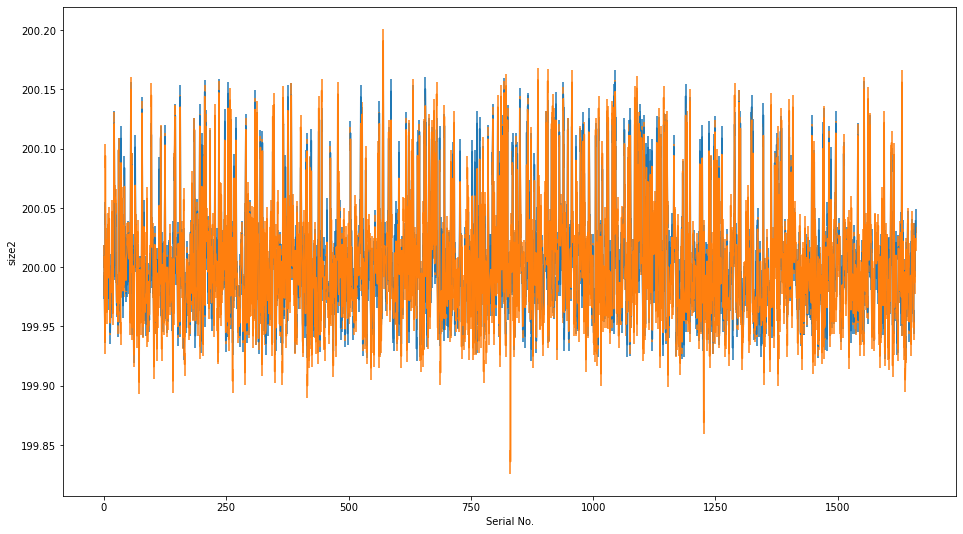

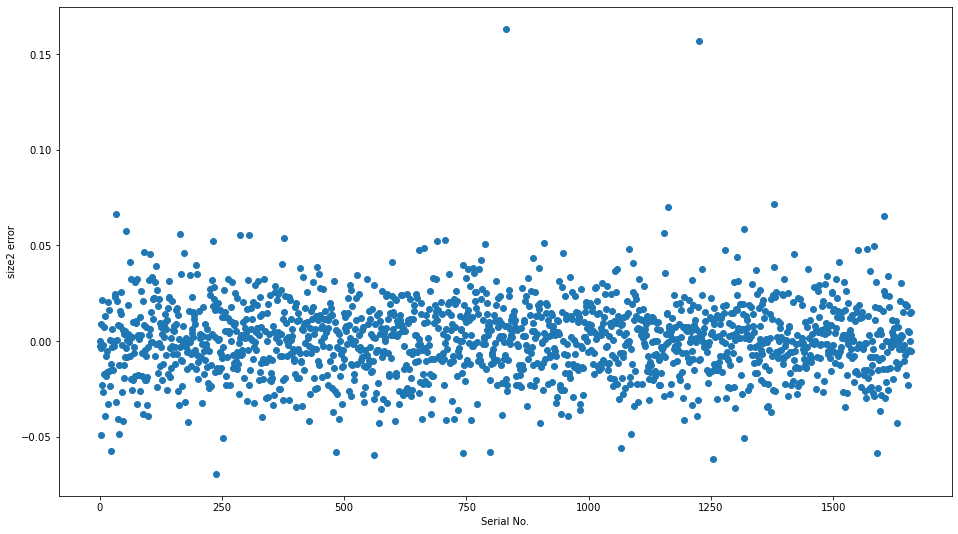

LGB1均方差得分为： 0.0003822282316327879
现在进行的训练轮次为: 1
train index : [    0     1     2 ... 14937 14938 14939]
test index : [    6    10    11 ... 14915 14917 14921]
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
lgb
           size1       size2  size3
0     300.082321  400.018300    0.0
1     300.012479  399.965523    0.0
2     300.007749  399.894118    0.0
3     299.926870  400.092186    0.0
4     299.994707  399.951116    0.0
...          ...         ...    ...
1655  300.070208  399.907056    0.0
1656  300.088847  400.047831    0.0
1657  300.084564  400.000913    0.0
1658  300.063561  400.007724    0.0
1659  300.112509  400.074279    0.0

[1660 rows x 3 columns]


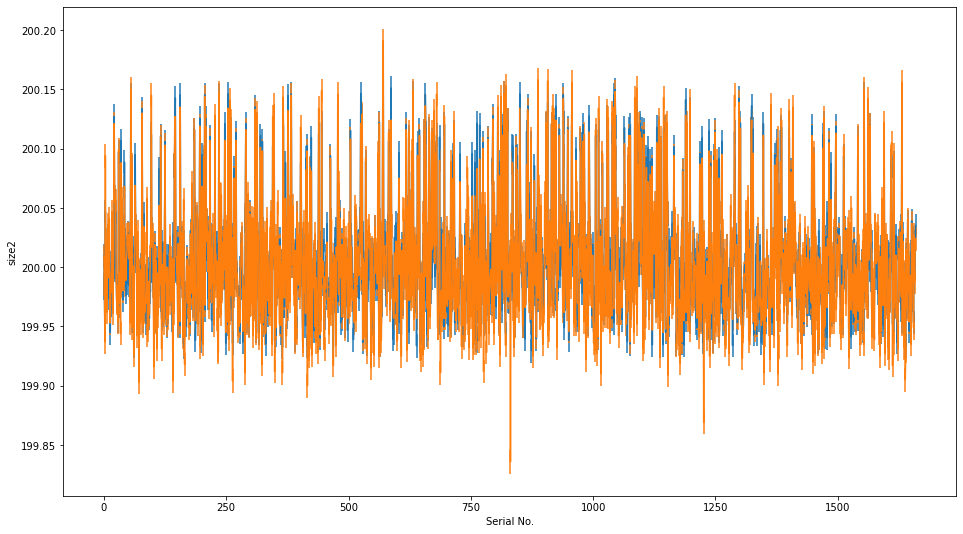

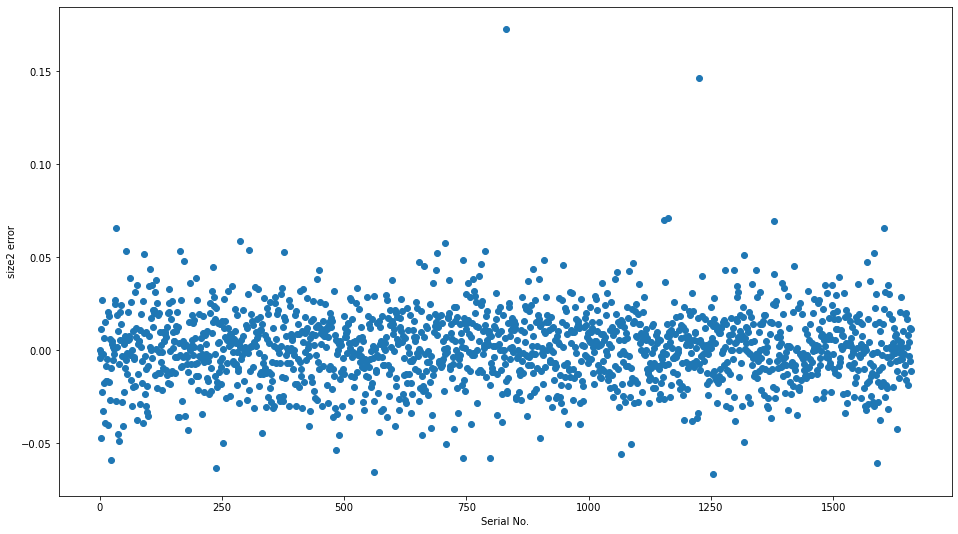

LGB1均方差得分为： 0.00038886536228078866
现在进行的训练轮次为: 2
train index : [    1     2     3 ... 14936 14938 14939]
test index : [    0    13    15 ... 14929 14935 14937]
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
lgb
           size1       size2  size3
0     300.082321  600.029613    0.0
1     300.012479  599.946996    0.0
2     300.007749  599.835987    0.0
3     299.926870  600.138798    0.0
4     299.994707  599.926313    0.0
...          ...         ...    ...
1655  300.070208  599.861276    0.0
1656  300.088847  600.071129    0.0
1657  300.084564  600.005952    0.0
1658  300.063561  600.011051    0.0
1659  300.112509  600.105617    0.0

[1660 rows x 3 columns]


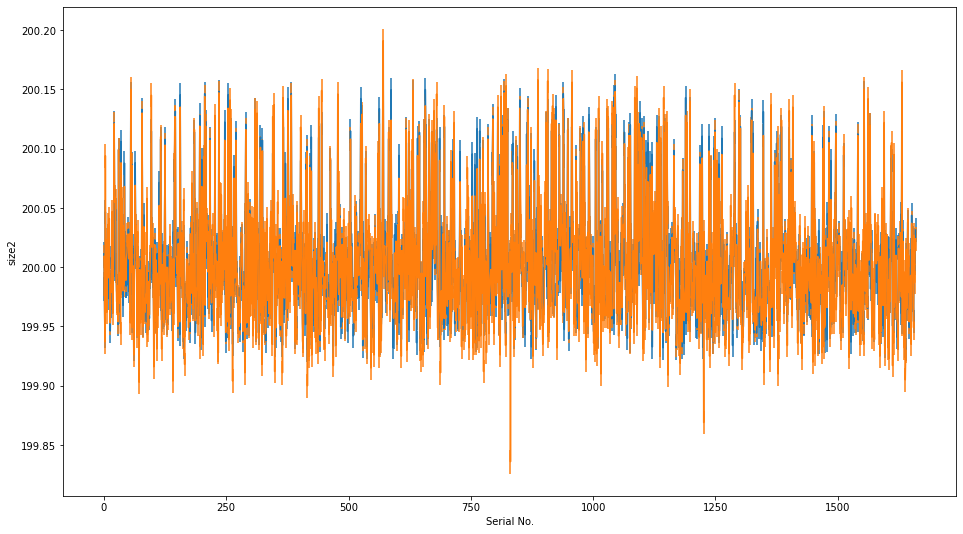

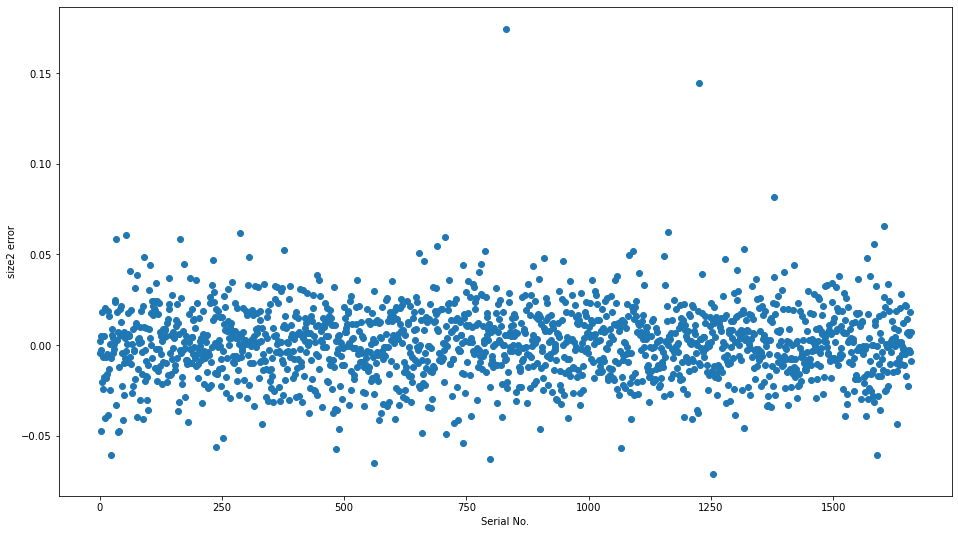

LGB1均方差得分为： 0.00038578072371050527
现在进行的训练轮次为: 3
train index : [    0     1     2 ... 14935 14936 14937]
test index : [    4    17    20 ... 14923 14938 14939]
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
lgb
           size1       size2  size3
0     300.082321  800.040086    0.0
1     300.012479  799.929008    0.0
2     300.007749  799.782054    0.0
3     299.926870  800.179388    0.0
4     299.994707  799.900845    0.0
...          ...         ...    ...
1655  300.070208  799.816029    0.0
1656  300.088847  800.096809    0.0
1657  300.084564  800.009822    0.0
1658  300.063561  800.017236    0.0
1659  300.112509  800.141488    0.0

[1660 rows x 3 columns]


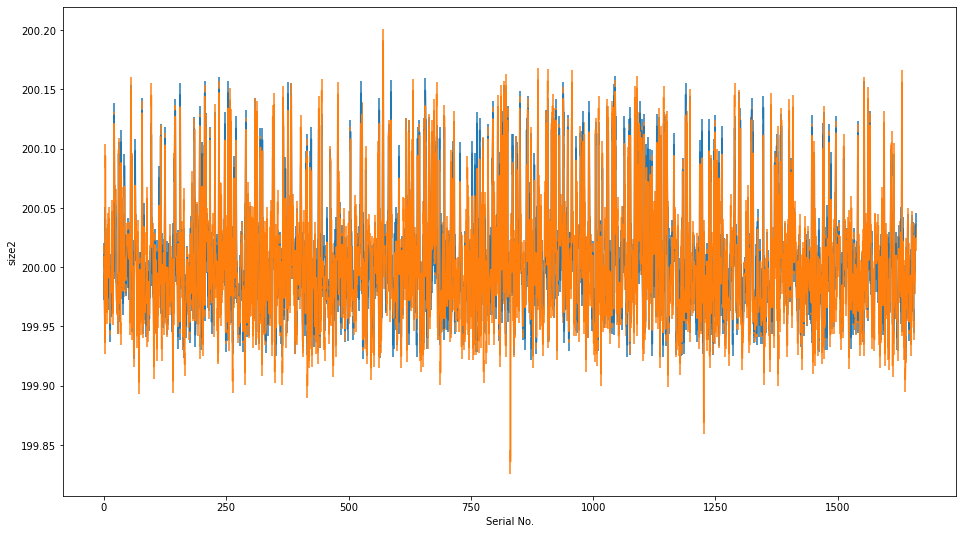

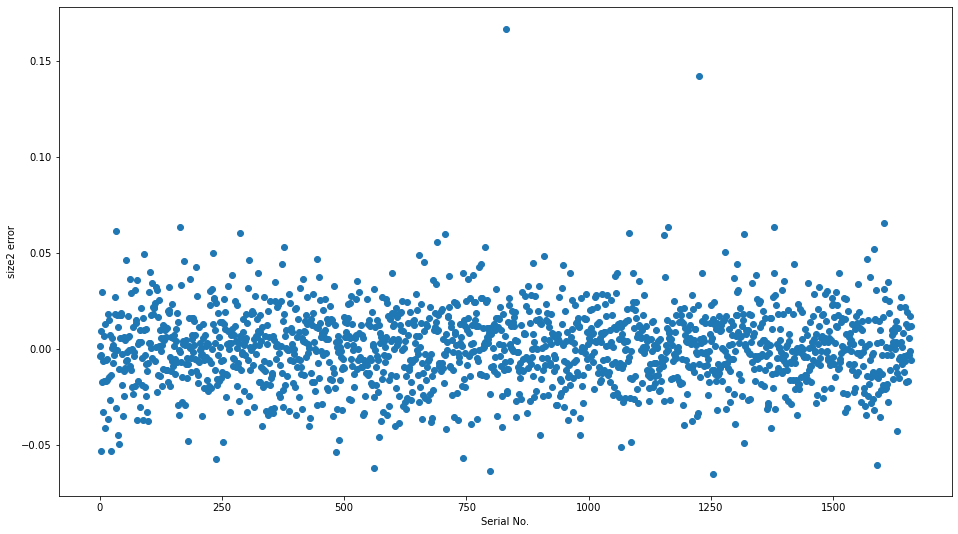

LGB1均方差得分为： 0.0003832083953571923
现在进行的训练轮次为: 4
train index : [    0     2     4 ... 14937 14938 14939]
test index : [    1     3     7 ... 14932 14933 14934]
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
lgb
           size1        size2  size3
0     300.082321  1000.045653    0.0
1     300.012479   999.912629    0.0
2     300.007749   999.726392    0.0
3     299.926870  1000.221057    0.0
4     299.994707   999.875841    0.0
...          ...          ...    ...
1655  300.070208   999.769420    0.0
1656  300.088847  1000.120605    0.0
1657  300.084564  1000.010494    0.0
1658  300.063561  1000.018759    0.0
1659  300.112509  1000.176393    0.0

[1660 rows x 3 columns]


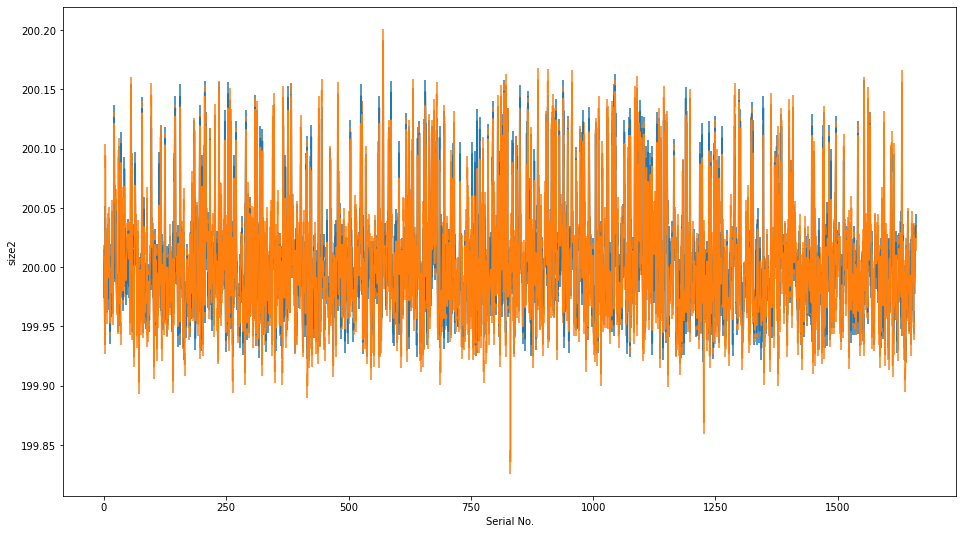

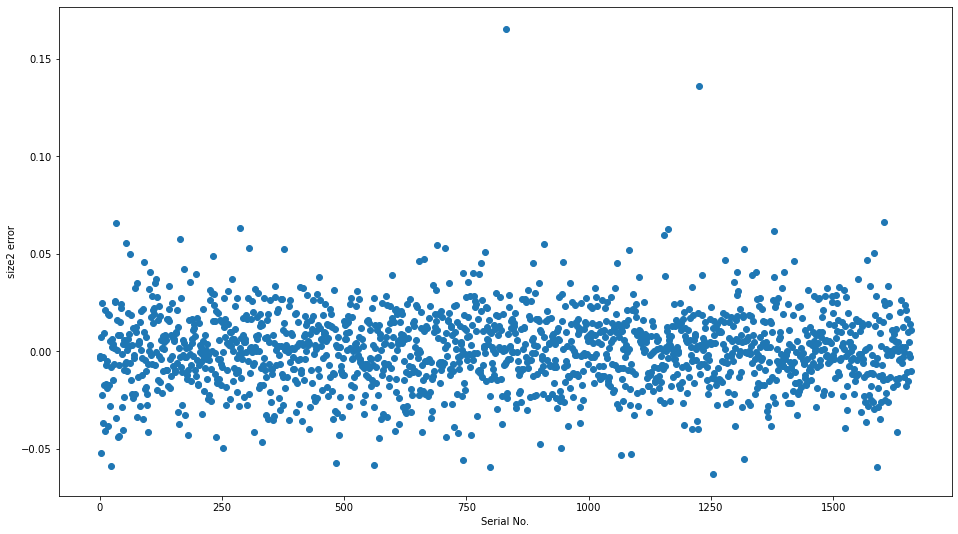

LGB1均方差得分为： 0.00037855381315283365
++++++++++++++++++++++++++++++++++++++++++++
           size1       size2  size3
0     300.082321  200.009131    0.0
1     300.012479  199.982526    0.0
2     300.007749  199.945278    0.0
3     299.926870  200.044211    0.0
4     299.994707  199.975168    0.0
...          ...         ...    ...
1655  300.070208  199.953884    0.0
1656  300.088847  200.024121    0.0
1657  300.084564  200.002099    0.0
1658  300.063561  200.003752    0.0
1659  300.112509  200.035279    0.0

[1660 rows x 3 columns]
            size1       size2  size3
0      300.029261  199.954634    0.0
1      300.003037  199.948548    0.0
2      299.986758  199.931745    0.0
3      299.988034  199.932058    0.0
4      299.988052  199.939440    0.0
...           ...         ...    ...
16595  300.119480  200.147210    0.0
16596  300.121750  200.148925    0.0
16597  300.117180  200.148013    0.0
16598  300.121118  200.148311    0.0
16599  300.122247  200.148213    0.0

[16600 rows x 3 co

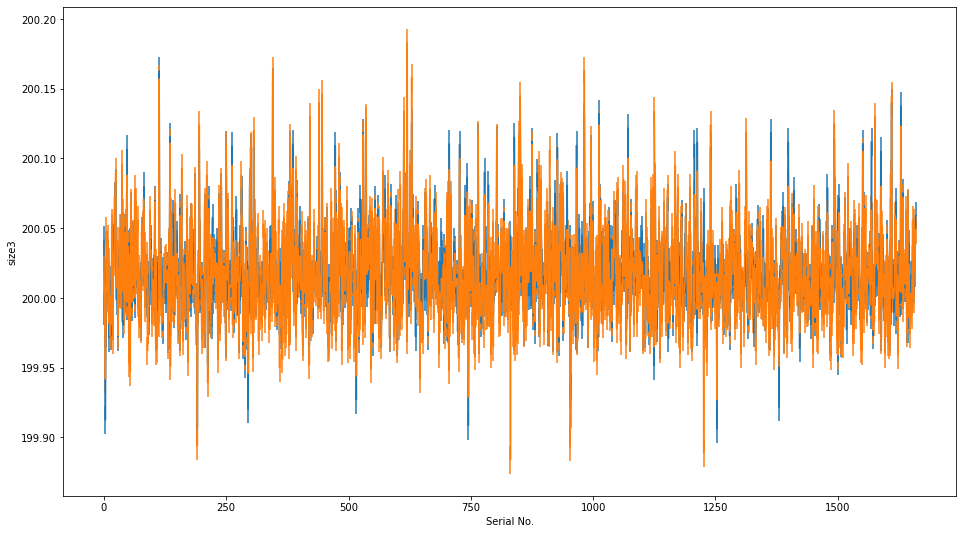

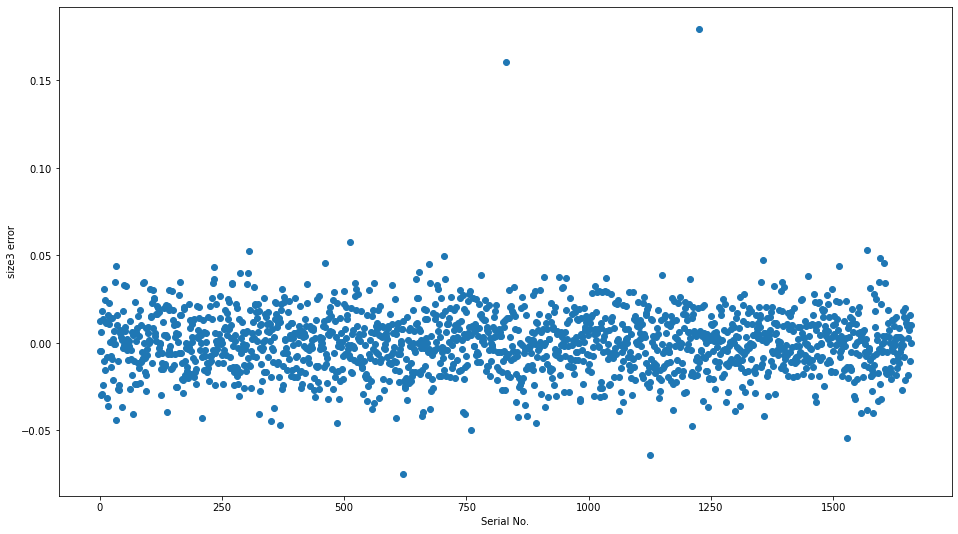

LGB1均方差得分为： 0.00032020660742704493
现在进行的训练轮次为: 1
train index : [    0     3     4 ... 14937 14938 14939]
test index : [    1     2    15 ... 14930 14931 14936]
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
lgb
           size1       size2       size3
0     300.082321  200.009131  400.085421
1     300.012479  199.982526  399.983554
2     300.007749  199.945278  399.961417
3     299.926870  200.044211  399.820307
4     299.994707  199.975168  399.948849
...          ...         ...         ...
1655  300.070208  199.953884  400.017404
1656  300.088847  200.024121  400.086998
1657  300.084564  200.002099  400.072603
1658  300.063561  200.003752  400.038172
1659  300.112509  200.035279  400.115434

[1660 rows x 3 columns]


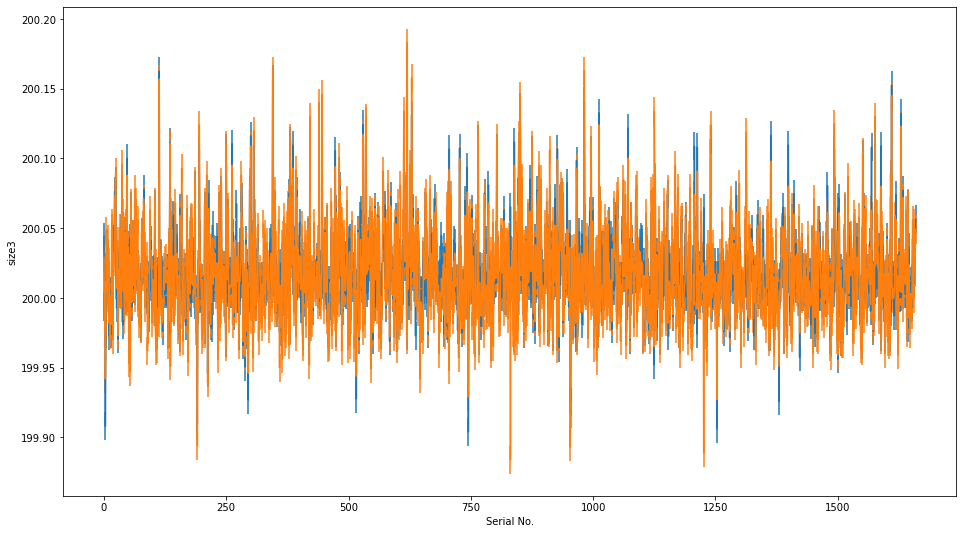

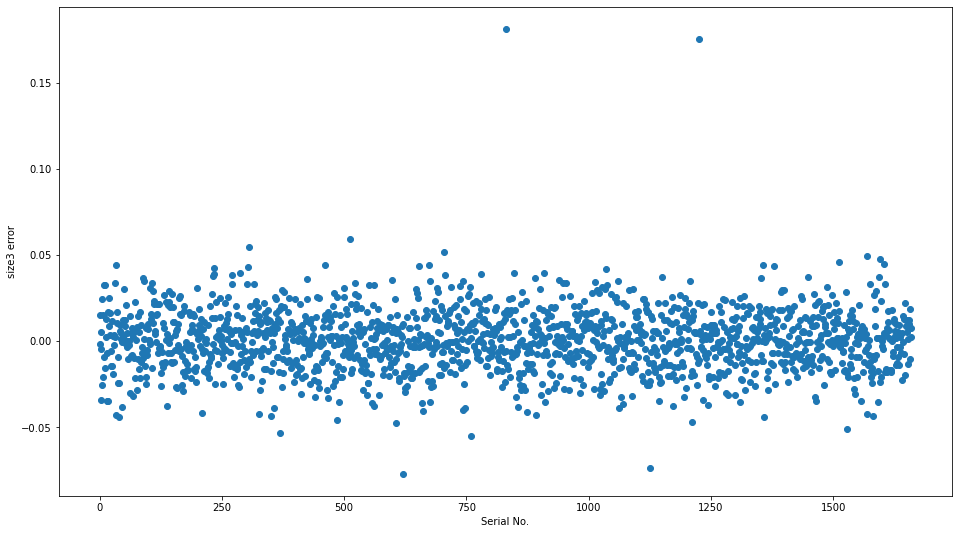

LGB1均方差得分为： 0.00032583107991264367
现在进行的训练轮次为: 2
train index : [    0     1     2 ... 14937 14938 14939]
test index : [    6     9    11 ... 14911 14914 14923]
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
lgb
           size1       size2       size3
0     300.082321  200.009131  600.125794
1     300.012479  199.982526  599.974580
2     300.007749  199.945278  599.938256
3     299.926870  200.044211  599.724640
4     299.994707  199.975168  599.922225
...          ...         ...         ...
1655  300.070208  199.953884  600.025678
1656  300.088847  200.024121  600.127765
1657  300.084564  200.002099  600.111962
1658  300.063561  200.003752  600.056972
1659  300.112509  200.035279  600.174011

[1660 rows x 3 columns]


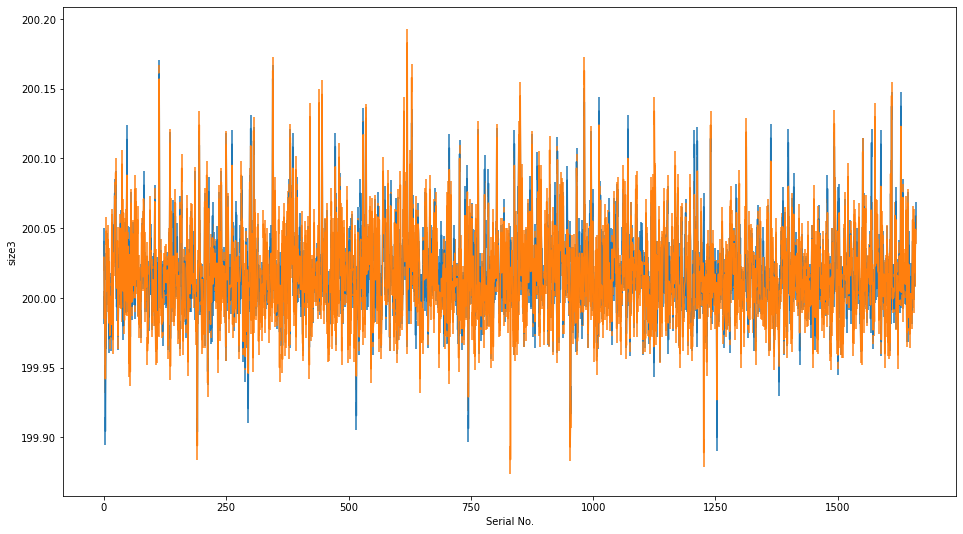

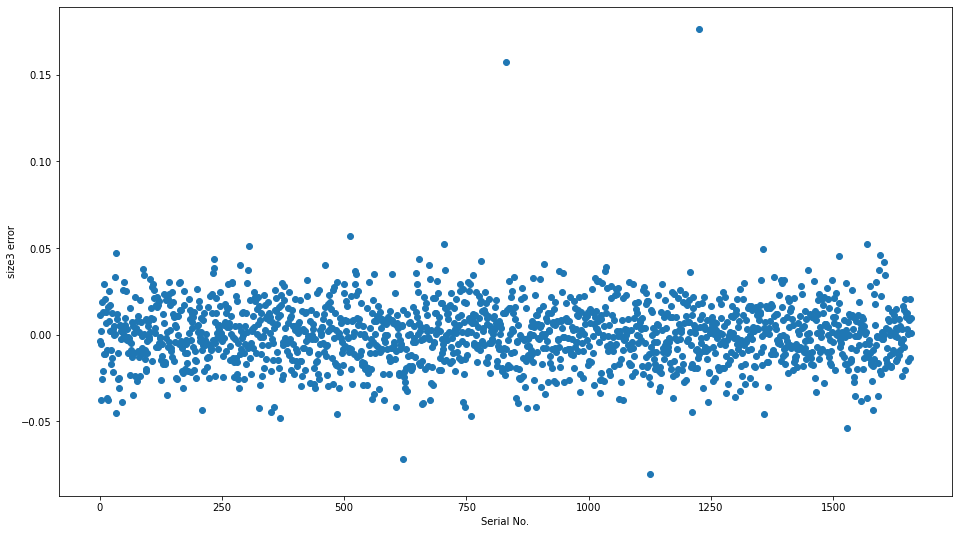

LGB1均方差得分为： 0.00031739063143823115
现在进行的训练轮次为: 3
train index : [    0     1     2 ... 14937 14938 14939]
test index : [    3     4     8 ... 14920 14922 14927]
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
lgb
           size1       size2       size3
0     300.082321  200.009131  800.162929
1     300.012479  199.982526  799.965509
2     300.007749  199.945278  799.915715
3     299.926870  200.044211  799.625472
4     299.994707  199.975168  799.896642
...          ...         ...         ...
1655  300.070208  199.953884  800.035431
1656  300.088847  200.024121  800.172624
1657  300.084564  200.002099  800.145436
1658  300.063561  200.003752  800.077746
1659  300.112509  200.035279  800.229779

[1660 rows x 3 columns]


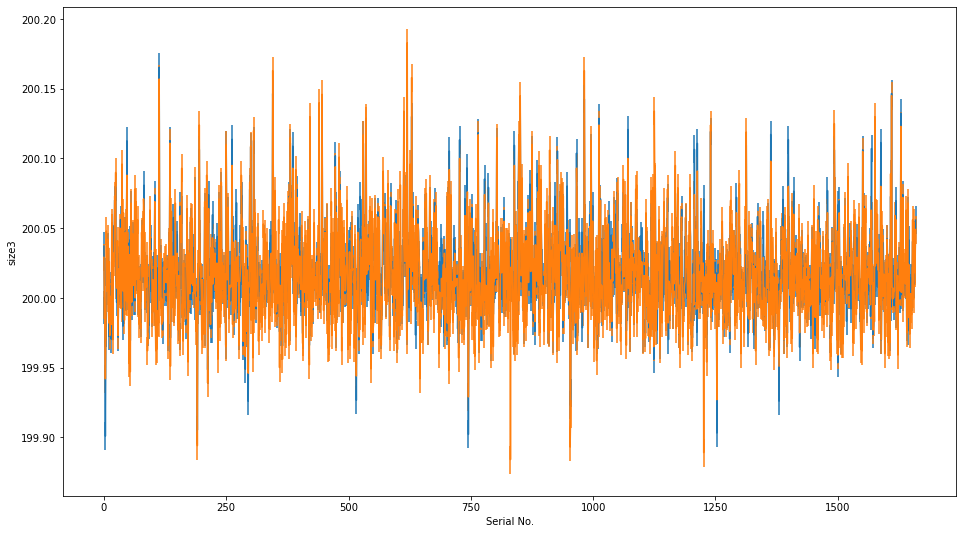

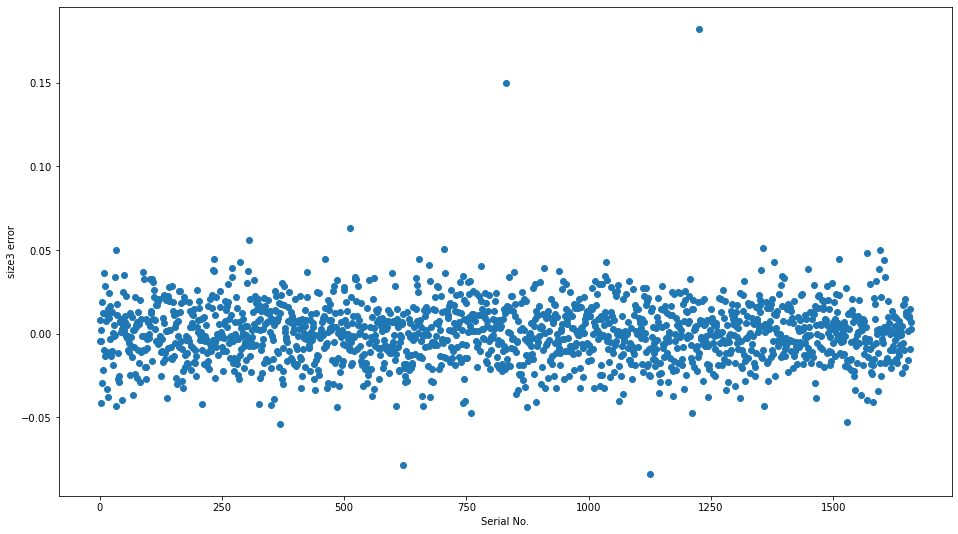

LGB1均方差得分为： 0.00032373821041447524
现在进行的训练轮次为: 4
train index : [    1     2     3 ... 14934 14935 14936]
test index : [    0     5     7 ... 14937 14938 14939]
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
lgb
           size1       size2        size3
0     300.082321  200.009131  1000.207889
1     300.012479  199.982526   999.958110
2     300.007749  199.945278   999.896916
3     299.926870  200.044211   999.526422
4     299.994707  199.975168   999.870617
...          ...         ...          ...
1655  300.070208  199.953884  1000.044651
1656  300.088847  200.024121  1000.217416
1657  300.084564  200.002099  1000.181251
1658  300.063561  200.003752  1000.096992
1659  300.112509  200.035279  1000.286613

[1660 rows x 3 columns]


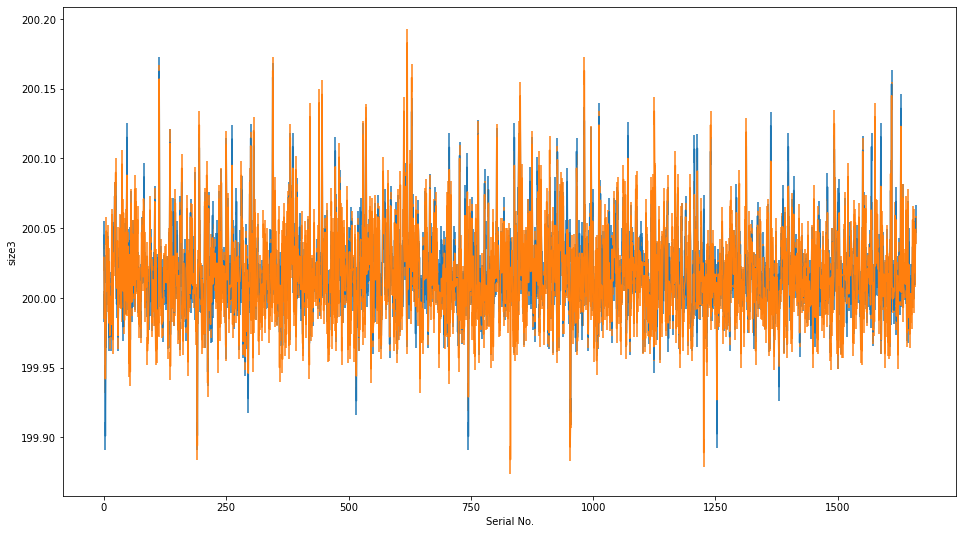

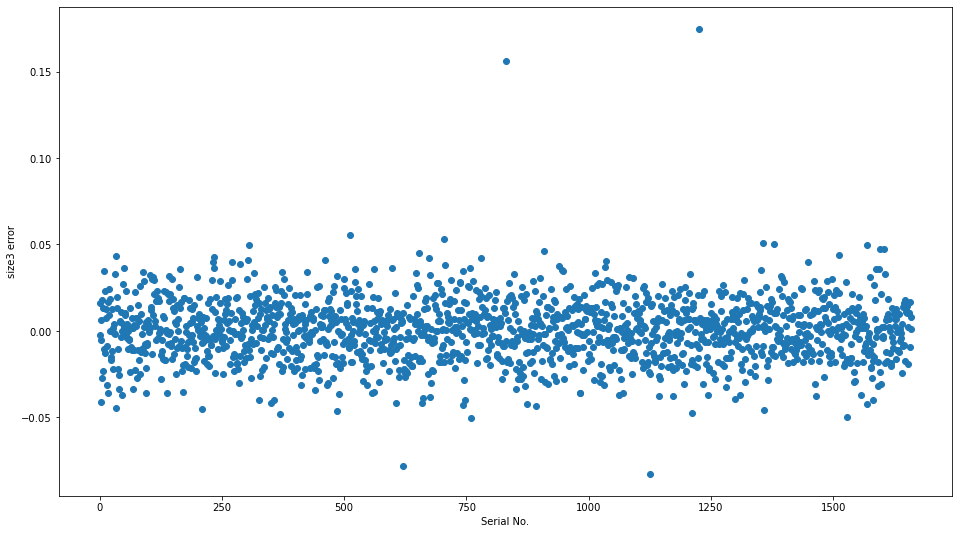

LGB1均方差得分为： 0.00032138634251329437
++++++++++++++++++++++++++++++++++++++++++++
           size1       size2       size3
0     300.082321  200.009131  200.041578
1     300.012479  199.982526  199.991622
2     300.007749  199.945278  199.979383
3     299.926870  200.044211  199.905284
4     299.994707  199.975168  199.974123
...          ...         ...         ...
1655  300.070208  199.953884  200.008930
1656  300.088847  200.024121  200.043483
1657  300.084564  200.002099  200.036250
1658  300.063561  200.003752  200.019398
1659  300.112509  200.035279  200.057323

[1660 rows x 3 columns]
            size1       size2       size3
0      300.029261  199.954634  199.979246
1      300.003037  199.948548  199.972820
2      299.986758  199.931745  199.964954
3      299.988034  199.932058  199.965454
4      299.988052  199.939440  199.964541
...           ...         ...         ...
16595  300.119480  200.147210  200.060847
16596  300.121750  200.148925  200.066327
16597  300.117180  200.14

In [22]:
from sklearn.model_selection import train_test_split

n_folds = 5
kf = KFold(n_splits = n_folds, shuffle = True)

n_test = np.zeros(((int(len(df_x_train)/10)), 3))
df_lgb_test_pred = pd.DataFrame(n_test, columns=['size1', 'size2', 'size3'])

n_train = np.zeros((len(df_y_train), 3))
df_lgb_train_pred = pd.DataFrame(n_train, columns=['size1', 'size2', 'size3'])

n_sub = np.zeros((len(df_x_sub), 3))
df_lgb_sub_pred = pd.DataFrame(n_sub, columns=['size1', 'size2', 'size3'])


for size in ['size1', 'size2', 'size3']:
    
    print('现在训练的尺寸是: ', size)
    
    x_pre_train, x_test, y_pre_train, y_test = train_test_split(
                                               df_xim_train, df_y_train[size], random_state=1,
                                               train_size = 0.9, test_size=0.1)
    count_lgb = 0
    print(x_pre_train.shape)
    
    for train_index, test_index in kf.split(x_pre_train):
        print('现在进行的训练轮次为:', count_lgb)
        print('train index :', train_index)
        print('test index :', test_index)
        x_t, x_v = x_pre_train.values[train_index], x_pre_train.values[test_index]
        y_t, y_v = y_pre_train.values[train_index], y_pre_train.values[test_index]


        lgb1.fit(x_t, y_t)
        lgb1_pred = lgb1.predict(np.array(x_test))
        lgb1_score = mean_squared_error(y_test, lgb1_pred)

        # 将test train和sub的预测值每轮相加，最后求平均
        df_lgb_test_pred[size] += lgb1_pred
        print('lgb')
        print(df_lgb_test_pred)
        df_lgb_train_pred[size] += lgb1.predict(np.array(df_xim_train))
        df_lgb_sub_pred[size] += lgb1.predict(np.array(df_xim_sub))
        
        plt_error(lgb1_pred, y_test, size)
        print('LGB1均方差得分为：', lgb1_score)
        print('======================================================================')

        count_lgb += 1
     
    print('++++++++++++++++++++++++++++++++++++++++++++')
    df_lgb_test_pred[size] = df_lgb_test_pred[size] / n_folds
    print(df_lgb_test_pred)
    df_lgb_train_pred[size] = df_lgb_train_pred[size] / n_folds
    print(df_lgb_train_pred)
    df_lgb_sub_pred[size] = df_lgb_sub_pred[size] / n_folds
    print(df_lgb_sub_pred)    


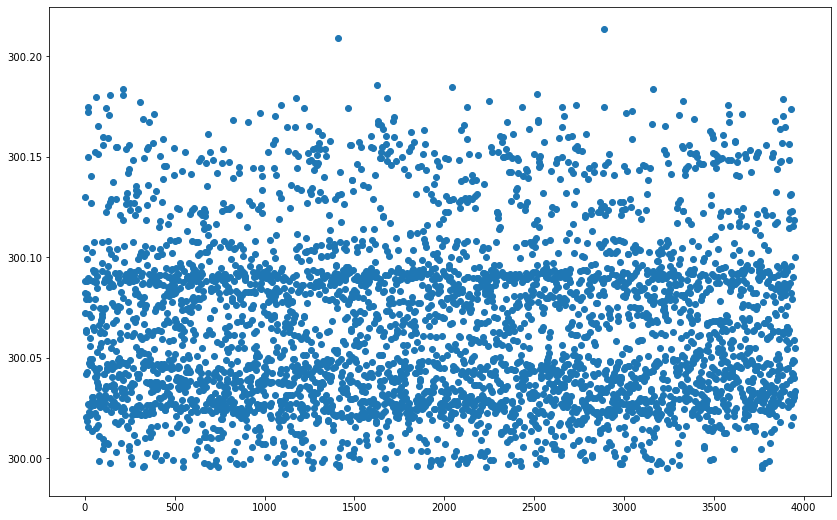

In [23]:
plt.figure(figsize=(14,9))
plt.scatter(np.arange(len(df_lgb_sub_pred)), df_lgb_sub_pred['size1'])
plt.show()

In [24]:
lgb_train_score = my_loss(np.array(df_lgb_train_pred), np.array(df_y_train))
lgb_train_score

array([2.51878980e+14, 8.20459163e+03, 6.05920029e+03])

In [25]:
x_2score_train, x_2score_test, y_2score_train, y_2score_test = train_test_split(
                                           df_x_train, df_y_train, random_state=1,
                                           train_size = 0.9, test_size=0.1)

lgb_test_score = my_loss(np.array(df_lgb_test_pred), np.array(y_2score_test))
lgb_test_score

array([ 1677.778631  , 68428.7447098 , 46300.24439094])

现在训练的尺寸是:  size1
现在进行的训练轮次为: 0
train index : [    0     1     2 ... 14936 14938 14939]
test index : [    5    10    15 ... 14929 14934 14937]
           size1  size2  size3
0     300.083036    0.0    0.0
1     300.017982    0.0    0.0
2     300.023242    0.0    0.0
3     299.964878    0.0    0.0
4     300.006069    0.0    0.0
...          ...    ...    ...
1655  300.066105    0.0    0.0
1656  300.076292    0.0    0.0
1657  300.080726    0.0    0.0
1658  300.068380    0.0    0.0
1659  300.098434    0.0    0.0

[1660 rows x 3 columns]


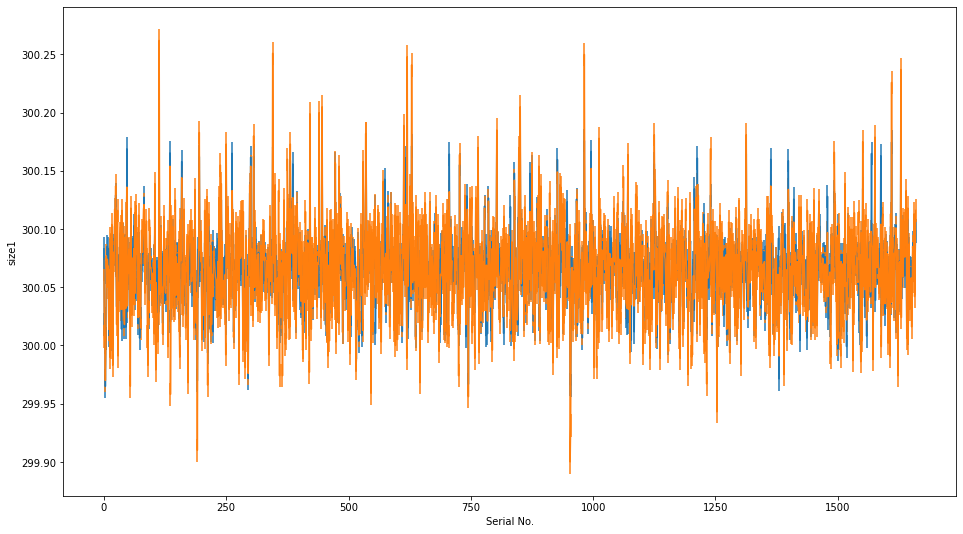

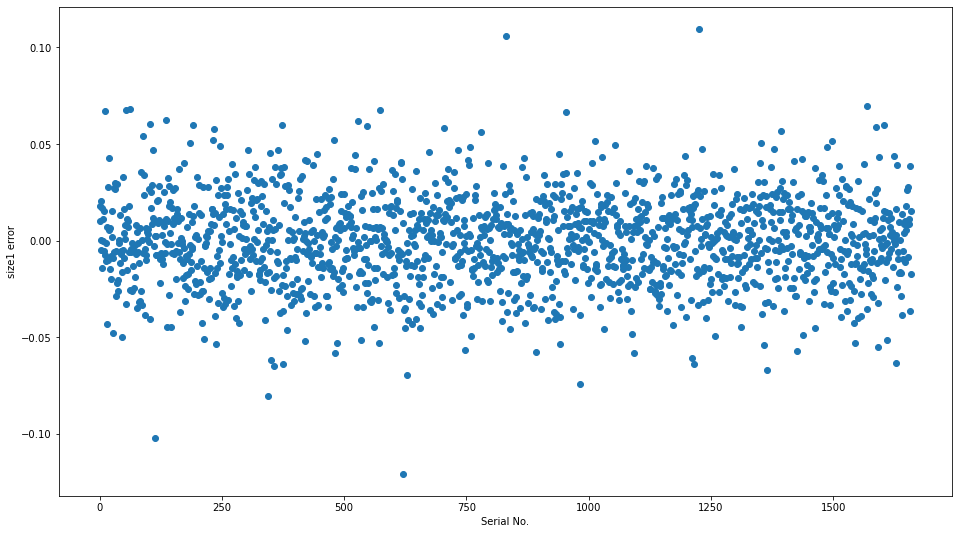

GB1均方差得分为： 0.0005187907261844725
现在进行的训练轮次为: 1
train index : [    3     4     5 ... 14937 14938 14939]
test index : [    0     1     2 ... 14923 14930 14932]
           size1  size2  size3
0     600.165610    0.0    0.0
1     600.035354    0.0    0.0
2     600.047270    0.0    0.0
3     599.937382    0.0    0.0
4     600.012452    0.0    0.0
...          ...    ...    ...
1655  600.133049    0.0    0.0
1656  600.152615    0.0    0.0
1657  600.160860    0.0    0.0
1658  600.136023    0.0    0.0
1659  600.196375    0.0    0.0

[1660 rows x 3 columns]


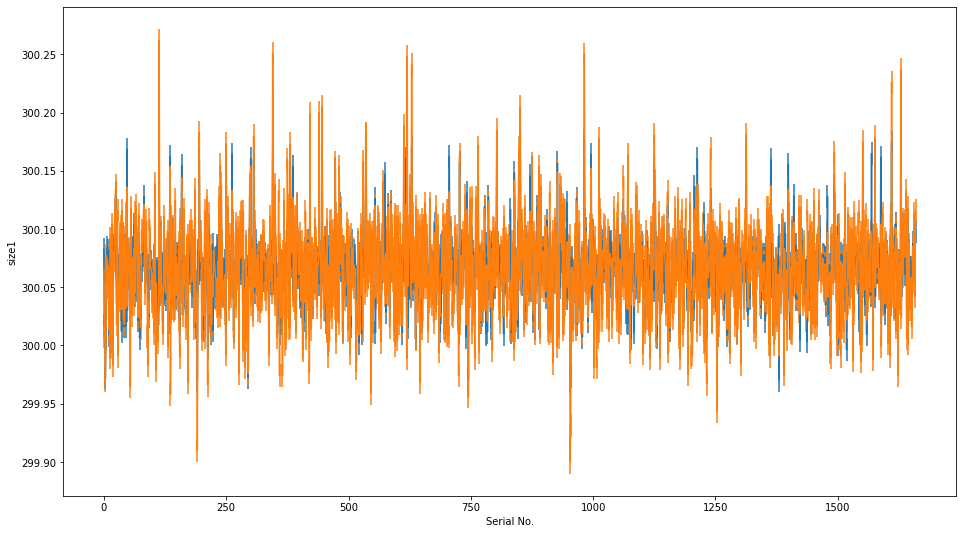

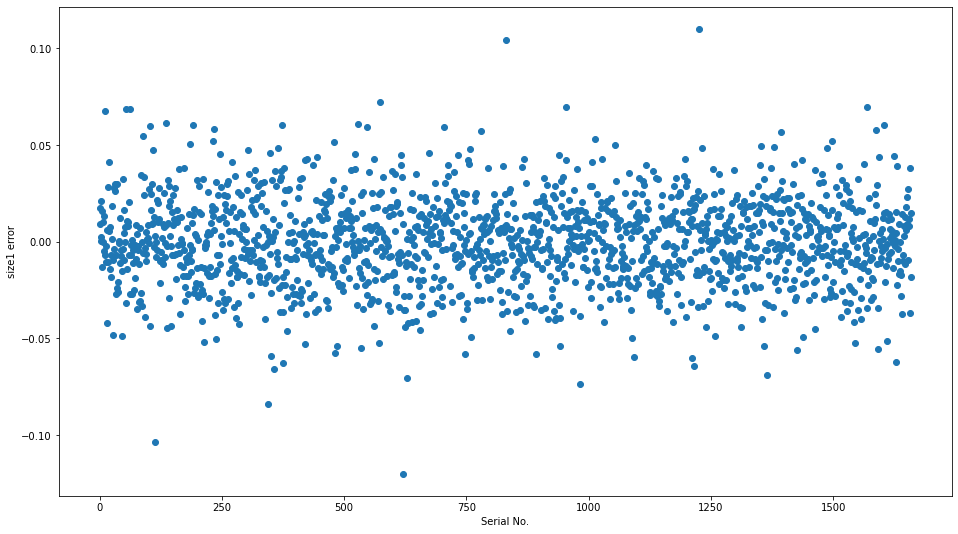

GB1均方差得分为： 0.0005200724102530248
现在进行的训练轮次为: 2
train index : [    0     1     2 ... 14937 14938 14939]
test index : [    3     4     7 ... 14931 14933 14936]
           size1  size2  size3
0     900.248099    0.0    0.0
1     900.054078    0.0    0.0
2     900.071779    0.0    0.0
3     899.908286    0.0    0.0
4     900.018464    0.0    0.0
...          ...    ...    ...
1655  900.199322    0.0    0.0
1656  900.230095    0.0    0.0
1657  900.241814    0.0    0.0
1658  900.203118    0.0    0.0
1659  900.295743    0.0    0.0

[1660 rows x 3 columns]


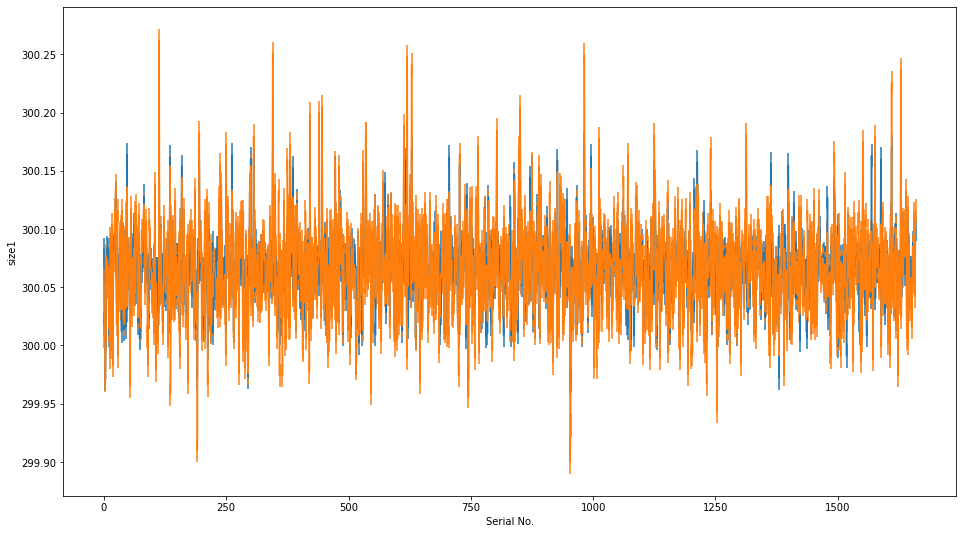

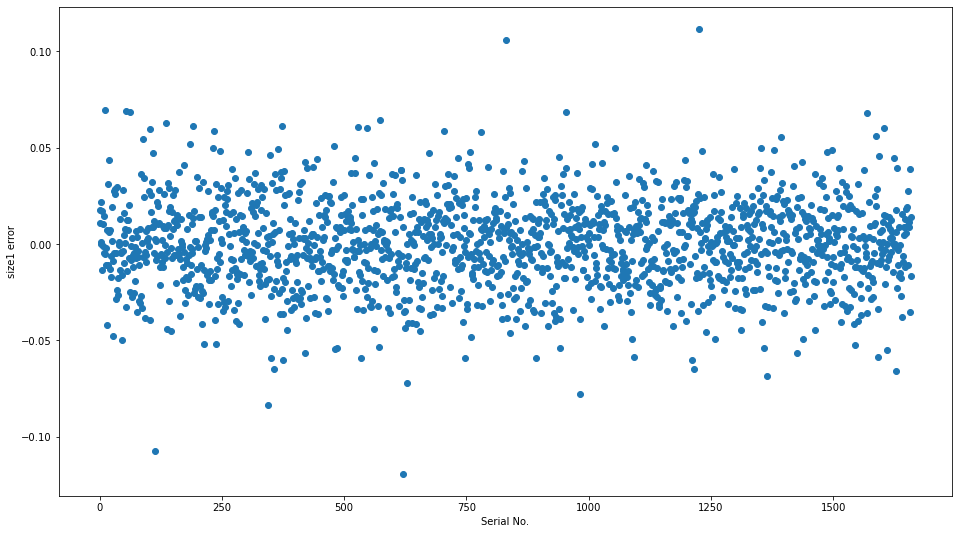

GB1均方差得分为： 0.0005218314122437139
现在进行的训练轮次为: 3
train index : [    0     1     2 ... 14936 14937 14939]
test index : [    8    14    21 ... 14926 14928 14938]
            size1  size2  size3
0     1200.331378    0.0    0.0
1     1200.072824    0.0    0.0
2     1200.094462    0.0    0.0
3     1199.877203    0.0    0.0
4     1200.027174    0.0    0.0
...           ...    ...    ...
1655  1200.265923    0.0    0.0
1656  1200.305847    0.0    0.0
1657  1200.321778    0.0    0.0
1658  1200.271969    0.0    0.0
1659  1200.394228    0.0    0.0

[1660 rows x 3 columns]


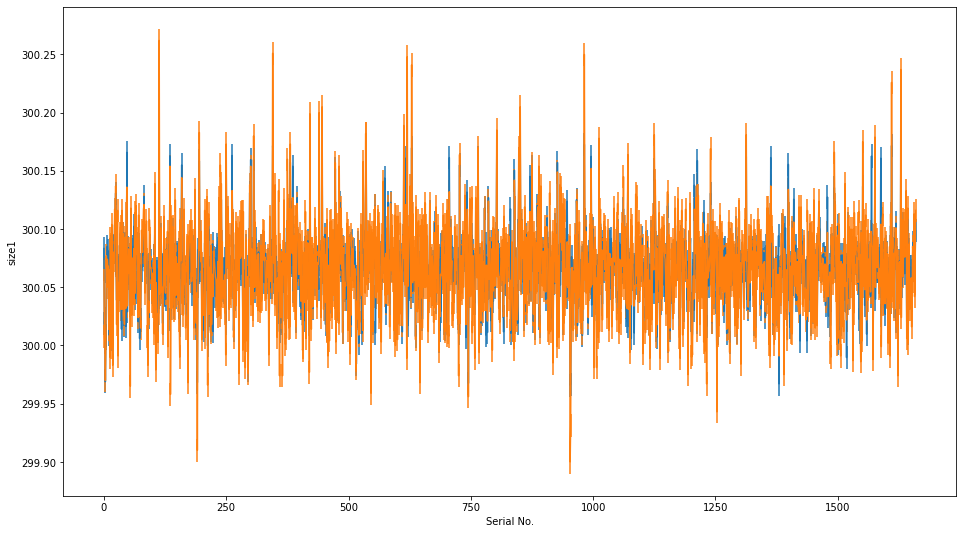

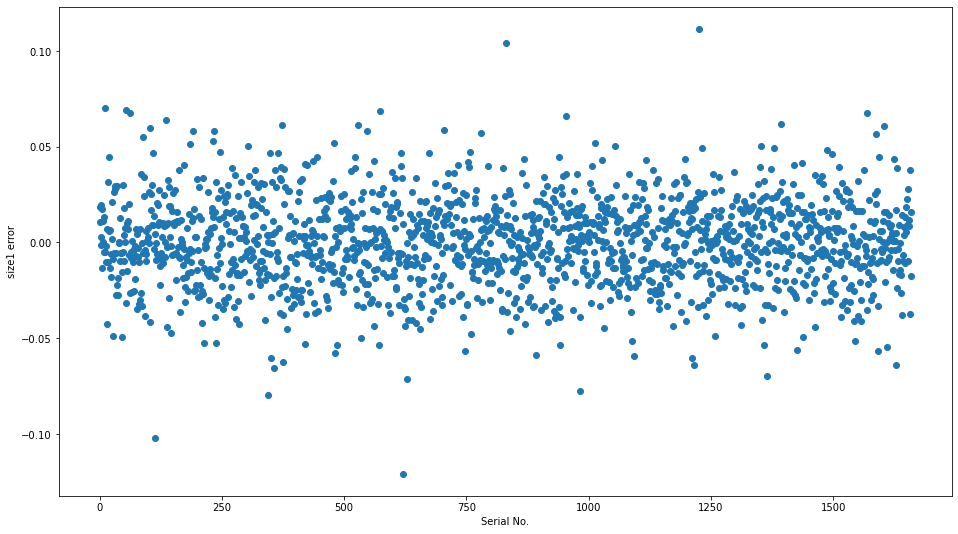

GB1均方差得分为： 0.0005193726193507655
现在进行的训练轮次为: 4
train index : [    0     1     2 ... 14936 14937 14938]
test index : [    6    11    13 ... 14922 14935 14939]
            size1  size2  size3
0     1500.414489    0.0    0.0
1     1500.090607    0.0    0.0
2     1500.117201    0.0    0.0
3     1499.851457    0.0    0.0
4     1500.032447    0.0    0.0
...           ...    ...    ...
1655  1500.332588    0.0    0.0
1656  1500.382514    0.0    0.0
1657  1500.403427    0.0    0.0
1658  1500.340115    0.0    0.0
1659  1500.492638    0.0    0.0

[1660 rows x 3 columns]


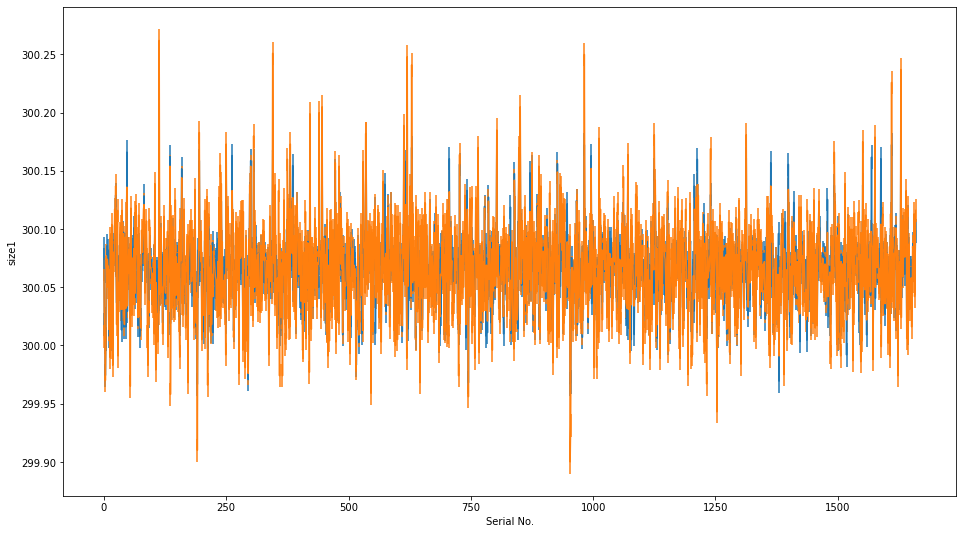

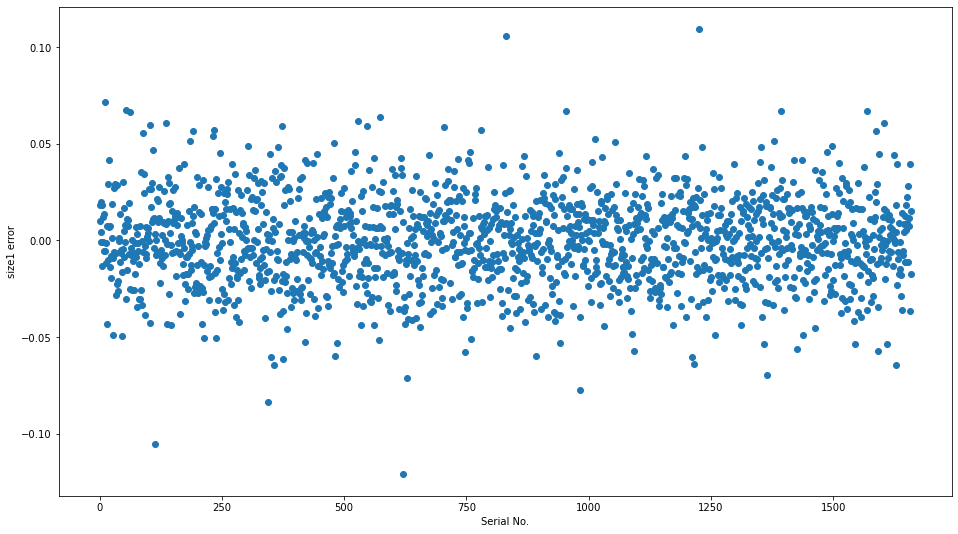

GB1均方差得分为： 0.000518129357939723
++++++++++++++++++++++++++++++++++++++++++++
           size1  size2  size3
0     300.082898    0.0    0.0
1     300.018121    0.0    0.0
2     300.023440    0.0    0.0
3     299.970291    0.0    0.0
4     300.006489    0.0    0.0
...          ...    ...    ...
1655  300.066518    0.0    0.0
1656  300.076503    0.0    0.0
1657  300.080685    0.0    0.0
1658  300.068023    0.0    0.0
1659  300.098528    0.0    0.0

[1660 rows x 3 columns]
            size1  size2  size3
0      300.027730    0.0    0.0
1      300.029411    0.0    0.0
2      300.020031    0.0    0.0
3      300.019695    0.0    0.0
4      300.018227    0.0    0.0
...           ...    ...    ...
16595  300.088311    0.0    0.0
16596  300.085942    0.0    0.0
16597  300.088290    0.0    0.0
16598  300.088582    0.0    0.0
16599  300.086451    0.0    0.0

[16600 rows x 3 columns]
           size1  size2  size3
0     300.127770    0.0    0.0
1     300.108119    0.0    0.0
2     300.111173    0.0

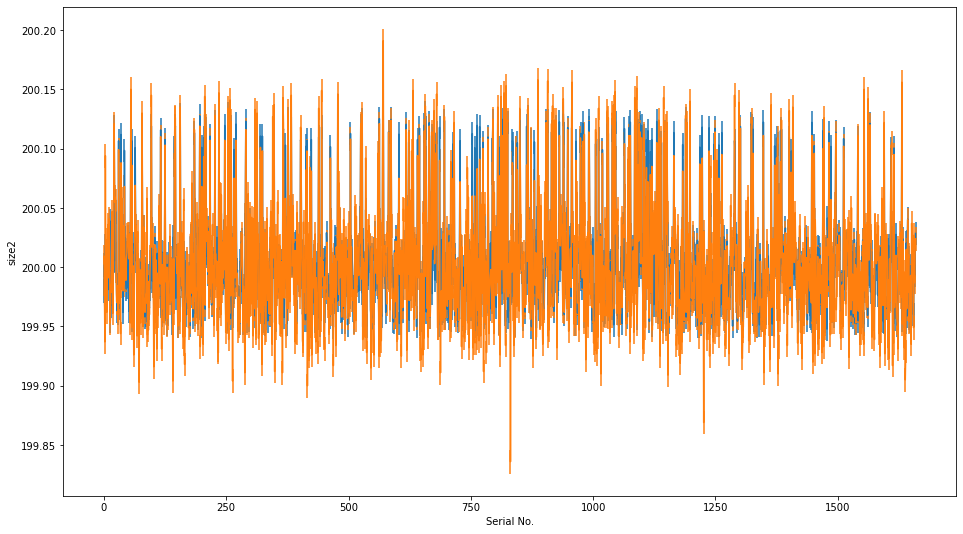

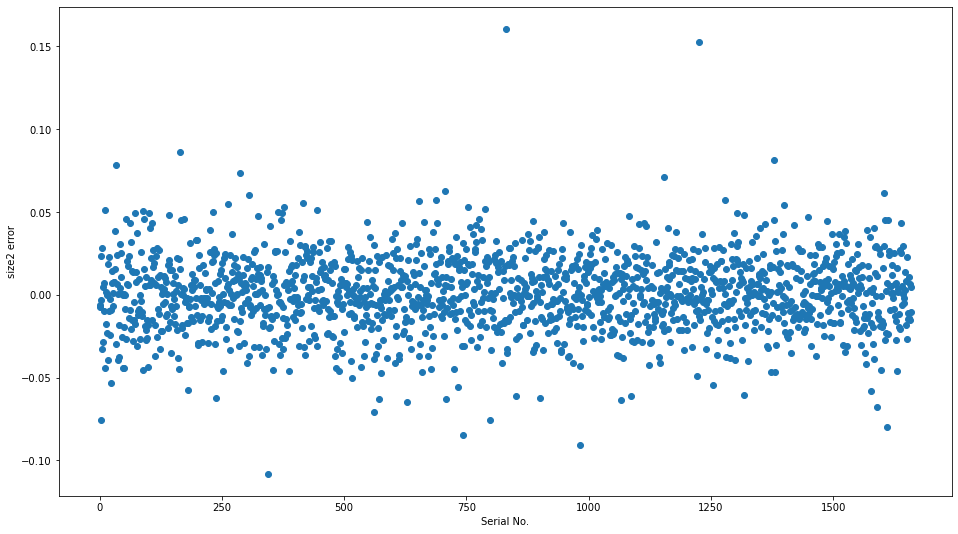

GB1均方差得分为： 0.0005101748158983508
现在进行的训练轮次为: 1
train index : [    0     2     3 ... 14937 14938 14939]
test index : [    1     4     7 ... 14930 14931 14934]
           size1       size2  size3
0     300.082898  400.002024    0.0
1     300.018121  399.959257    0.0
2     300.023440  399.920219    0.0
3     299.970291  400.036143    0.0
4     300.006489  399.949637    0.0
...          ...         ...    ...
1655  300.066518  399.918680    0.0
1656  300.076503  400.023174    0.0
1657  300.080685  399.986085    0.0
1658  300.068023  400.004707    0.0
1659  300.098528  400.057439    0.0

[1660 rows x 3 columns]


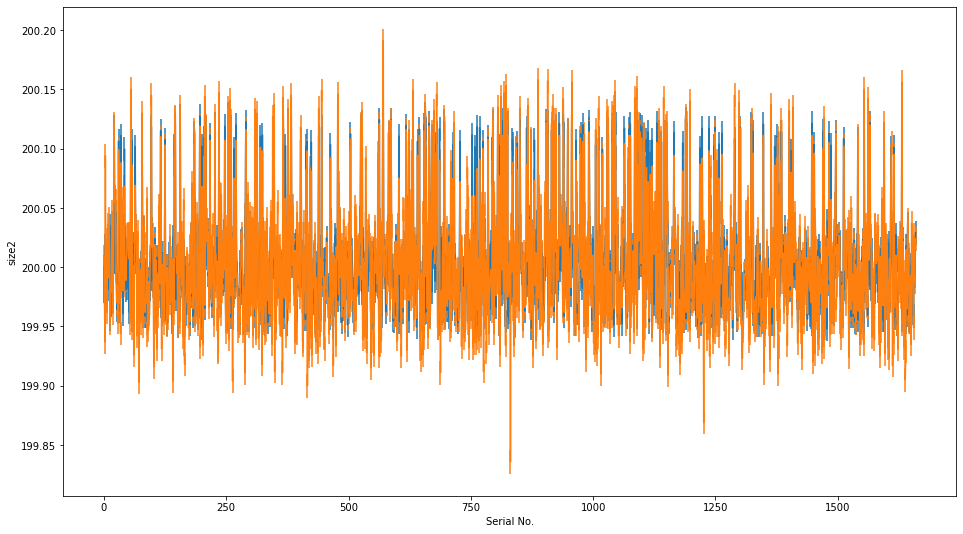

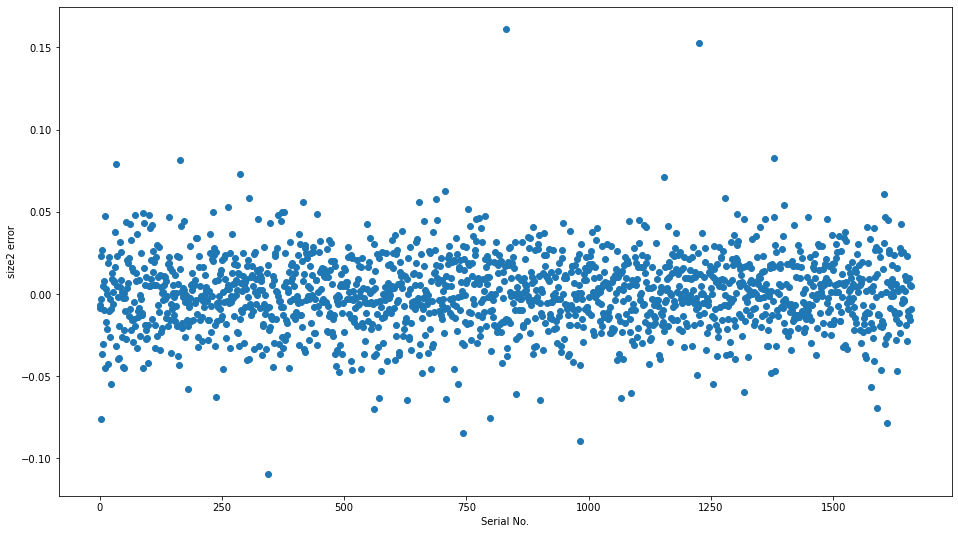

GB1均方差得分为： 0.0005100827399216429
现在进行的训练轮次为: 2
train index : [    0     1     3 ... 14936 14937 14938]
test index : [    2    16    18 ... 14926 14935 14939]
           size1       size2  size3
0     300.082898  600.001950    0.0
1     300.018121  599.939550    0.0
2     300.023440  599.881745    0.0
3     299.970291  600.054860    0.0
4     300.006489  599.925570    0.0
...          ...         ...    ...
1655  300.066518  599.875558    0.0
1656  300.076503  600.035612    0.0
1657  300.080685  599.979953    0.0
1658  300.068023  600.007534    0.0
1659  300.098528  600.087885    0.0

[1660 rows x 3 columns]


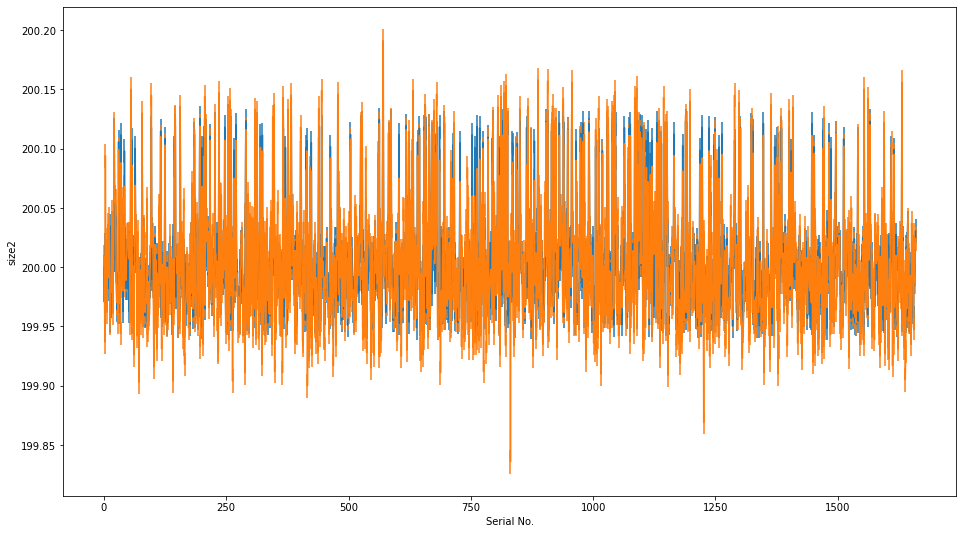

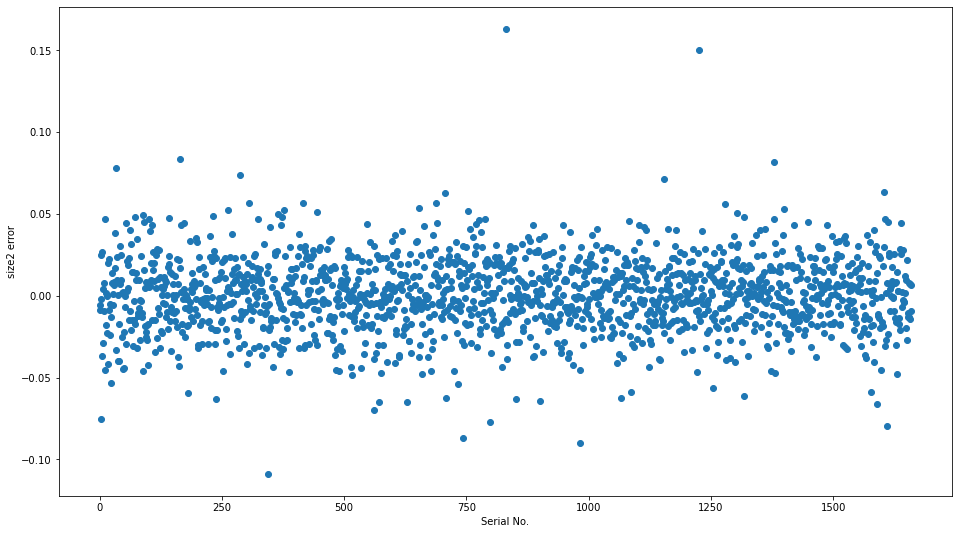

GB1均方差得分为： 0.0005100269230030883
现在进行的训练轮次为: 3
train index : [    0     1     2 ... 14935 14936 14939]
test index : [    6     9    10 ... 14933 14937 14938]
           size1       size2  size3
0     300.082898  800.002743    0.0
1     300.018121  799.920528    0.0
2     300.023440  799.845785    0.0
3     299.970291  800.074421    0.0
4     300.006489  799.900870    0.0
...          ...         ...    ...
1655  300.066518  799.834740    0.0
1656  300.076503  800.046554    0.0
1657  300.080685  799.973173    0.0
1658  300.068023  800.008107    0.0
1659  300.098528  800.118108    0.0

[1660 rows x 3 columns]


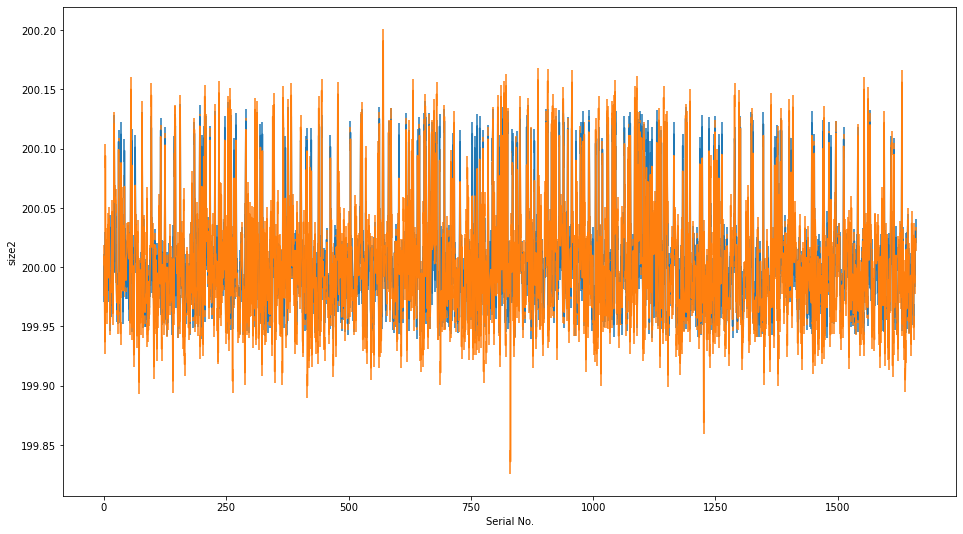

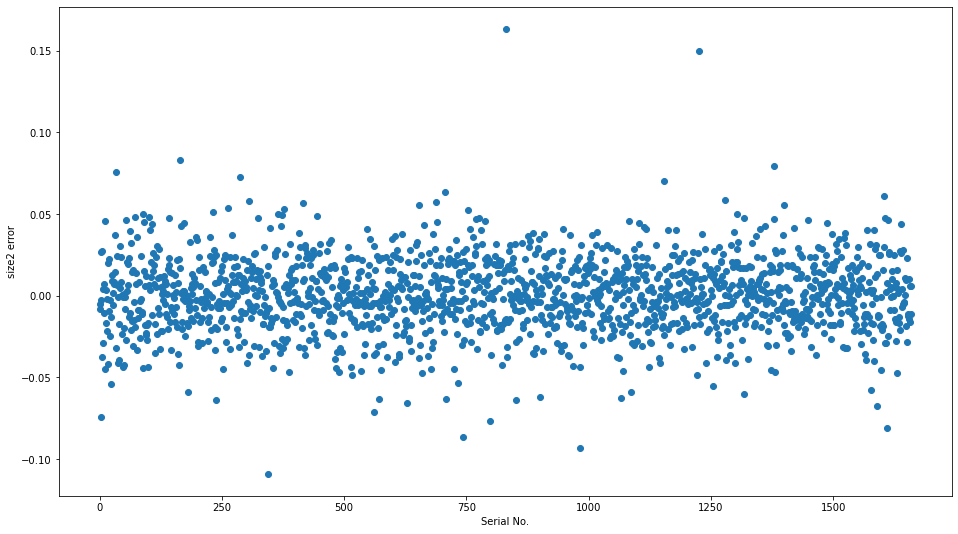

GB1均方差得分为： 0.0005119362359181318
现在进行的训练轮次为: 4
train index : [    1     2     4 ... 14937 14938 14939]
test index : [    0     3     8 ... 14922 14929 14936]
           size1        size2  size3
0     300.082898  1000.004285    0.0
1     300.018121   999.899720    0.0
2     300.023440   999.807992    0.0
3     299.970291  1000.091054    0.0
4     300.006489   999.875525    0.0
...          ...          ...    ...
1655  300.066518   999.793619    0.0
1656  300.076503  1000.057672    0.0
1657  300.080685   999.967602    0.0
1658  300.068023  1000.009801    0.0
1659  300.098528  1000.145086    0.0

[1660 rows x 3 columns]


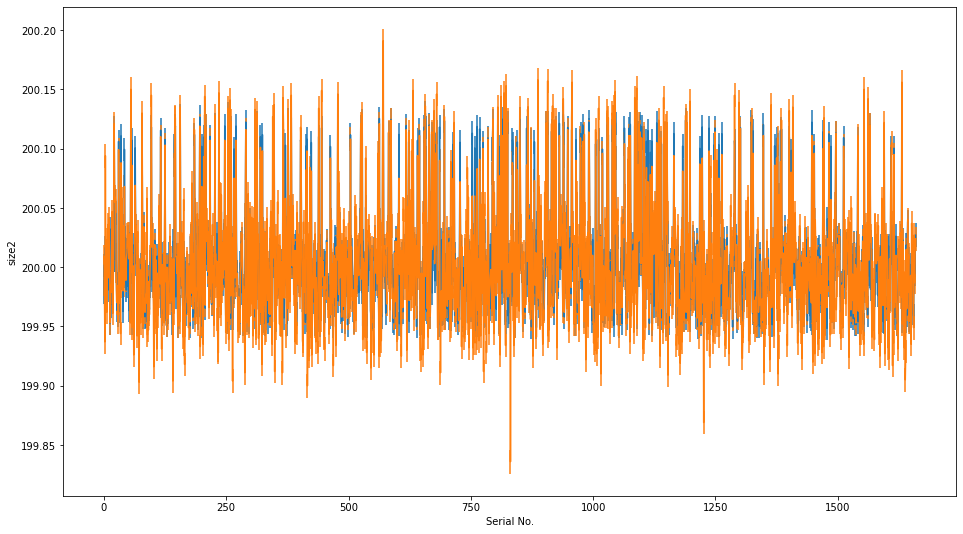

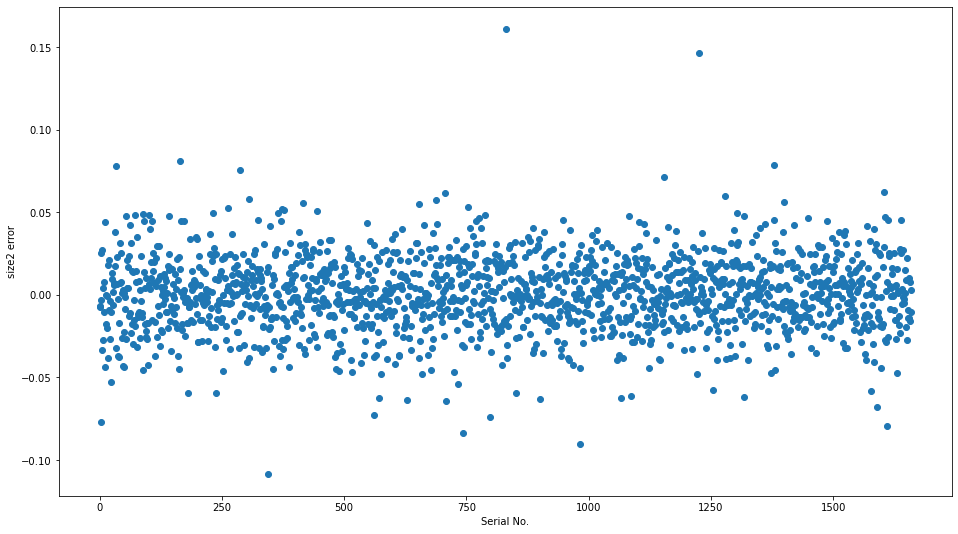

GB1均方差得分为： 0.0005090947157649105
++++++++++++++++++++++++++++++++++++++++++++
           size1       size2  size3
0     300.082898  200.000857    0.0
1     300.018121  199.979944    0.0
2     300.023440  199.961598    0.0
3     299.970291  200.018211    0.0
4     300.006489  199.975105    0.0
...          ...         ...    ...
1655  300.066518  199.958724    0.0
1656  300.076503  200.011534    0.0
1657  300.080685  199.993520    0.0
1658  300.068023  200.001960    0.0
1659  300.098528  200.029017    0.0

[1660 rows x 3 columns]
            size1       size2  size3
0      300.027730  199.959470    0.0
1      300.029411  199.963534    0.0
2      300.020031  199.957460    0.0
3      300.019695  199.957078    0.0
4      300.018227  199.957867    0.0
...           ...         ...    ...
16595  300.088311  200.127486    0.0
16596  300.085942  200.126081    0.0
16597  300.088290  200.127885    0.0
16598  300.088582  200.127454    0.0
16599  300.086451  200.128741    0.0

[16600 rows x 3 colu

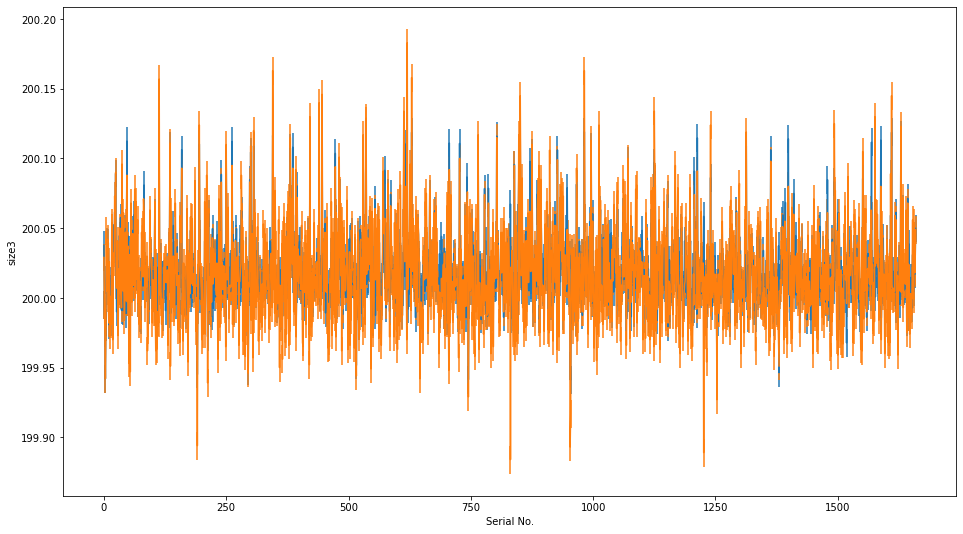

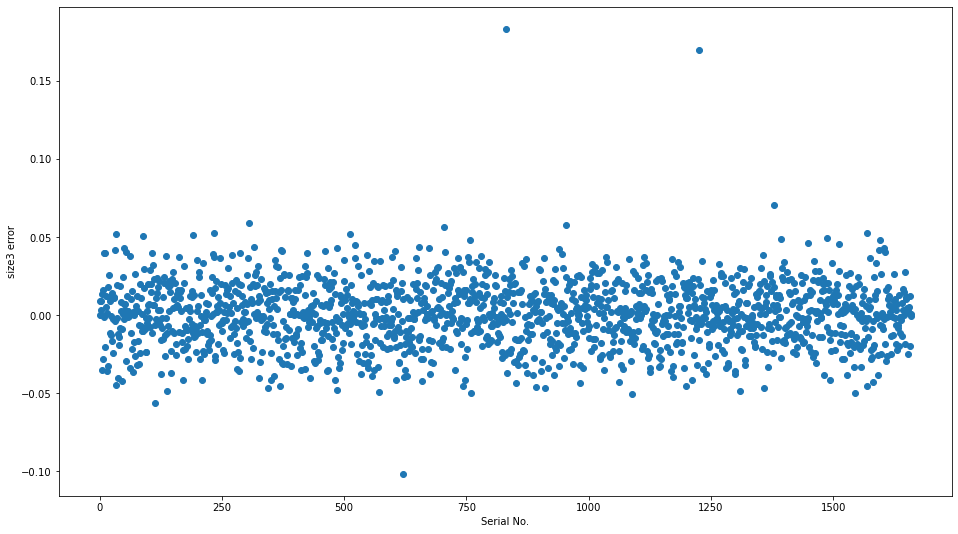

GB1均方差得分为： 0.00042474549721521423
现在进行的训练轮次为: 1
train index : [    0     1     4 ... 14936 14937 14939]
test index : [    2     3     5 ... 14932 14935 14938]
           size1       size2       size3
0     300.082898  200.000857  400.076009
1     300.018121  199.979944  399.988009
2     300.023440  199.961598  399.968055
3     299.970291  200.018211  399.888436
4     300.006489  199.975105  399.963875
...          ...         ...         ...
1655  300.066518  199.958724  400.008819
1656  300.076503  200.011534  400.064392
1657  300.080685  199.993520  400.061737
1658  300.068023  200.001960  400.034461
1659  300.098528  200.029017  400.099008

[1660 rows x 3 columns]


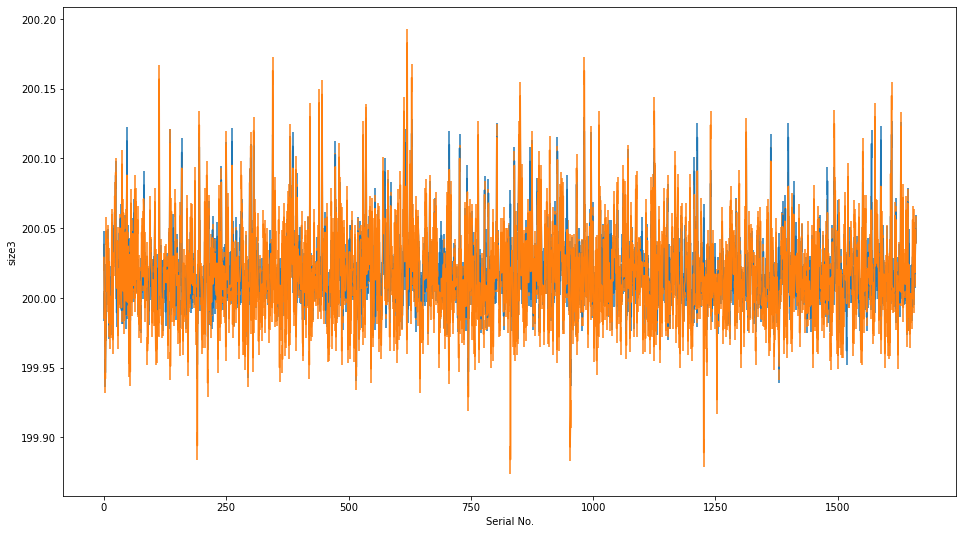

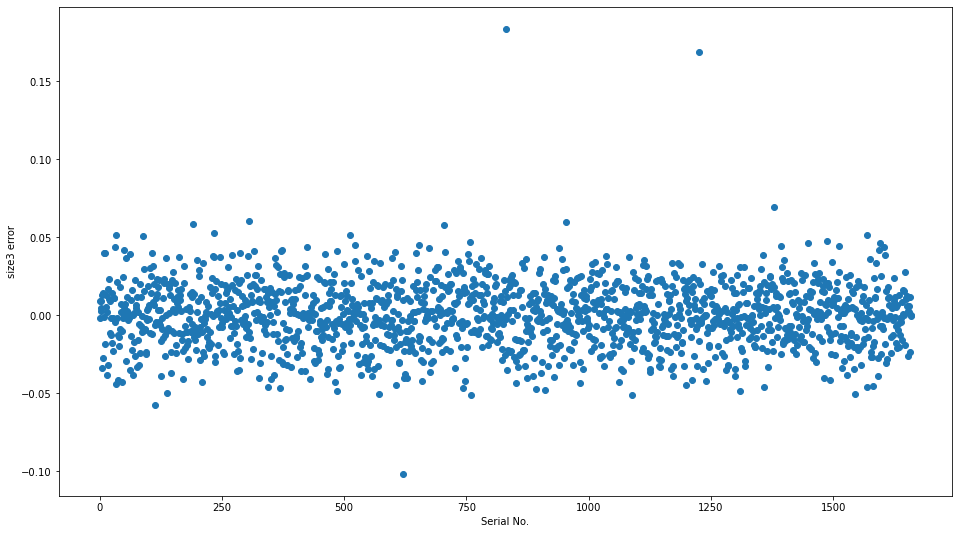

GB1均方差得分为： 0.0004251650884081729
现在进行的训练轮次为: 2
train index : [    2     3     4 ... 14935 14936 14938]
test index : [    0     1    14 ... 14934 14937 14939]
           size1       size2       size3
0     300.082898  200.000857  600.114075
1     300.018121  199.979944  599.981669
2     300.023440  199.961598  599.953165
3     299.970291  200.018211  599.827916
4     300.006489  199.975105  599.946175
...          ...         ...         ...
1655  300.066518  199.958724  600.012190
1656  300.076503  200.011534  600.094417
1657  300.080685  199.993520  600.091592
1658  300.068023  200.001960  600.052323
1659  300.098528  200.029017  600.149637

[1660 rows x 3 columns]


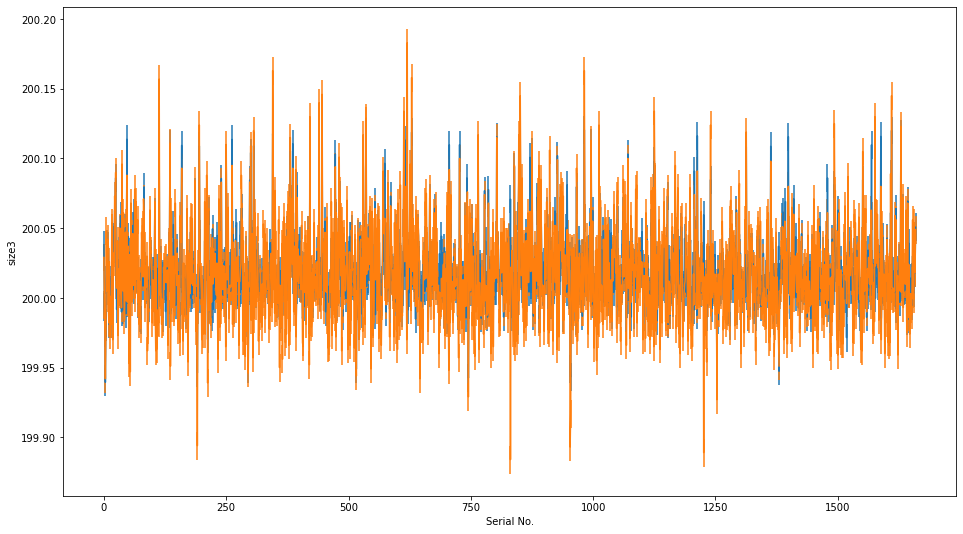

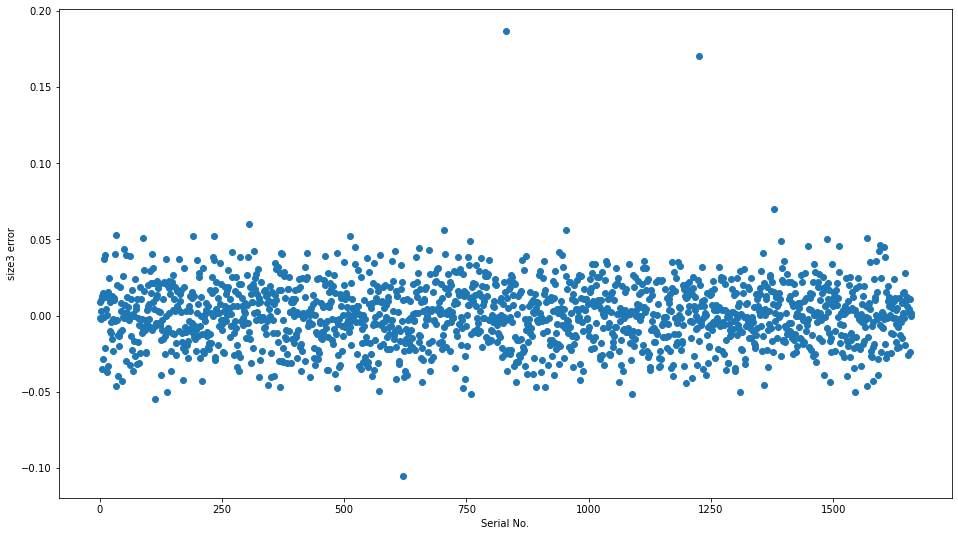

GB1均方差得分为： 0.00042742441091189493
现在进行的训练轮次为: 3
train index : [    0     1     2 ... 14937 14938 14939]
test index : [    4     7    10 ... 14925 14927 14936]
           size1       size2       size3
0     300.082898  200.000857  800.151568
1     300.018121  199.979944  799.975918
2     300.023440  199.961598  799.938321
3     299.970291  200.018211  799.765309
4     300.006489  199.975105  799.928761
...          ...         ...         ...
1655  300.066518  199.958724  800.016037
1656  300.076503  200.011534  800.125963
1657  300.080685  199.993520  800.121521
1658  300.068023  200.001960  800.070246
1659  300.098528  200.029017  800.199291

[1660 rows x 3 columns]


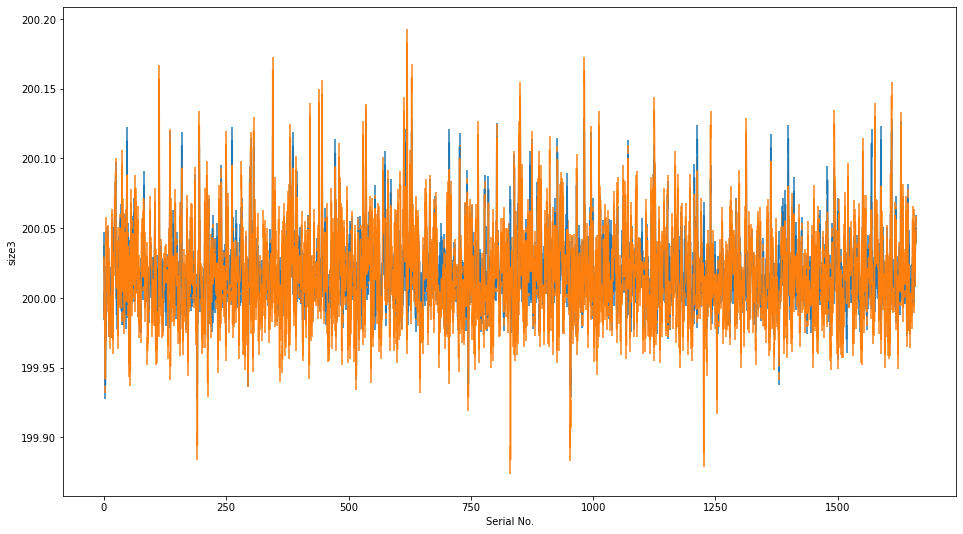

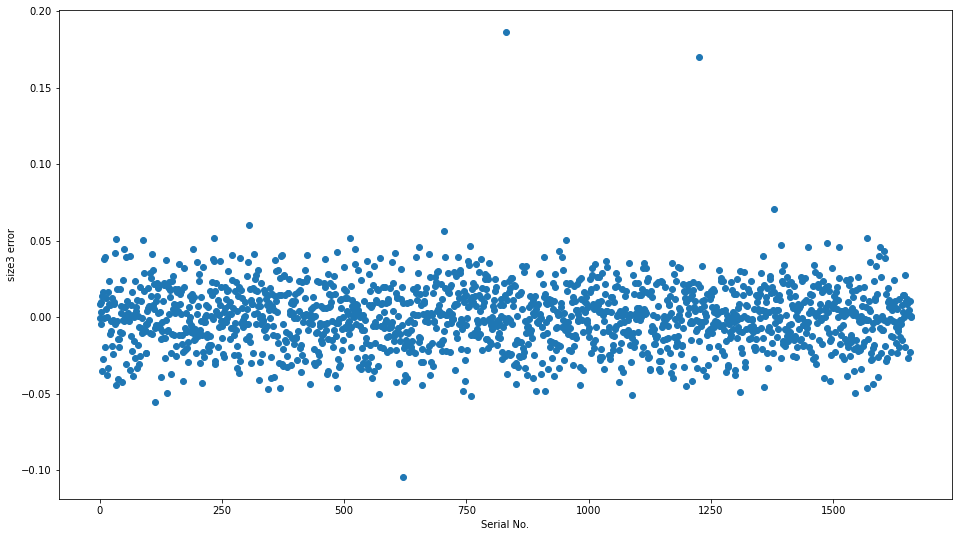

GB1均方差得分为： 0.0004242572089309105
现在进行的训练轮次为: 4
train index : [    0     1     2 ... 14937 14938 14939]
test index : [    6     8    20 ... 14929 14930 14933]
           size1       size2        size3
0     300.082898  200.000857  1000.188757
1     300.018121  199.979944   999.969985
2     300.023440  199.961598   999.922778
3     299.970291  200.018211   999.705205
4     300.006489  199.975105   999.911709
...          ...         ...          ...
1655  300.066518  199.958724  1000.019581
1656  300.076503  200.011534  1000.157464
1657  300.080685  199.993520  1000.152395
1658  300.068023  200.001960  1000.088112
1659  300.098528  200.029017  1000.247656

[1660 rows x 3 columns]


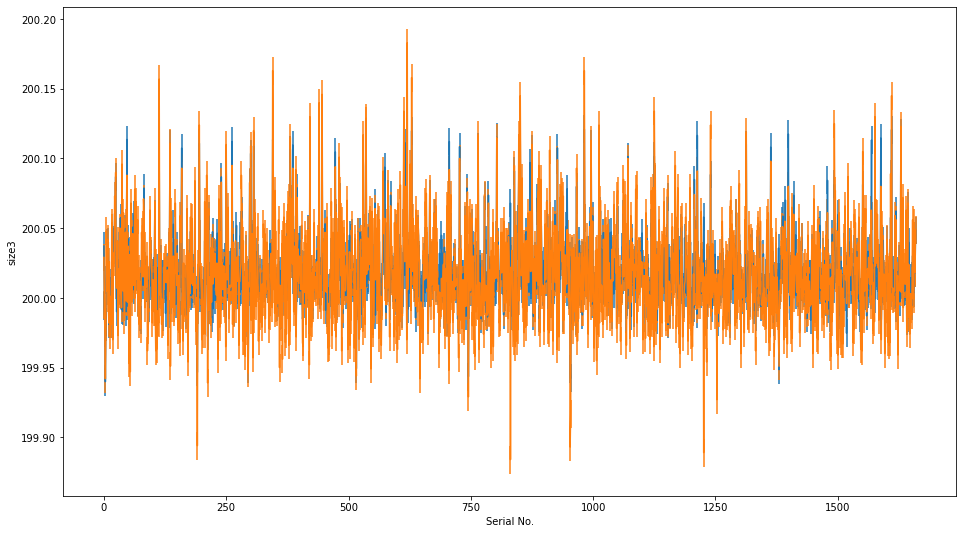

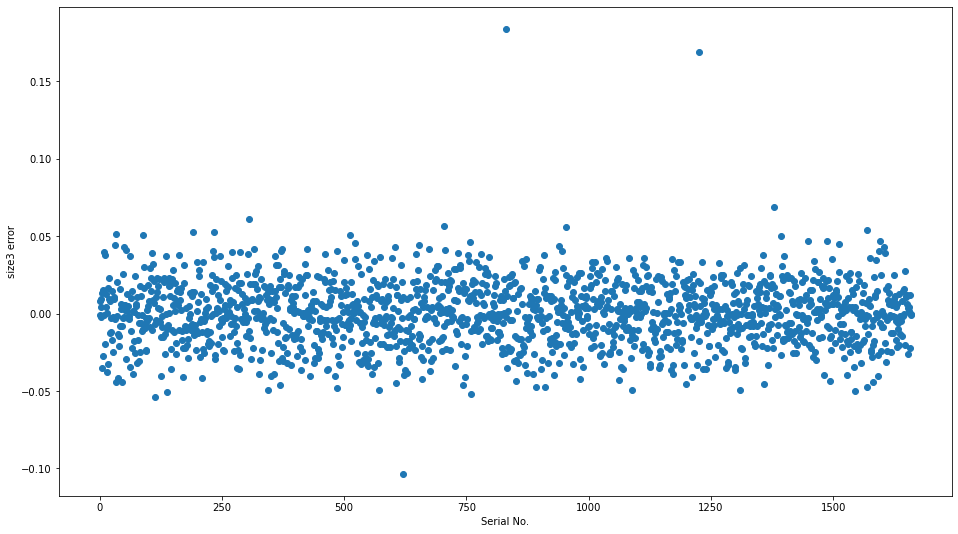

GB1均方差得分为： 0.0004250880405955296
++++++++++++++++++++++++++++++++++++++++++++
           size1       size2       size3
0     300.082898  200.000857  200.037751
1     300.018121  199.979944  199.993997
2     300.023440  199.961598  199.984556
3     299.970291  200.018211  199.941041
4     300.006489  199.975105  199.982342
...          ...         ...         ...
1655  300.066518  199.958724  200.003916
1656  300.076503  200.011534  200.031493
1657  300.080685  199.993520  200.030479
1658  300.068023  200.001960  200.017622
1659  300.098528  200.029017  200.049531

[1660 rows x 3 columns]
            size1       size2       size3
0      300.027730  199.959470  199.984513
1      300.029411  199.963534  199.987890
2      300.020031  199.957460  199.988822
3      300.019695  199.957078  199.984641
4      300.018227  199.957867  199.986629
...           ...         ...         ...
16595  300.088311  200.127486  200.041115
16596  300.085942  200.126081  200.041101
16597  300.088290  200.1278

In [23]:
from sklearn.model_selection import train_test_split

n_folds = 5
kf = KFold(n_splits = n_folds, shuffle = True)

n_test = np.zeros(((int(len(df_x_train)/10)), 3))
df_gb_test_pred = pd.DataFrame(n_test, columns=['size1', 'size2', 'size3'])

n_train = np.zeros((len(df_y_train), 3))
df_gb_train_pred = pd.DataFrame(n_train, columns=['size1', 'size2', 'size3'])

n_sub = np.zeros((len(df_x_sub), 3))
df_gb_sub_pred = pd.DataFrame(n_sub, columns=['size1', 'size2', 'size3'])


for size in ['size1', 'size2', 'size3']:
    
    print('现在训练的尺寸是: ', size)
    
    x_pre_train, x_test, y_pre_train, y_test = train_test_split(
                                               df_x_train, df_y_train[size], random_state=1,
                                               train_size = 0.9, test_size=0.1)    
    
    count_gb = 0
    
    for train_index, test_index in kf.split(x_pre_train):
        print('现在进行的训练轮次为:', count_gb)
        print('train index :', train_index)
        print('test index :', test_index)
        x_t, x_v = x_pre_train.values[train_index], x_pre_train.values[test_index]
        y_t, y_v = y_pre_train.values[train_index], y_pre_train.values[test_index]

        gb1.fit(x_t, y_t)
        gb1_pred = gb1.predict(np.array(x_test))
        gb1_score = mean_squared_error(y_test, gb1_pred)

        # 将test train和sub的预测值每轮相加，最后求平均
        df_gb_test_pred[size] += gb1_pred
        print(df_gb_test_pred)
        df_gb_train_pred[size] += gb1.predict(np.array(df_x_train))
        df_gb_sub_pred[size] += gb1.predict(np.array(df_x_sub))

        plt_error(gb1_pred, y_test, size)
        print('GB1均方差得分为：', gb1_score)
        print('======================================================================')

        count_gb += 1

    print('++++++++++++++++++++++++++++++++++++++++++++')
    df_gb_test_pred[size] = df_gb_test_pred[size] / n_folds
    print(df_gb_test_pred)
    df_gb_train_pred[size] = df_gb_train_pred[size] / n_folds
    print(df_gb_train_pred)
    df_gb_sub_pred[size] = df_gb_sub_pred[size] / n_folds
    print(df_gb_sub_pred)



In [24]:
gb_train_score = my_loss(np.array(df_gb_train_pred), np.array(df_y_train))
gb_train_score

array([4.33645002e+17, 1.54817353e+04, 1.46943543e+04])

In [25]:
x_2score_train, x_2score_test, y_2score_train, y_2score_test = train_test_split(
                                           df_x_train, df_y_train, random_state=1,
                                           train_size = 0.9, test_size=0.1)

gb_test_score = my_loss(np.array(df_gb_test_pred), np.array(y_2score_test))
gb_test_score

array([ 1755.60682117, 50165.65666624, 69730.3918376 ])

In [26]:
df_xgb_sub_pred.to_csv('y_pred_xgb_f1022_202_20201005.csv')
df_lgb_sub_pred.to_csv('y_pred_lgb_f1022_202_20201005.csv')
df_gb_sub_pred.to_csv('y_pred_gb_f1022_202_20201005.csv')

In [27]:
# 进行模型的stacking

stacking_columns = ['x_size1', 'x_size2', 'x_size3', 'l_size1', 'l_size2', 'l_size3',
                   'g_size1', 'g_size2', 'g_size3']
df_x_stacking = pd.concat([df_xgb_train_pred, df_lgb_train_pred, df_gb_train_pred], axis=1)
df_x_stacking.columns = stacking_columns
df_x_stacking


,x_size1,x_size2,x_size3,l_size1,l_size2,l_size3,g_size1,g_size2,g_size3
0,300.030652,199.968161,199.990970,300.026579,199.958288,199.983990,300.027730,199.959470,199.984513
1,300.030945,199.968881,199.991959,300.028671,199.960851,199.987328,300.029411,199.963534,199.987890
2,300.029468,199.974722,199.992477,300.019582,199.953405,199.983990,300.020031,199.957460,199.988822
3,300.026453,199.974243,199.992426,300.018772,199.953405,199.983990,300.019695,199.957078,199.984641
4,300.022864,199.973953,199.985370,300.018529,199.953405,199.984305,300.018227,199.957867,199.986629
...,...,...,...,...,...,...,...,...,...
16595,300.079834,200.116882,200.029654,300.090986,200.126868,200.041446,300.088311,200.127486,200.041115
16596,300.077954,200.115283,200.029495,300.091245,200.126207,200.041719,300.085942,200.126081,200.041101
16597,300.079559,200.117969,200.029510,300.089641,200.127674,200.041719,300.088290,200.127885,200.040409
16598,300.079633,200.117963,200.030850,300.089641,200.126546,200.041719,300.088582,200.127454,200.041422


In [28]:
from bayes_opt import BayesianOptimization

n_folds = 5

# 把学习率手动设置
def xgb_stacking_cv(max_depth,
                   learning_rate,
                   n_estimators,
                   min_child_weight,
                   subsample,
                   colsample_bytree, 
                   reg_alpha,
                   gamma):
    val = cross_val_score(estimator=xgb.XGBRegressor(max_depth=int(max_depth),
                                                 learning_rate= learning_rate,
                                                 n_estimators=int(n_estimators),
                                                 min_child_weight=min_child_weight,
                                                 subsample=max(min(subsample, 1), 0),
                                                 colsample_bytree=max(min(colsample_bytree, 1), 0),
                                                 reg_alpha=max(reg_alpha, 0), gamma=gamma, objective='reg:squarederror',
                                                 booster='gbtree',
                                                 seed=888), 
                          X=df_x_stacking, y=df_y_train['size1'], scoring='neg_mean_squared_error', cv=n_folds).mean()
    return val

xgb_stacking_bo1 = BayesianOptimization(xgb_stacking_cv, pbounds={'max_depth': (1, 10),
                                               'learning_rate': (0.008, 0.2),
                                               'n_estimators': (1, 1000),
                                               'min_child_weight': (0, 20),
                                               'subsample': (0.001, 1),
                                               'colsample_bytree': (0.01, 1),
                                               'reg_alpha': (0.001, 20),
                                               'gamma': (0.001, 10)})
xgb_stacking_bo1.maximize(n_iter=500, init_points=10)

stacking_params = xgb_stacking_bo1.max['params']
print(stacking_params)
stacking_xgb1 = xgb.XGBRegressor(gamma=stacking_params['gamma'], colsample_bytree=stacking_params['colsample_bytree'],
                    learning_rate= stacking_params['learning_rate'],
                    max_depth=int(stacking_params['max_depth']), min_child_weight=stacking_params['min_child_weight'],
                    n_estimators=int(stacking_params['n_estimators']),
                    reg_alpha=stacking_params['reg_alpha'], subsample=stacking_params['subsample'],
                    objective='reg:squarederror',
                    booster='gbtree')

|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | min_ch... | n_esti... | reg_alpha | subsample |
-------------------------------------------------------------------------------------------------------------------------
|  1        | -0.001285 |  0.8115   |  1.403    |  0.069    |  3.39     |  0.1284   |  806.6    |  6.476    |  0.4973   |
|  2        | -0.000970 |  0.9075   |  0.7596   |  0.1703   |  4.263    |  3.292    |  565.4    |  2.394    |  0.6384   |
|  3        | -0.001901 |  0.9091   |  7.83     |  0.1716   |  5.361    |  11.09    |  279.2    |  15.58    |  0.4479   |
|  4        | -0.001741 |  0.4059   |  4.936    |  0.1674   |  1.126    |  13.23    |  743.7    |  7.36     |  0.7879   |
|  5        | -0.001899 |  0.01026  |  7.342    |  0.1998   |  4.412    |  1.88     |  519.8    |  2.528    |  0.704    |
|  6        | -0.002591 |  0.1665   |  4.26     |  0.1626   |  2.39     |  5.563    |  932.0    |  10.98    |  0.02572  |
|  7        | -0.2206   

|  41       | -198.8    |  0.2383   |  8.923    |  0.04977  |  6.028    |  19.74    |  60.75    |  19.12    |  0.04931  |
|  42       | -0.00143  |  0.2295   |  1.349    |  0.01089  |  3.147    |  0.688    |  971.1    |  1.202    |  0.413    |
|  43       | -0.05464  |  1.0      |  10.0     |  0.008    |  10.0     |  0.0      |  894.7    |  20.0     |  1.0      |
|  44       | -0.00191  |  0.01     |  10.0     |  0.2      |  10.0     |  0.0      |  767.2    |  0.001    |  0.001    |
|  45       | -0.001901 |  0.738    |  8.432    |  0.1634   |  9.447    |  2.641    |  163.5    |  19.99    |  0.62     |
|  46       | -0.000823 |  1.0      |  0.001    |  0.2      |  10.0     |  20.0     |  973.0    |  20.0     |  1.0      |
|  47       | -3.83e+04 |  1.0      |  0.001    |  0.008    |  1.0      |  20.0     |  53.94    |  0.001    |  1.0      |
|  48       | -0.2407   |  0.04073  |  10.0     |  0.1973   |  1.856    |  11.05    |  985.3    |  11.0     |  0.001    |
|  49       | -0.00187  

|  82       | -0.001898 |  0.7044   |  9.945    |  0.1015   |  2.435    |  0.09975  |  397.5    |  0.3309   |  0.1074   |
|  83       | -0.000823 |  1.0      |  0.001    |  0.2      |  10.0     |  20.0     |  567.0    |  20.0     |  1.0      |
|  84       | -0.001895 |  0.01     |  10.0     |  0.2      |  1.0      |  0.0      |  908.8    |  0.001    |  0.001    |
|  85       | -0.000624 |  0.01     |  0.001    |  0.2      |  1.0      |  0.0      |  725.4    |  0.001    |  1.0      |
|  86       | -1.115    |  1.0      |  10.0     |  0.2      |  1.0      |  20.0     |  178.0    |  20.0     |  0.001    |
|  87       | -11.78    |  1.0      |  0.001    |  0.008    |  1.0      |  20.0     |  602.3    |  0.001    |  0.001    |
|  88       | -8.261e+0 |  0.01     |  0.001    |  0.008    |  1.0      |  0.0      |  161.1    |  0.001    |  0.001    |
|  89       | -0.000793 |  1.0      |  0.001    |  0.2      |  1.0      |  20.0     |  1e+03    |  20.0     |  1.0      |
|  90       | -0.001898 

|  123      | -2.014e+0 |  0.01     |  0.001    |  0.008    |  10.0     |  20.0     |  260.1    |  20.0     |  0.001    |
|  124      | -0.000787 |  1.0      |  0.001    |  0.2      |  1.0      |  0.0      |  870.4    |  20.0     |  1.0      |
|  125      | -1.235e+0 |  0.01     |  0.001    |  0.008    |  1.0      |  20.0     |  294.8    |  20.0     |  0.001    |
|  126      | -0.001898 |  0.01     |  10.0     |  0.2      |  10.0     |  0.0      |  947.6    |  0.001    |  1.0      |
|  127      | -0.01436  |  1.0      |  10.0     |  0.2      |  10.0     |  0.0      |  39.21    |  0.001    |  0.001    |
|  128      | -3.454    |  1.0      |  0.001    |  0.008    |  10.0     |  20.0     |  938.2    |  20.0     |  0.001    |
|  129      | -0.245    |  0.01     |  10.0     |  0.008    |  1.0      |  20.0     |  863.4    |  0.001    |  0.001    |
|  130      | -2.133    |  0.01     |  0.001    |  0.008    |  1.0      |  20.0     |  663.5    |  20.0     |  1.0      |
|  131      | -0.018    

|  164      | -0.7906   |  0.01     |  0.001    |  0.2      |  10.0     |  0.0      |  981.0    |  20.0     |  0.001    |
|  165      | -0.001914 |  0.01     |  10.0     |  0.2      |  1.0      |  20.0     |  346.8    |  0.001    |  0.001    |
|  166      | -0.001249 |  1.0      |  0.001    |  0.2      |  10.0     |  0.0      |  469.8    |  0.001    |  0.001    |
|  167      | -64.11    |  0.01     |  0.001    |  0.008    |  1.0      |  20.0     |  488.5    |  0.001    |  0.001    |
|  168      | -0.02154  |  0.01     |  10.0     |  0.008    |  1.0      |  20.0     |  956.6    |  20.0     |  1.0      |
|  169      | -0.001898 |  0.01     |  10.0     |  0.2      |  10.0     |  0.0      |  336.5    |  0.001    |  1.0      |
|  170      | -0.001898 |  1.0      |  10.0     |  0.2      |  1.0      |  20.0     |  85.64    |  0.001    |  1.0      |
|  171      | -0.6543   |  1.0      |  10.0     |  0.2      |  10.0     |  20.0     |  29.93    |  0.001    |  0.001    |
|  172      | -0.001906 

|  205      | -1.723    |  0.01     |  10.0     |  0.2      |  10.0     |  7.638    |  64.5     |  20.0     |  0.001    |
|  206      | -17.9     |  0.01     |  0.001    |  0.008    |  1.0      |  20.0     |  637.3    |  20.0     |  0.001    |
|  207      | -23.72    |  0.01     |  10.0     |  0.008    |  1.0      |  20.0     |  609.0    |  20.0     |  0.001    |
|  208      | -201.0    |  0.01     |  0.001    |  0.008    |  1.0      |  0.0      |  411.1    |  0.001    |  0.001    |
|  209      | -3.501    |  1.0      |  0.001    |  0.008    |  1.0      |  0.0      |  632.7    |  0.001    |  1.0      |
|  210      | -0.001898 |  0.01     |  10.0     |  0.2      |  10.0     |  0.0      |  862.3    |  0.001    |  1.0      |
|  211      | -5.148    |  1.0      |  10.0     |  0.008    |  10.0     |  20.0     |  608.4    |  0.001    |  1.0      |
|  212      | -5.306    |  0.01     |  0.001    |  0.008    |  10.0     |  0.0      |  819.4    |  20.0     |  0.001    |
|  213      | -8.631    

|  246      | -0.7906   |  0.01     |  10.0     |  0.2      |  1.0      |  0.0      |  973.6    |  20.0     |  0.001    |
|  247      | -0.000869 |  1.0      |  0.001    |  0.2      |  10.0     |  0.0      |  368.7    |  20.0     |  1.0      |
|  248      | -0.000869 |  1.0      |  0.001    |  0.2      |  10.0     |  0.0      |  417.7    |  20.0     |  1.0      |
|  249      | -2.935    |  1.0      |  10.0     |  0.008    |  1.0      |  20.0     |  643.8    |  0.001    |  1.0      |
|  250      | -0.01136  |  1.0      |  0.001    |  0.008    |  1.0      |  0.0      |  1e+03    |  20.0     |  1.0      |
|  251      | -1.789    |  0.01     |  10.0     |  0.008    |  1.0      |  0.0      |  674.9    |  20.0     |  1.0      |
|  252      | -0.001898 |  0.01     |  10.0     |  0.2      |  1.0      |  0.0      |  317.9    |  20.0     |  1.0      |
|  253      | -5.74     |  0.01     |  10.0     |  0.008    |  1.0      |  20.0     |  803.9    |  20.0     |  0.001    |
|  254      | -560.4    

|  287      | -0.8122   |  1.0      |  0.001    |  0.2      |  10.0     |  20.0     |  841.4    |  20.0     |  0.001    |
|  288      | -7.335    |  1.0      |  0.001    |  0.008    |  1.0      |  20.0     |  753.2    |  20.0     |  0.001    |
|  289      | -137.7    |  0.01     |  0.001    |  0.008    |  1.0      |  0.0      |  456.8    |  20.0     |  0.001    |
|  290      | -0.001898 |  1.0      |  10.0     |  0.2      |  1.0      |  20.0     |  791.9    |  0.001    |  1.0      |
|  291      | -0.001928 |  0.01     |  10.0     |  0.2      |  10.0     |  0.0      |  733.4    |  0.001    |  0.001    |
|  292      | -0.000758 |  1.0      |  0.001    |  0.2      |  10.0     |  8.208    |  650.9    |  10.58    |  1.0      |
|  293      | -0.001874 |  1.0      |  10.0     |  0.2      |  10.0     |  0.0      |  894.5    |  0.001    |  0.001    |
|  294      | -4.606e+0 |  0.01     |  0.001    |  0.008    |  10.0     |  0.0      |  200.4    |  0.001    |  0.001    |
|  295      | -0.001898 

|  328      | -0.001859 |  0.01     |  10.0     |  0.2      |  1.0      |  0.0      |  474.1    |  0.001    |  0.001    |
|  329      | -27.83    |  1.0      |  10.0     |  0.008    |  1.0      |  0.0      |  592.9    |  20.0     |  0.001    |
|  330      | -0.8253   |  0.01     |  10.0     |  0.2      |  10.0     |  0.0      |  755.5    |  20.0     |  0.001    |
|  331      | -0.001144 |  0.01     |  0.001    |  0.2      |  1.0      |  7.719    |  232.9    |  0.001    |  0.001    |
|  332      | -13.01    |  0.01     |  0.001    |  0.008    |  10.0     |  6.592    |  625.1    |  8.919    |  0.001    |
|  333      | -16.06    |  0.01     |  10.0     |  0.008    |  1.0      |  8.267    |  648.6    |  20.0     |  0.001    |
|  334      | -0.000742 |  1.0      |  0.001    |  0.2      |  1.0      |  20.0     |  408.2    |  11.09    |  1.0      |
|  335      | -0.001899 |  1.0      |  10.0     |  0.2      |  10.0     |  0.0      |  140.3    |  20.0     |  1.0      |
|  336      | -81.22    

|  369      | -0.7906   |  1.0      |  0.001    |  0.2      |  1.0      |  10.65    |  966.9    |  20.0     |  0.001    |
|  370      | -0.001893 |  0.01     |  10.0     |  0.2      |  10.0     |  9.193    |  595.7    |  8.952    |  1.0      |
|  371      | -0.09867  |  0.01     |  10.0     |  0.008    |  1.0      |  20.0     |  925.1    |  0.001    |  0.001    |
|  372      | -0.000856 |  0.01     |  0.001    |  0.2      |  10.0     |  0.0      |  286.4    |  20.0     |  1.0      |
|  373      | -0.08874  |  0.01     |  10.0     |  0.2      |  4.304    |  12.08    |  34.79    |  0.001    |  0.001    |
|  374      | -0.001893 |  0.01     |  10.0     |  0.2      |  10.0     |  0.0      |  534.6    |  11.06    |  1.0      |
|  375      | -0.2691   |  0.01     |  10.0     |  0.2      |  1.0      |  9.671    |  351.1    |  10.88    |  0.001    |
|  376      | -29.77    |  1.0      |  10.0     |  0.008    |  10.0     |  9.093    |  573.8    |  14.91    |  0.001    |
|  377      | -0.000740 

|  410      | -413.1    |  1.0      |  0.001    |  0.008    |  1.0      |  5.027    |  335.1    |  8.557    |  1.0      |
|  411      | -1.866    |  0.01     |  0.001    |  0.008    |  1.0      |  20.0     |  924.1    |  13.22    |  0.001    |
|  412      | -0.000720 |  1.0      |  0.001    |  0.2      |  10.0     |  20.0     |  375.6    |  9.46     |  1.0      |
|  413      | -0.09329  |  1.0      |  10.0     |  0.008    |  10.0     |  0.0      |  929.6    |  0.001    |  0.001    |
|  414      | -0.00189  |  0.8227   |  0.6529   |  0.07273  |  9.862    |  11.0     |  831.7    |  9.897    |  0.1075   |
|  415      | -0.000868 |  0.01     |  0.001    |  0.2      |  10.0     |  20.0     |  876.2    |  20.0     |  1.0      |
|  416      | -89.8     |  1.0      |  10.0     |  0.008    |  1.0      |  8.622    |  430.8    |  0.001    |  1.0      |
|  417      | -0.02749  |  0.01     |  0.001    |  0.008    |  1.0      |  20.0     |  937.0    |  0.001    |  1.0      |
|  418      | -0.000793 

|  451      | -0.001899 |  1.0      |  10.0     |  0.2      |  10.0     |  0.0      |  75.48    |  20.0     |  1.0      |
|  452      | -1.603    |  1.0      |  10.0     |  0.008    |  1.0      |  11.52    |  852.5    |  9.082    |  0.001    |
|  453      | -0.7906   |  1.0      |  10.0     |  0.2      |  10.0     |  20.0     |  945.7    |  20.0     |  0.001    |
|  454      | -0.4895   |  0.01     |  3.279    |  0.2      |  10.0     |  13.65    |  33.83    |  4.024    |  0.001    |
|  455      | -0.001893 |  0.01     |  10.0     |  0.2      |  1.0      |  20.0     |  518.0    |  8.645    |  1.0      |
|  456      | -0.03698  |  1.0      |  0.001    |  0.008    |  1.0      |  8.926    |  919.8    |  20.0     |  1.0      |
|  457      | -0.001898 |  1.0      |  10.0     |  0.2      |  1.0      |  0.0      |  105.5    |  0.001    |  1.0      |
|  458      | -0.000881 |  0.01     |  0.001    |  0.2      |  1.0      |  0.0      |  320.3    |  20.0     |  1.0      |
|  459      | -11.5     

|  492      | -0.000808 |  0.01     |  0.001    |  0.2      |  1.0      |  0.0      |  303.4    |  10.05    |  1.0      |
|  493      | -35.4     |  1.0      |  0.001    |  0.008    |  1.0      |  10.22    |  528.7    |  0.001    |  0.001    |
|  494      | -55.46    |  1.0      |  0.001    |  0.008    |  1.0      |  0.0      |  460.8    |  0.001    |  1.0      |
|  495      | -0.000629 |  1.0      |  0.001    |  0.2      |  10.0     |  10.19    |  494.6    |  0.001    |  1.0      |
|  496      | -0.001914 |  1.0      |  0.001    |  0.2      |  10.0     |  20.0     |  673.0    |  0.001    |  0.001    |
|  497      | -0.000784 |  0.01     |  0.001    |  0.2      |  1.0      |  7.302    |  364.9    |  8.981    |  1.0      |
|  498      | -137.0    |  1.0      |  0.001    |  0.008    |  1.0      |  7.776    |  446.0    |  9.826    |  0.001    |
|  499      | -0.001947 |  0.01     |  0.001    |  0.2      |  1.0      |  20.0     |  701.2    |  0.001    |  0.001    |
|  500      | -2.423    

In [29]:
df_x_sub_stacking = pd.concat([df_xgb_sub_pred, df_lgb_sub_pred, df_gb_sub_pred], axis=1)
df_x_sub_stacking.columns = stacking_columns
df_x_sub_stacking

,x_size1,x_size2,x_size3,l_size1,l_size2,l_size3,g_size1,g_size2,g_size3
0,300.096680,200.002847,200.058475,300.155604,200.050727,200.100428,300.127770,200.031199,200.089855
1,300.090173,200.000916,200.049149,300.148665,200.045740,200.082707,300.108119,200.027205,200.064189
2,300.089172,200.001837,200.055978,300.148665,200.044332,200.085258,300.111173,200.029523,200.072588
3,300.088385,200.006226,200.053152,300.133445,200.044926,200.065430,300.108229,200.031612,200.064330
4,300.087573,200.008899,200.049396,300.149587,200.040231,200.084849,300.104479,200.027654,200.070864
...,...,...,...,...,...,...,...,...,...
3948,300.072778,200.050516,200.037515,300.085077,200.072583,200.043631,300.094510,200.072584,200.057503
3949,300.072974,200.050528,200.037564,300.083433,200.071872,200.033996,300.090650,200.073316,200.053567
3950,300.072778,200.050967,200.037564,300.085397,200.074655,200.043631,300.093896,200.075490,200.056129
3951,300.062170,200.050647,200.032077,300.083433,200.073944,200.033996,300.090689,200.071391,200.053523


现在训练的尺寸是:  size1
现在进行的训练轮次为: 0
train index : [    0     1     3 ... 14937 14938 14939]
test index : [    2     8    11 ... 14915 14918 14930]
           size1  size2  size3
0     300.085632    0.0    0.0
1     300.017029    0.0    0.0
2     300.009796    0.0    0.0
3     299.938263    0.0    0.0
4     299.996033    0.0    0.0
...          ...    ...    ...
1655  300.067322    0.0    0.0
1656  300.082733    0.0    0.0
1657  300.081299    0.0    0.0
1658  300.063507    0.0    0.0
1659  300.112518    0.0    0.0

[1660 rows x 3 columns]


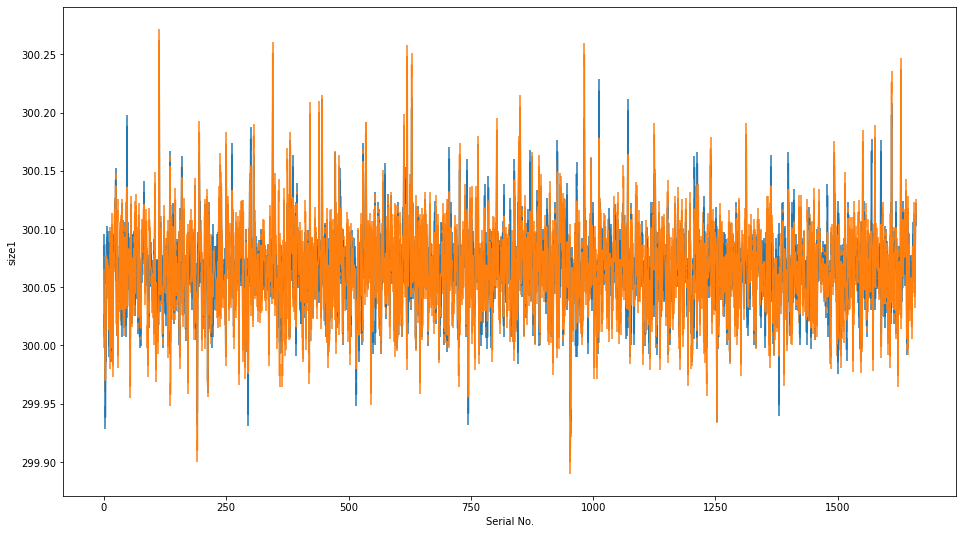

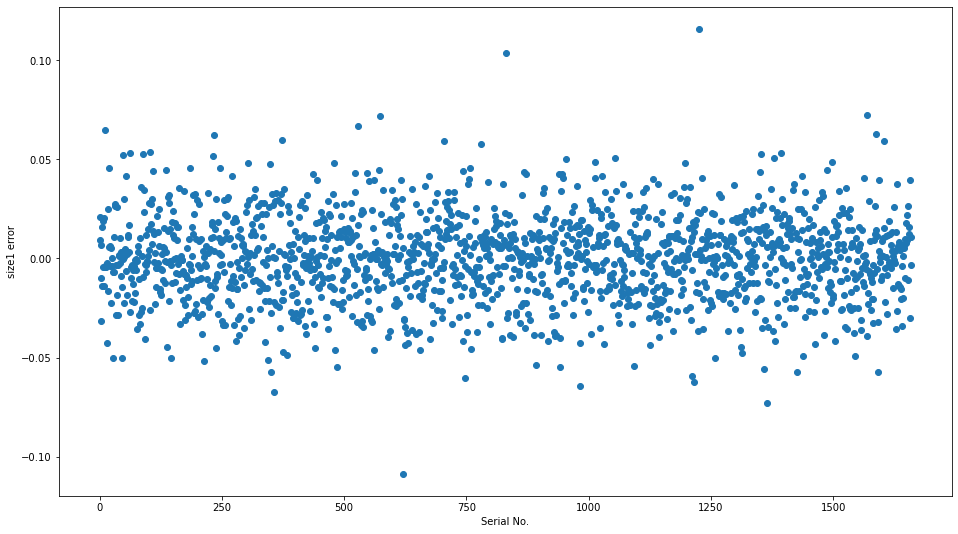

GB1均方差得分为： 0.0004657896139815954
现在进行的训练轮次为: 1
train index : [    0     2     3 ... 14937 14938 14939]
test index : [    1     6    12 ... 14929 14932 14936]
           size1  size2  size3
0     600.171631    0.0    0.0
1     600.033569    0.0    0.0
2     600.018188    0.0    0.0
3     599.892365    0.0    0.0
4     599.989502    0.0    0.0
...          ...    ...    ...
1655  600.135345    0.0    0.0
1656  600.163025    0.0    0.0
1657  600.163116    0.0    0.0
1658  600.127808    0.0    0.0
1659  600.227417    0.0    0.0

[1660 rows x 3 columns]


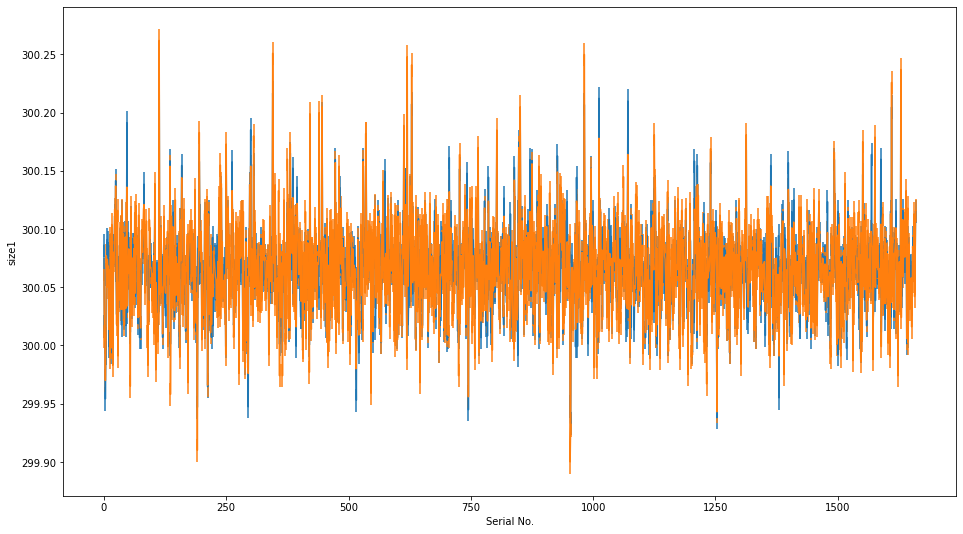

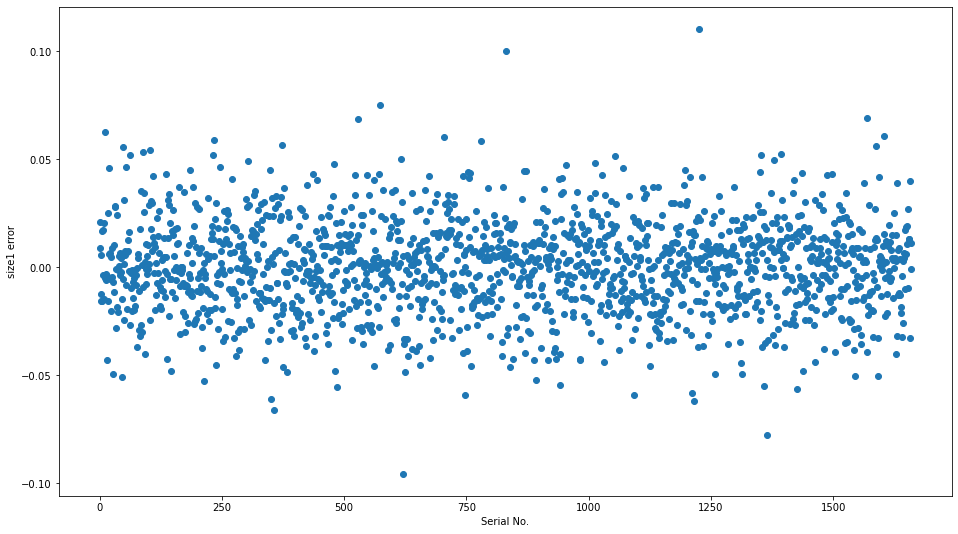

GB1均方差得分为： 0.0004569549918993741
现在进行的训练轮次为: 2
train index : [    1     2     3 ... 14936 14937 14938]
test index : [    0    22    25 ... 14926 14927 14939]
           size1  size2  size3
0     900.255463    0.0    0.0
1     900.047241    0.0    0.0
2     900.028076    0.0    0.0
3     899.837738    0.0    0.0
4     899.983307    0.0    0.0
...          ...    ...    ...
1655  900.202118    0.0    0.0
1656  900.243317    0.0    0.0
1657  900.250641    0.0    0.0
1658  900.190948    0.0    0.0
1659  900.341705    0.0    0.0

[1660 rows x 3 columns]


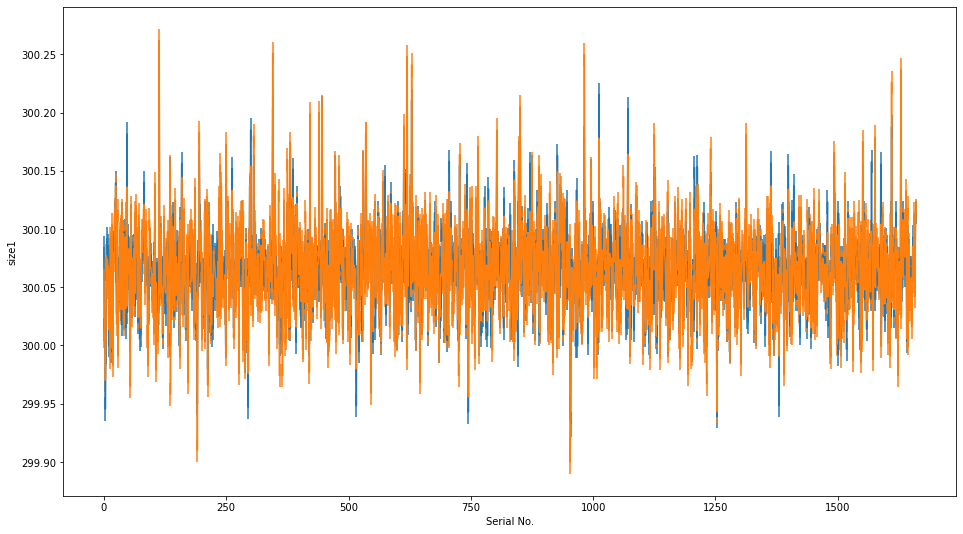

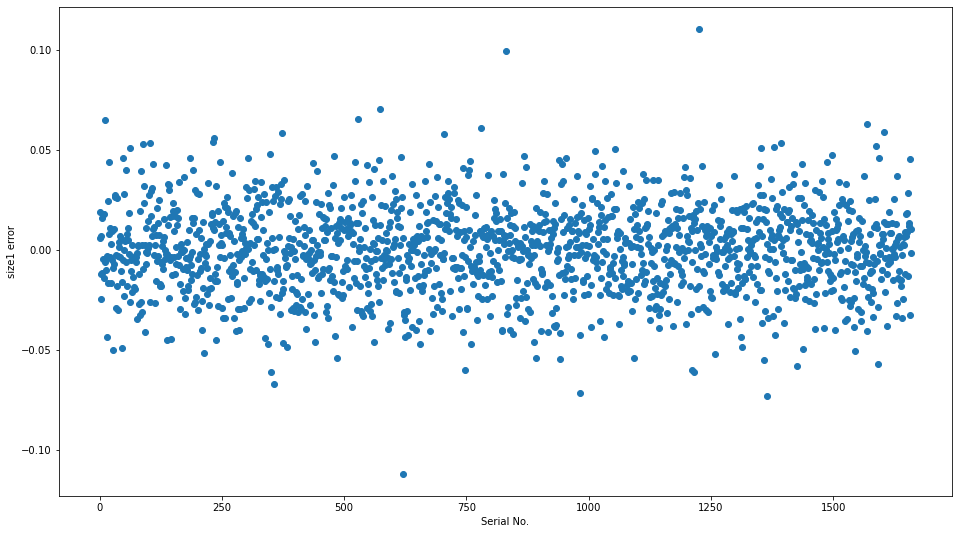

GB1均方差得分为： 0.00045867387748558023
现在进行的训练轮次为: 3
train index : [    0     1     2 ... 14935 14936 14939]
test index : [    4     9    10 ... 14934 14937 14938]
            size1  size2  size3
0     1200.338898    0.0    0.0
1     1200.063019    0.0    0.0
2     1200.034760    0.0    0.0
3     1199.783173    0.0    0.0
4     1199.978241    0.0    0.0
...           ...    ...    ...
1655  1200.268738    0.0    0.0
1656  1200.323181    0.0    0.0
1657  1200.336853    0.0    0.0
1658  1200.253967    0.0    0.0
1659  1200.454132    0.0    0.0

[1660 rows x 3 columns]


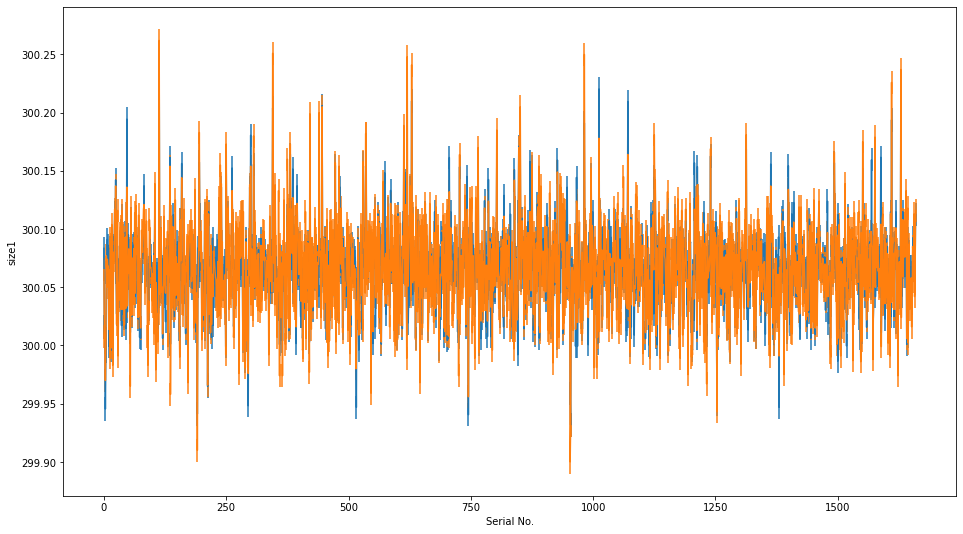

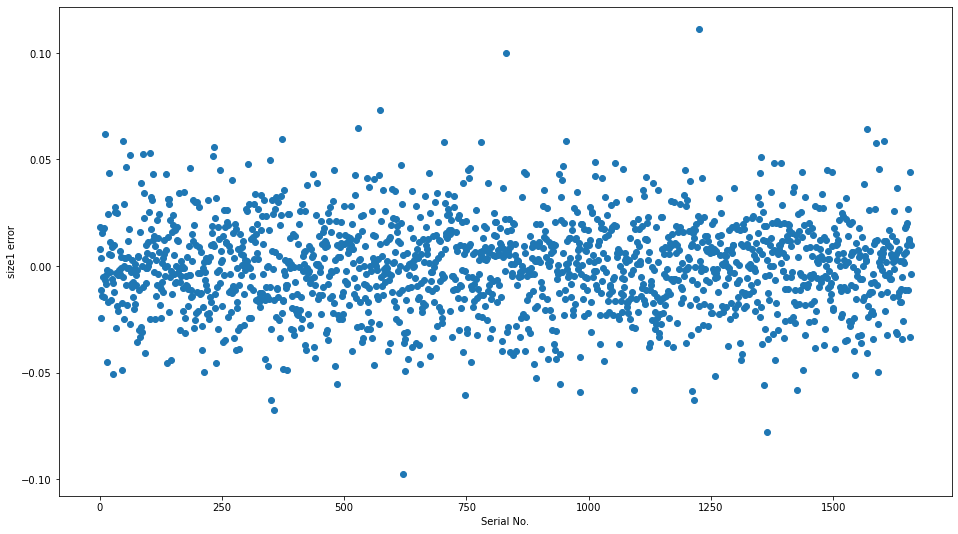

GB1均方差得分为： 0.00046005795221123016
现在进行的训练轮次为: 4
train index : [    0     1     2 ... 14937 14938 14939]
test index : [    3     5     7 ... 14931 14933 14935]
            size1  size2  size3
0     1500.423279    0.0    0.0
1     1500.078766    0.0    0.0
2     1500.042450    0.0    0.0
3     1499.728149    0.0    0.0
4     1499.973450    0.0    0.0
...           ...    ...    ...
1655  1500.336090    0.0    0.0
1656  1500.404083    0.0    0.0
1657  1500.423798    0.0    0.0
1658  1500.317505    0.0    0.0
1659  1500.568237    0.0    0.0

[1660 rows x 3 columns]


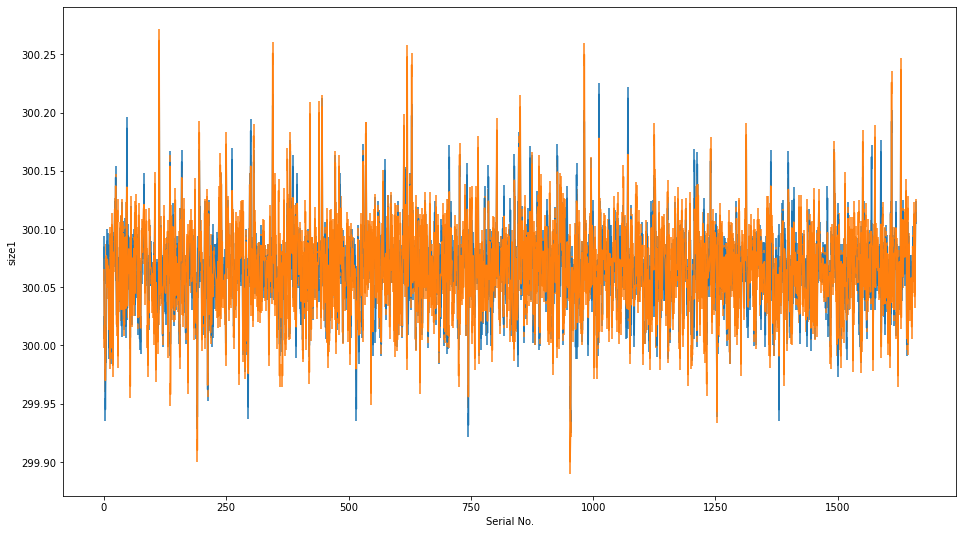

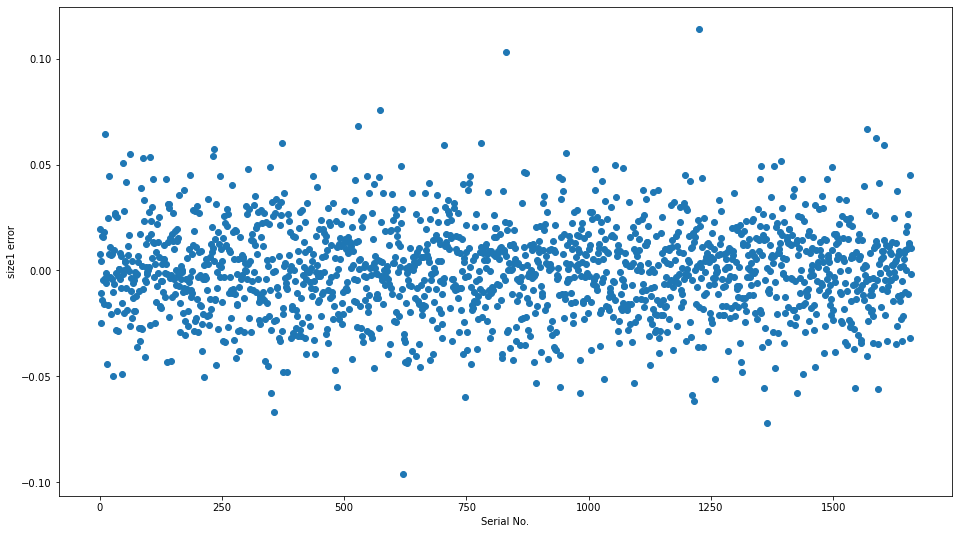

GB1均方差得分为： 0.00046365294873555735
++++++++++++++++++++++++++++++++++++++++++++
           size1  size2  size3
0     300.084656    0.0    0.0
1     300.015753    0.0    0.0
2     300.008490    0.0    0.0
3     299.945630    0.0    0.0
4     299.994690    0.0    0.0
...          ...    ...    ...
1655  300.067218    0.0    0.0
1656  300.080817    0.0    0.0
1657  300.084760    0.0    0.0
1658  300.063501    0.0    0.0
1659  300.113647    0.0    0.0

[1660 rows x 3 columns]
            size1  size2  size3
0      300.005804    0.0    0.0
1      300.016431    0.0    0.0
2      300.000348    0.0    0.0
3      299.999347    0.0    0.0
4      300.001801    0.0    0.0
...           ...    ...    ...
16595  300.114233    0.0    0.0
16596  300.113440    0.0    0.0
16597  300.114221    0.0    0.0
16598  300.114221    0.0    0.0
16599  300.113116    0.0    0.0

[16600 rows x 3 columns]
           size1  size2  size3
0     300.151050    0.0    0.0
1     300.151410    0.0    0.0
2     300.151141    0

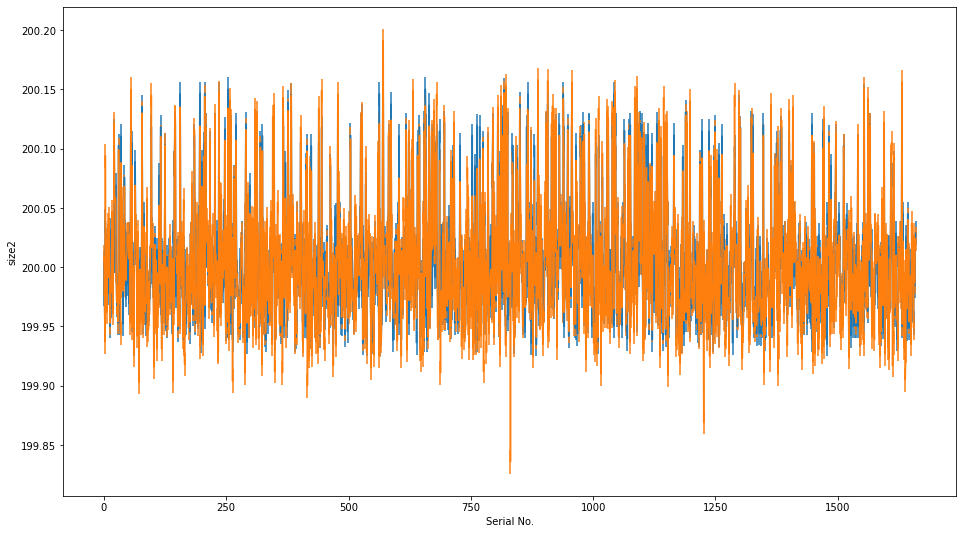

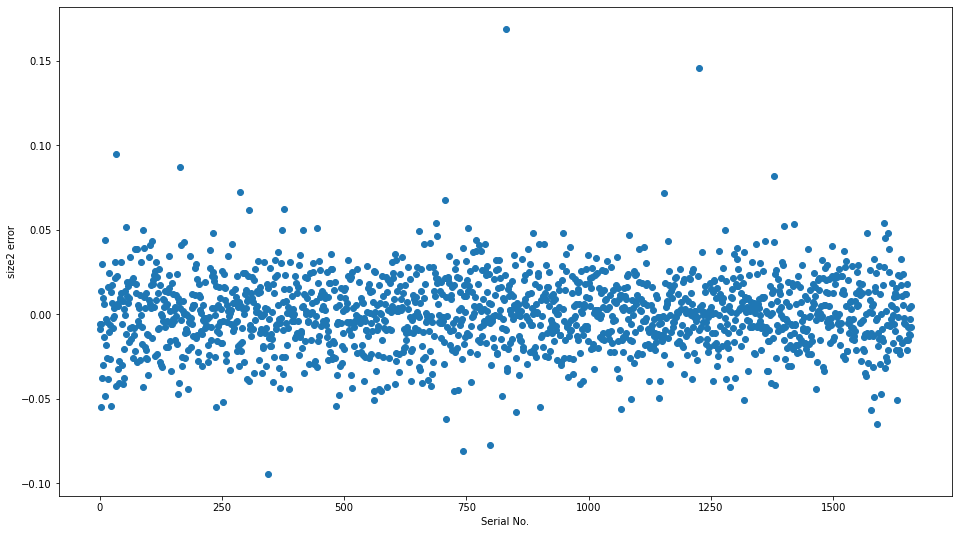

GB1均方差得分为： 0.0004599515064774919
现在进行的训练轮次为: 1
train index : [    0     1     2 ... 14936 14937 14938]
test index : [    4    10    16 ... 14912 14914 14939]
           size1       size2  size3
0     300.084656  400.012131    0.0
1     300.015753  399.954987    0.0
2     300.008490  399.904449    0.0
3     299.945630  400.075012    0.0
4     299.994690  399.942490    0.0
...          ...         ...    ...
1655  300.067218  399.905136    0.0
1656  300.080817  400.030930    0.0
1657  300.084760  399.972870    0.0
1658  300.063501  400.013474    0.0
1659  300.113647  400.057449    0.0

[1660 rows x 3 columns]


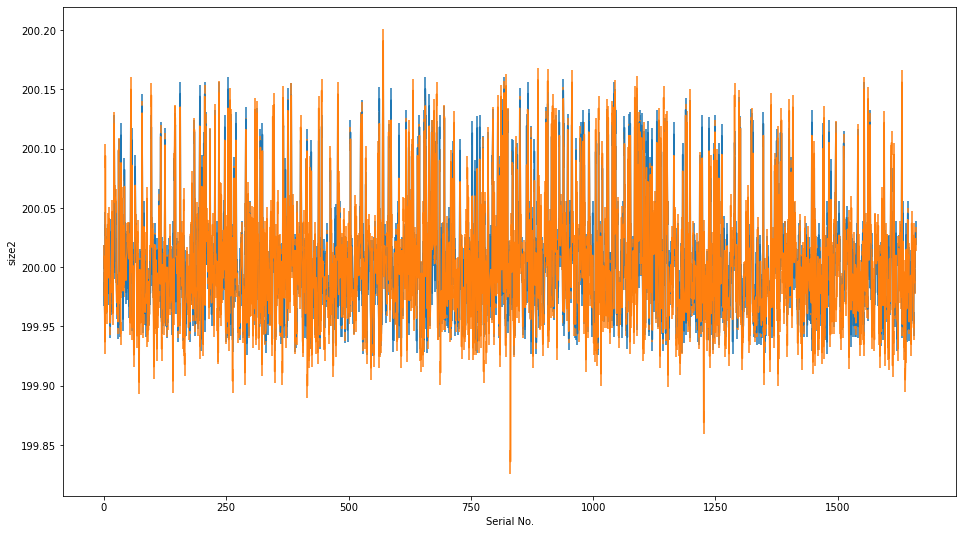

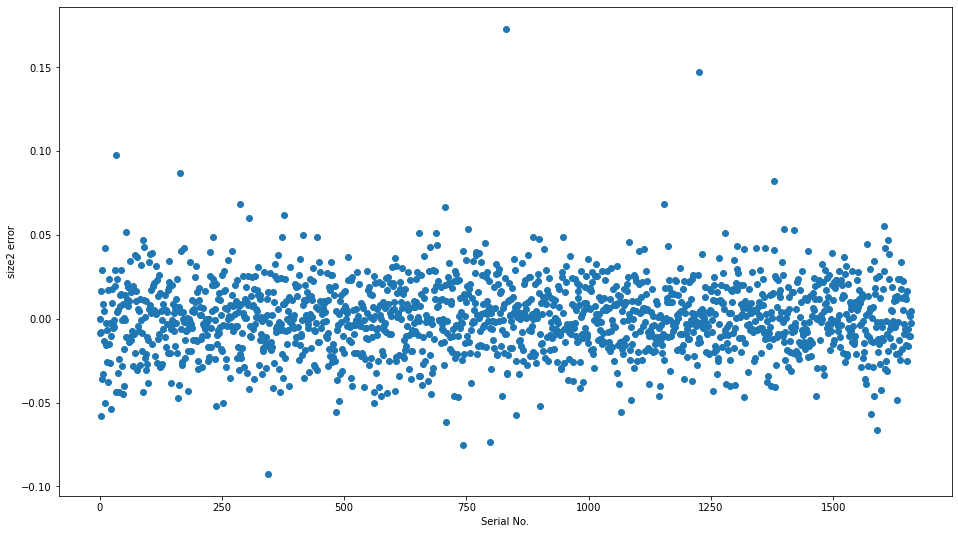

GB1均方差得分为： 0.00045749849588649927
现在进行的训练轮次为: 2
train index : [    0     1     2 ... 14937 14938 14939]
test index : [    6    11    13 ... 14926 14927 14936]
           size1       size2  size3
0     300.084656  600.021545    0.0
1     300.015753  599.932129    0.0
2     300.008490  599.856262    0.0
3     299.945630  600.120102    0.0
4     299.994690  599.918945    0.0
...          ...         ...    ...
1655  300.067218  599.856247    0.0
1656  300.080817  600.046677    0.0
1657  300.084760  599.959915    0.0
1658  300.063501  600.022491    0.0
1659  300.113647  600.090805    0.0

[1660 rows x 3 columns]


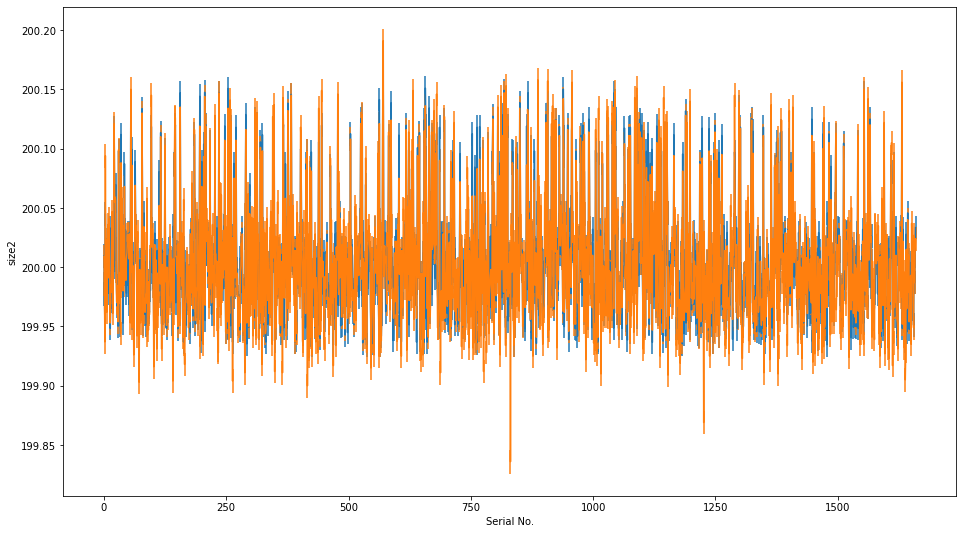

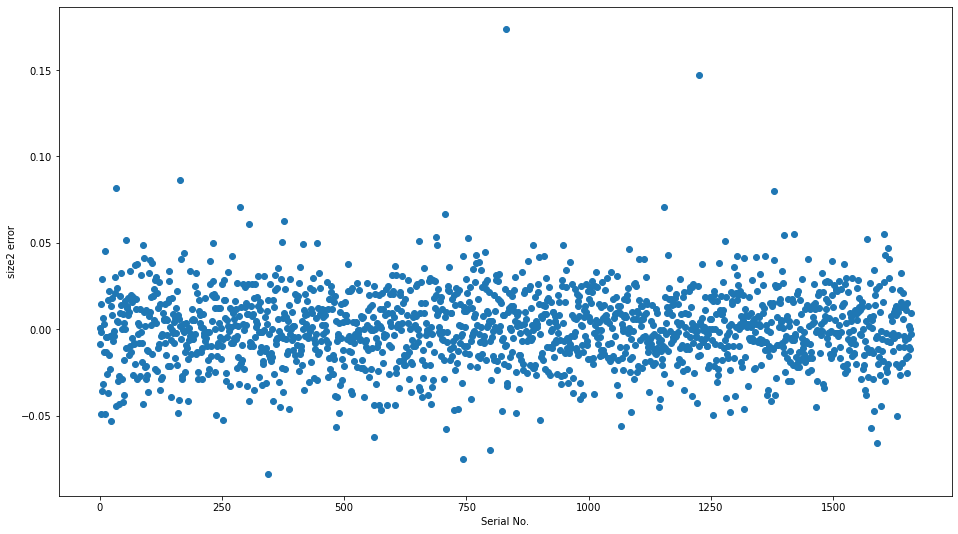

GB1均方差得分为： 0.00045581952469429555
现在进行的训练轮次为: 3
train index : [    0     1     4 ... 14937 14938 14939]
test index : [    2     3     5 ... 14928 14930 14931]
           size1       size2  size3
0     300.084656  800.031479    0.0
1     300.015753  799.909866    0.0
2     300.008490  799.809036    0.0
3     299.945630  800.148941    0.0
4     299.994690  799.890808    0.0
...          ...         ...    ...
1655  300.067218  799.807236    0.0
1656  300.080817  800.064804    0.0
1657  300.084760  799.940704    0.0
1658  300.063501  800.031876    0.0
1659  300.113647  800.119553    0.0

[1660 rows x 3 columns]


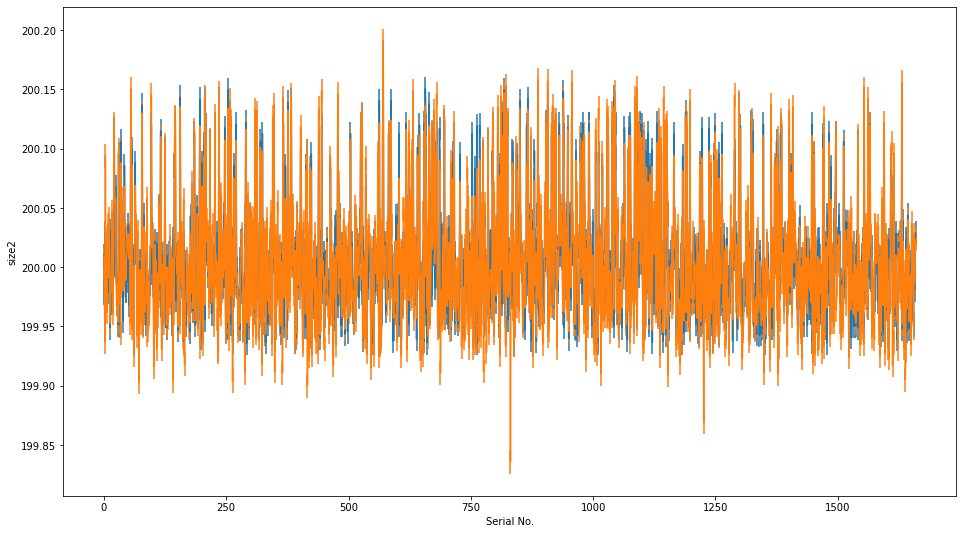

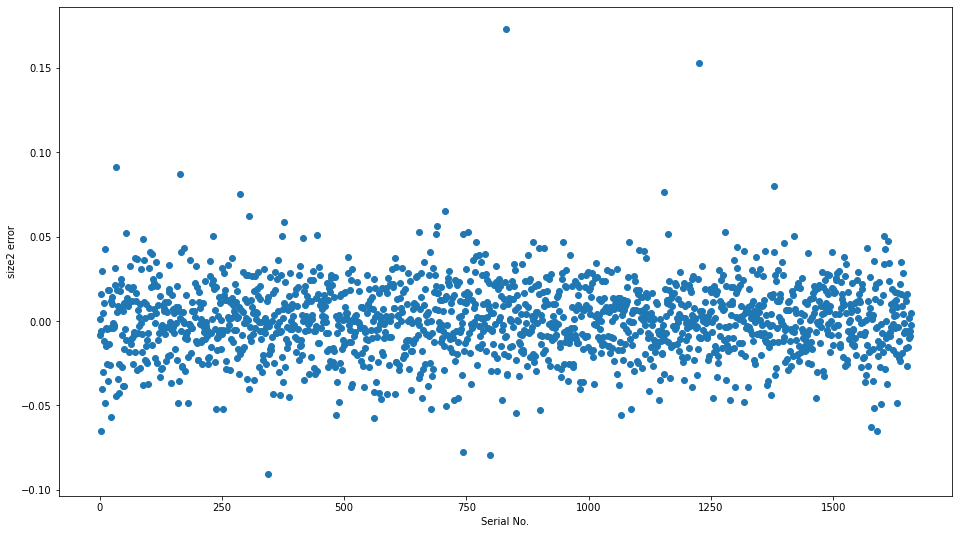

GB1均方差得分为： 0.0004624778483095
现在进行的训练轮次为: 4
train index : [    1     2     3 ... 14936 14938 14939]
test index : [    0     8     9 ... 14929 14935 14937]
           size1        size2  size3
0     300.084656  1000.040817    0.0
1     300.015753   999.888885    0.0
2     300.008490   999.760010    0.0
3     299.945630  1000.186813    0.0
4     299.994690   999.861862    0.0
...          ...          ...    ...
1655  300.067218   999.758835    0.0
1656  300.080817  1000.080093    0.0
1657  300.084760   999.927719    0.0
1658  300.063501  1000.042740    0.0
1659  300.113647  1000.150879    0.0

[1660 rows x 3 columns]


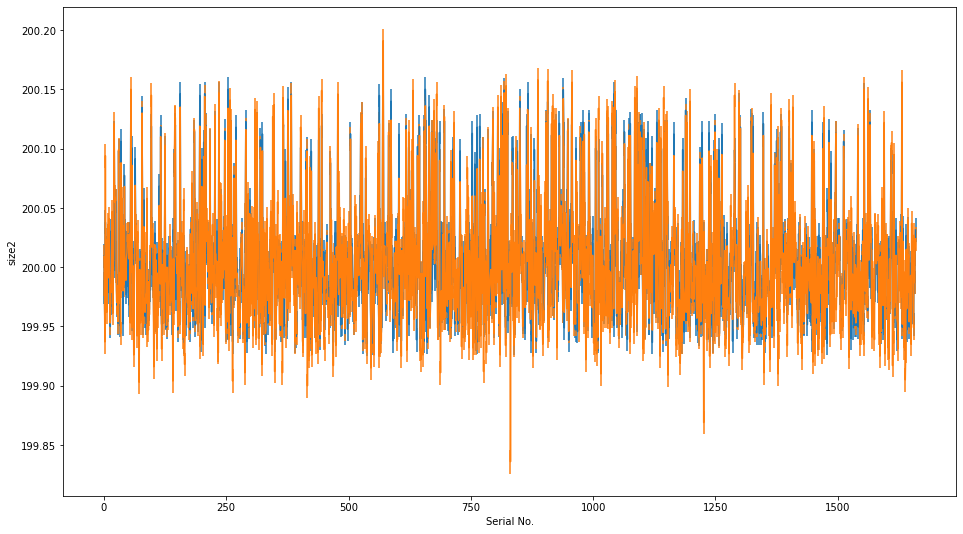

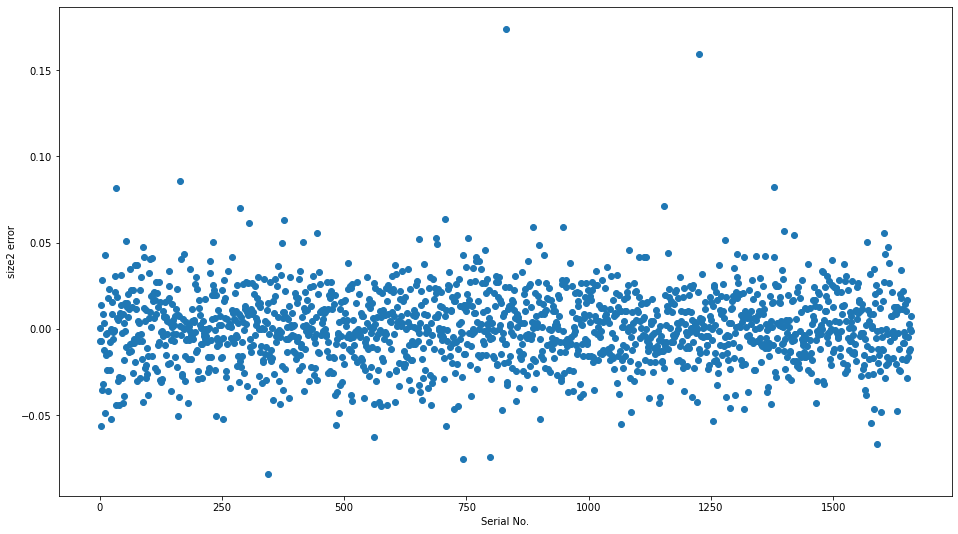

GB1均方差得分为： 0.000461822517147594
++++++++++++++++++++++++++++++++++++++++++++
           size1       size2  size3
0     300.084656  200.008163    0.0
1     300.015753  199.977777    0.0
2     300.008490  199.952002    0.0
3     299.945630  200.037363    0.0
4     299.994690  199.972372    0.0
...          ...         ...    ...
1655  300.067218  199.951767    0.0
1656  300.080817  200.016019    0.0
1657  300.084760  199.985544    0.0
1658  300.063501  200.008548    0.0
1659  300.113647  200.030176    0.0

[1660 rows x 3 columns]
            size1       size2  size3
0      300.005804  199.952045    0.0
1      300.016431  199.958102    0.0
2      300.000348  199.943103    0.0
3      299.999347  199.943103    0.0
4      300.001801  199.943207    0.0
...           ...         ...    ...
16595  300.114233  200.148215    0.0
16596  300.113440  200.146179    0.0
16597  300.114221  200.149167    0.0
16598  300.114221  200.146176    0.0
16599  300.113116  200.149893    0.0

[16600 rows x 3 colum

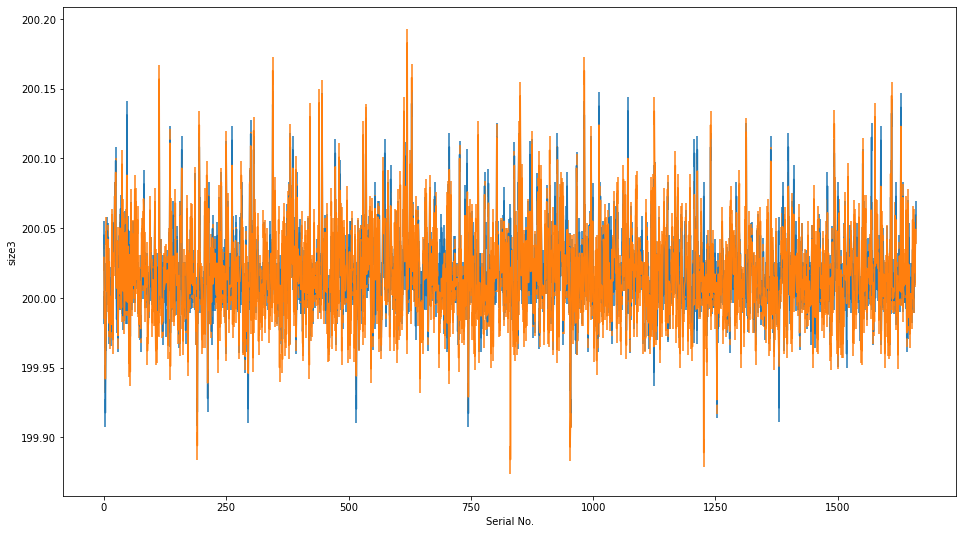

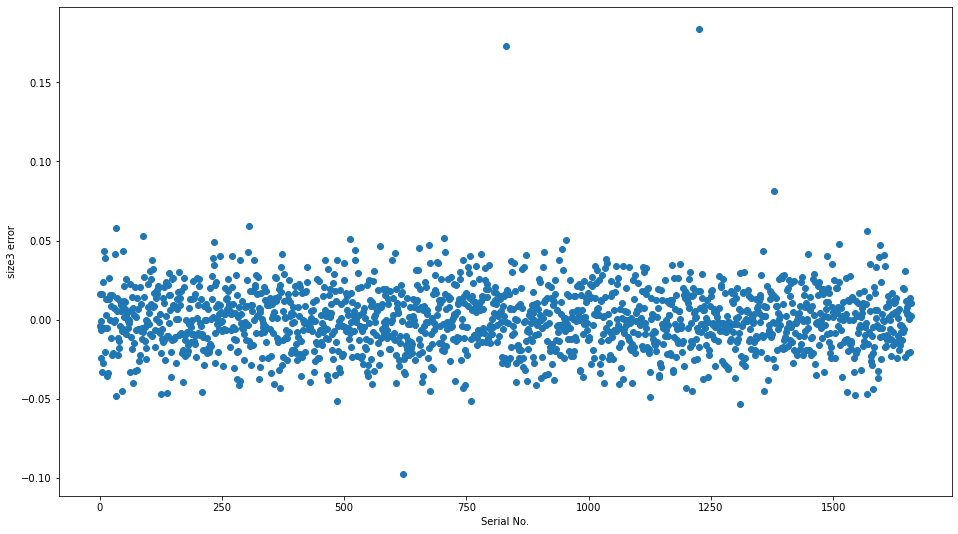

GB1均方差得分为： 0.00039150792607474855
现在进行的训练轮次为: 1
train index : [    0     1     3 ... 14936 14937 14938]
test index : [    2     7     8 ... 14933 14934 14939]
           size1       size2       size3
0     300.084656  200.008163  400.092468
1     300.015753  199.977777  399.982681
2     300.008490  199.952002  399.946182
3     299.945630  200.037363  399.842178
4     299.994690  199.972372  399.946396
...          ...         ...         ...
1655  300.067218  199.951767  400.001556
1656  300.080817  200.016019  400.065918
1657  300.084760  199.985544  400.065292
1658  300.063501  200.008548  400.038940
1659  300.113647  200.030176  400.116180

[1660 rows x 3 columns]


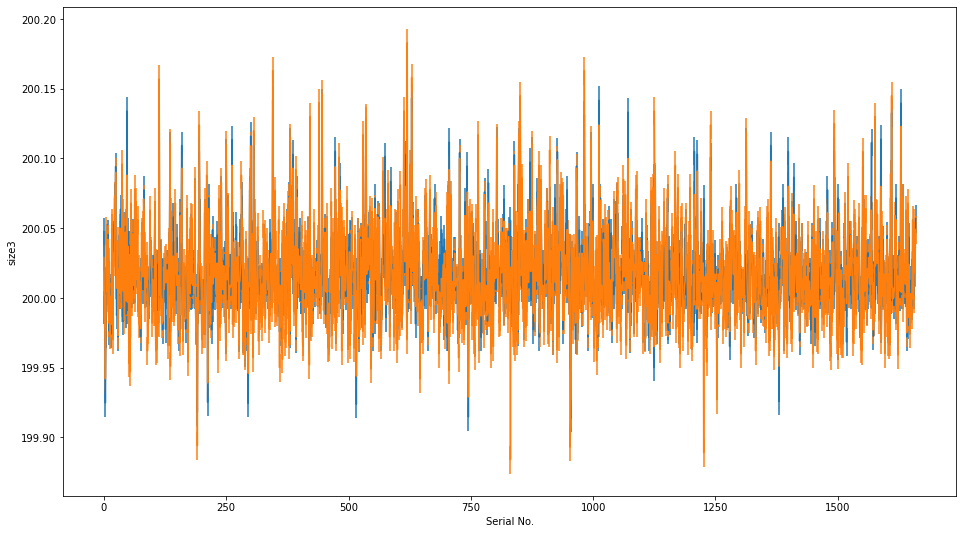

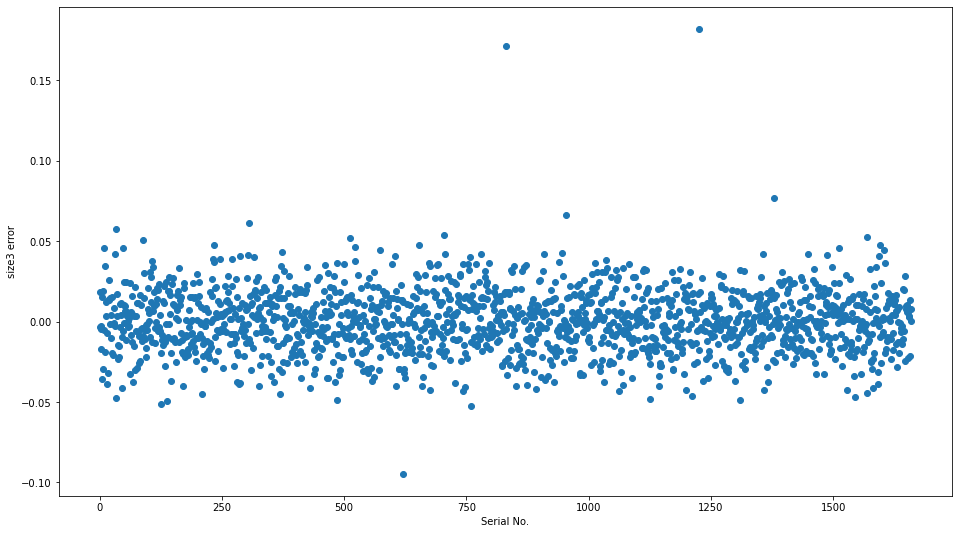

GB1均方差得分为： 0.00038902473694968945
现在进行的训练轮次为: 2
train index : [    0     1     2 ... 14937 14938 14939]
test index : [    3    11    12 ... 14912 14913 14930]
           size1       size2       size3
0     300.084656  200.008163  600.137497
1     300.015753  199.977777  599.973923
2     300.008490  199.952002  599.919739
3     299.945630  200.037363  599.763657
4     299.994690  199.972372  599.919724
...          ...         ...         ...
1655  300.067218  199.951767  600.001480
1656  300.080817  200.016019  600.098938
1657  300.084760  199.985544  600.097809
1658  300.063501  200.008548  600.058548
1659  300.113647  200.030176  600.174835

[1660 rows x 3 columns]


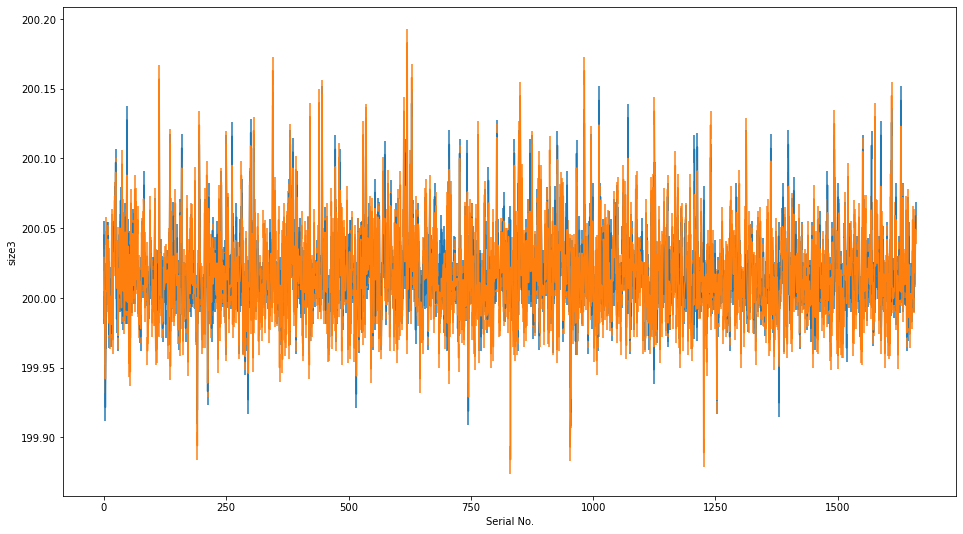

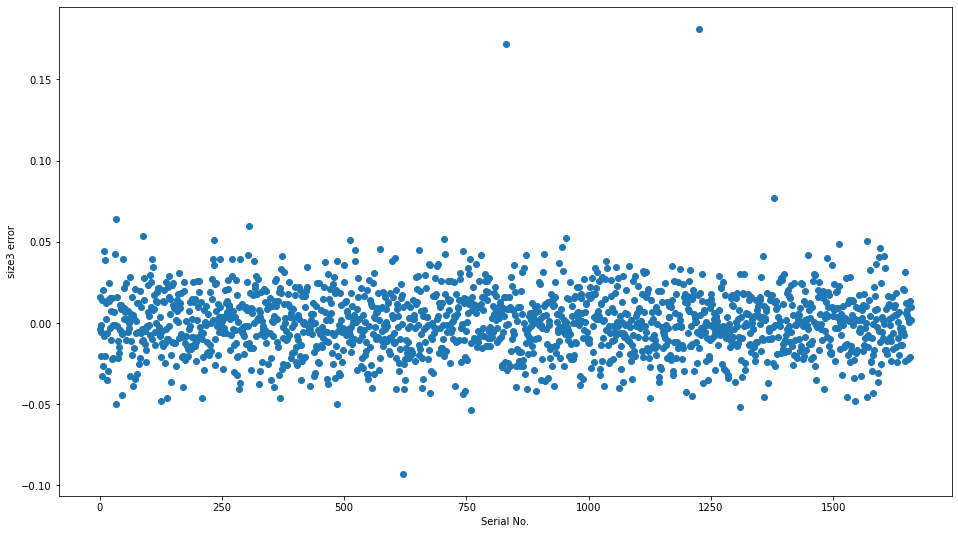

GB1均方差得分为： 0.000386892079874768
现在进行的训练轮次为: 3
train index : [    1     2     3 ... 14936 14937 14939]
test index : [    0     4    14 ... 14926 14928 14938]
           size1       size2       size3
0     300.084656  200.008163  800.183060
1     300.015753  199.977777  799.965042
2     300.008490  199.952002  799.892227
3     299.945630  200.037363  799.691177
4     299.994690  199.972372  799.892883
...          ...         ...         ...
1655  300.067218  199.951767  799.998825
1656  300.080817  200.016019  800.133041
1657  300.084760  199.985544  800.131577
1658  300.063501  200.008548  800.074692
1659  300.113647  200.030176  800.228180

[1660 rows x 3 columns]


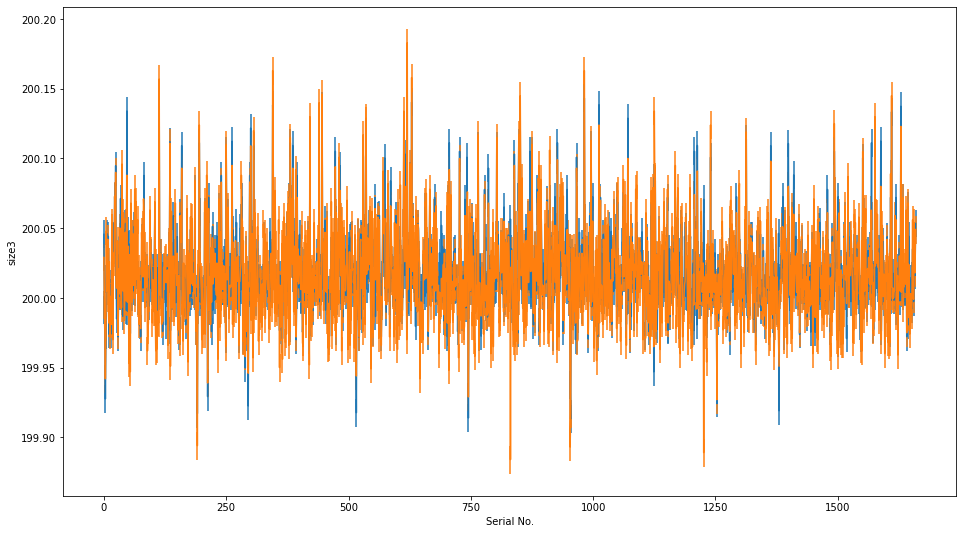

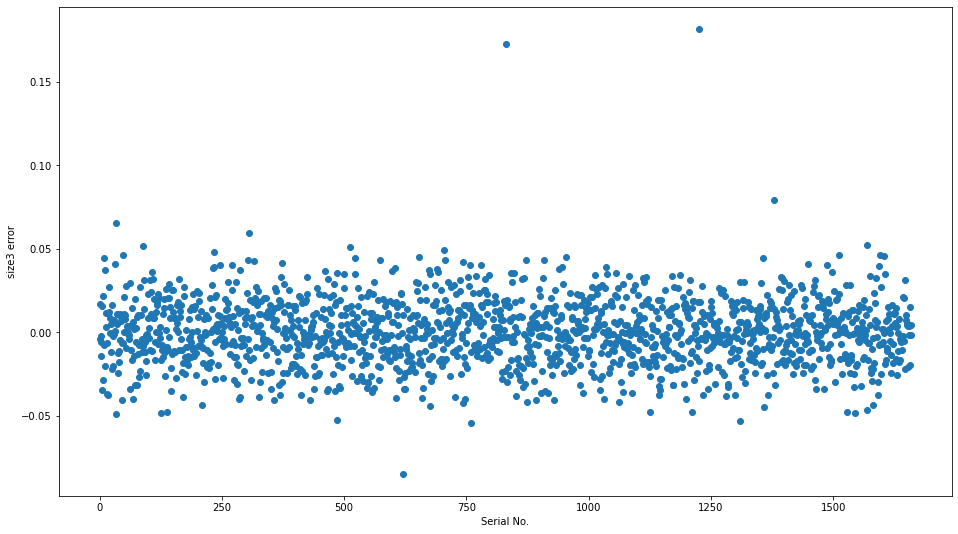

GB1均方差得分为： 0.00038822128225700006
现在进行的训练轮次为: 4
train index : [    0     1     2 ... 14937 14938 14939]
test index : [    6    10    16 ... 14929 14935 14936]
           size1       size2        size3
0     300.084656  200.008163  1000.228561
1     300.015753  199.977777   999.958588
2     300.008490  199.952002   999.864944
3     299.945630  200.037363   999.623840
4     299.994690  199.972372   999.865479
...          ...         ...          ...
1655  300.067218  199.951767   999.999130
1656  300.080817  200.016019  1000.166809
1657  300.084760  199.985544  1000.164581
1658  300.063501  200.008548  1000.094315
1659  300.113647  200.030176  1000.286636

[1660 rows x 3 columns]


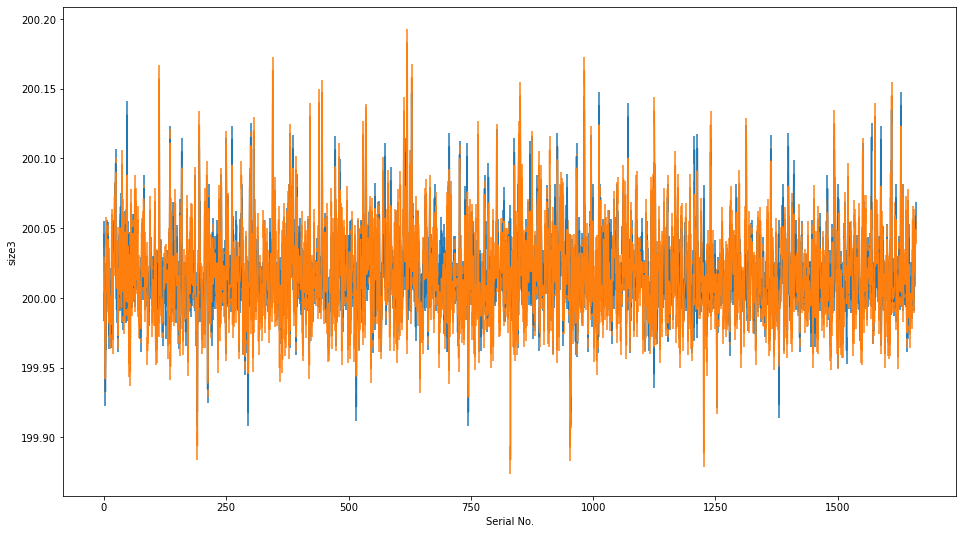

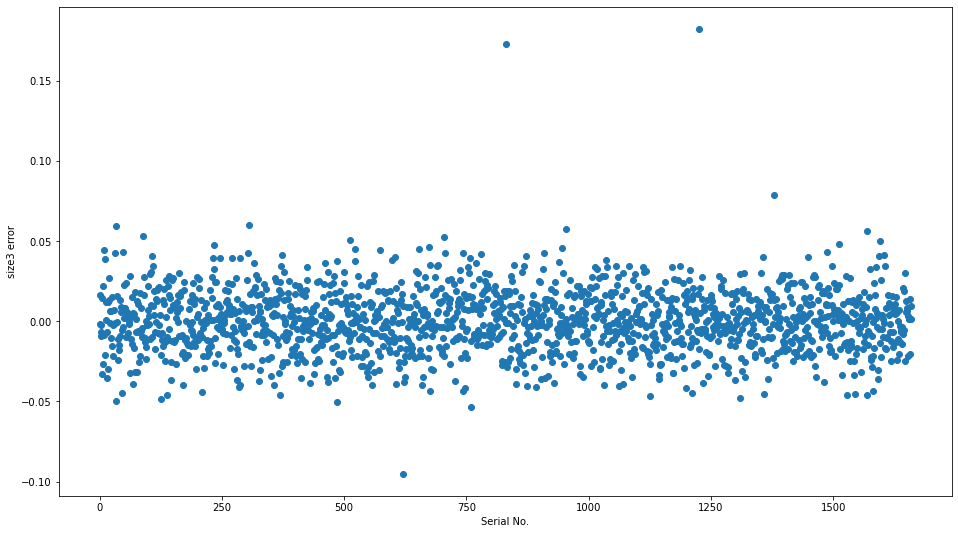

GB1均方差得分为： 0.0003872840032439124
++++++++++++++++++++++++++++++++++++++++++++
           size1       size2       size3
0     300.084656  200.008163  200.045712
1     300.015753  199.977777  199.991718
2     300.008490  199.952002  199.972989
3     299.945630  200.037363  199.924768
4     299.994690  199.972372  199.973096
...          ...         ...         ...
1655  300.067218  199.951767  199.999826
1656  300.080817  200.016019  200.033362
1657  300.084760  199.985544  200.032916
1658  300.063501  200.008548  200.018863
1659  300.113647  200.030176  200.057327

[1660 rows x 3 columns]
            size1       size2       size3
0      300.005804  199.952045  199.969464
1      300.016431  199.958102  199.976724
2      300.000348  199.943103  199.969745
3      299.999347  199.943103  199.969531
4      300.001801  199.943207  199.970776
...           ...         ...         ...
16595  300.114233  200.148215  200.061746
16596  300.113440  200.146179  200.061691
16597  300.114221  200.1491

In [33]:
from sklearn.model_selection import train_test_split

n_folds = 5
kf = KFold(n_splits = n_folds, shuffle = True)

n_test = np.zeros(((int(len(df_x_train)/10)), 3))
stacking_test_pred = pd.DataFrame(n_test, columns=['size1', 'size2', 'size3'])

n_train = np.zeros((len(df_y_train), 3))
stacking_train_pred = pd.DataFrame(n_train, columns=['size1', 'size2', 'size3'])

n_sub = np.zeros((len(df_x_sub), 3))
stacking_sub_pred = pd.DataFrame(n_sub, columns=['size1', 'size2', 'size3'])


for size in ['size1', 'size2', 'size3']:
    
    print('现在训练的尺寸是: ', size)
    
    x_pre_train, x_test, y_pre_train, y_test = train_test_split(
                                               df_x_stacking, df_y_train[size], random_state=1,
                                               train_size = 0.9, test_size=0.1)    
    
    count = 0
    
    for train_index, test_index in kf.split(x_pre_train):
        print('现在进行的训练轮次为:', count)
        print('train index :', train_index)
        print('test index :', test_index)
        x_t, x_v = x_pre_train.values[train_index], x_pre_train.values[test_index]
        y_t, y_v = y_pre_train.values[train_index], y_pre_train.values[test_index]

        stacking_xgb1.fit(x_t, y_t)
        stacking_pred = stacking_xgb1.predict(np.array(x_test))
        stacking_score = mean_squared_error(y_test, stacking_pred)

        # 将test train和sub的预测值每轮相加，最后求平均
        stacking_test_pred[size] += stacking_pred
        print(stacking_test_pred)
        stacking_train_pred[size] += stacking_xgb1.predict(np.array(df_x_stacking))
        stacking_sub_pred[size] += stacking_xgb1.predict(np.array(df_x_sub_stacking))

        plt_error(stacking_pred, y_test, size)
        print('GB1均方差得分为：', stacking_score)
        print('======================================================================')

        count += 1

    print('++++++++++++++++++++++++++++++++++++++++++++')
    stacking_test_pred[size] = stacking_test_pred[size] / n_folds
    print(stacking_test_pred)
    stacking_train_pred[size] = stacking_train_pred[size] / n_folds
    print(stacking_train_pred)
    stacking_sub_pred[size] = stacking_sub_pred[size] / n_folds
    print(stacking_sub_pred)



In [34]:
stacking_train_score = my_loss(np.array(stacking_train_pred), np.array(df_y_train))
stacking_train_score

array([6.85522104e+17, 2.03169151e+04, 1.48164390e+04])

In [35]:
stacking_test_score = my_loss(np.array(stacking_test_pred), np.array(y_2score_test))
stacking_test_score

array([ 1207.75110623, 92026.2296229 , 62938.43112023])